# This analysis is continued from nb_TE_blueprint_HSPC_Apr23.ipynb

# import packages

In [4]:
library(DESeq2)
library(data.table)
library(dplyr)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(clusterProfiler)
library(AnnotationDbi)
library(org.Hs.eg.db)
library(ggplot2)
library(gridExtra)
library(IRdisplay)
library(GGally)
library(ChIPpeakAnno)
library(IRdisplay)
library(ggpubr)
library(DiffBind)
library(kableExtra)
library(tidyverse)
library(ggraph)
library(tidygraph)
library(readxl)
library(corrplot)
library(ggrepel)
library(msigdbr)
library(fgsea)
library(ggvenn)
library(ComplexHeatmap)
library(ggVennDiagram)
library(venneuler)
library(sva)
library(DT)
library(tools)
library(tidyverse)
library(RSQLite)

library(edgeR)

txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene

source('~/script/utils.r')
setwd('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan//')
base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/' 

cell_types = c('HSC', 'MPP', 'CMP', 'GMP', 'MEP', 'CLP', 'EB', 'MK')

sample_names = c('HSC1', 'HSC2', 'HSC3', 'MPP1', 'MPP2', 'MPP3', 'CMP1', 'CMP2', 
                 'CMP3', 'GMP1', 'GMP2', 'GMP3', 'MEP1', 'MEP2', 'MEP3', 'MEP4', 'CLP1', 'CLP2', 'CLP3', 'EB1', 
                 'EB2', 'EB3', 'MK1', 'MK2', 'MK3')
sample_names_n24 = c('HSC1', 'HSC2', 'HSC3', 'MPP1', 'MPP2', 'MPP3', 'CMP1', 'CMP2', 
                 'CMP3', 'GMP1', 'GMP2', 'GMP3', 'MEP1', 'MEP2', 'MEP3', 'MEP4', 'CLP1', 'CLP3', 'EB1', 
                 'EB2', 'EB3', 'MK1', 'MK2', 'MK3')
lsc17 = c('CD34',  'HOXA5',  'ARHGAP22',  'LOC284422',  'KIAA0125',  'MMRN1',  'DNMT3B',  'SOCS2',  
          'CDK6',  'NGFRAP1',  'CPXM1',  'DPYSL3',  'ZBTB46', 'DPYSL3',  'NYNRIN',  'GPR56',  'AKR1C3',  'EMP1') 


# import the data for blueprint

## data import for blueprint

In [6]:
dsn_all_df = readRDS('data/dsn_all_df.rds')

dsn_all = as.data.table(dsn_all_df, keep.rownames = T)


In [7]:
mtx_all_df = readRDS('data/mtx_all_df.rds')
dsn_all_df = readRDS('data/dsn_all_df.rds')

dsn_all = as.data.table(dsn_all_df, keep.rownames = T)

dge_all      = readRDS('data/dge_all_may1.rds')
fit_all      = readRDS('data/fit_all_may1.rds')
logcpm_all_t = readRDS('data/logcpm_all_t_may1.rds') 
logcpm_all   = readRDS('data/logcpm_all_may1.rds') 

dge_coding      = readRDS('data/dge_coding_may1.rds') 
fit_coding      = readRDS('data/fit_coding_may1.rds') 
deg_coding_dt   = readRDS('data/fit_coding_may1.rds') 
logcpm_coding_t = readRDS('data/logcpm_coding_t_may1.rds') 
logcpm_coding   = readRDS('data/logcpm_coding_may1.rds') 

dge_te      = readRDS('data/dge_te_may1.rds')
fit_te      = readRDS('data/fit_te_may1.rds')
deg_te_dt   = readRDS('data/fit_te_may1.rds')
logcpm_te_t = readRDS('data/logcpm_te_t_may1.rds')
logcpm_te   = readRDS('data/logcpm_te_may1.rds')

coding_genes = read.table('coding_gene_list', header = F)$V1
te_genes = read.table('te_gene_list', header = F)$V1

mtx_coding_df = mtx_all_df[coding_genes, ]
mtx_te_df = mtx_all_df[!rownames(mtx_all_df) %in% coding_genes, ]

te_dt = readRDS('data/te_dt_may08.rds')

dsn6 = fread('data/organized_sample_table.xls')

telocal_sel_seqino_ann = fread('data/telocal_sel_seqino_ann.tsv')
telocal_sel = fread('data/telocal_sel_seqino.tsv')

#telocal_sel = (telocal_sel_seqino, file = 'data/telocal_sel_may29.xls', sep = '\t')

telocal_sel = fread(file = 'data/telocal_sel.tsv')


In [12]:
deg_telocal_MEPCMP = fread(file = 'data/deg_telocal_MEPCMP_15Jul.tsv', header = T)
deg_MEPCMP = fread(file = 'data/deg_MEPCMPSep23.tsv', header = T)
logcpm_CMP = read.table(file = 'data/logcpm_CMP_15Jul.tsv')
logcpm_MEP = read.table(file = 'data/logcpm_MEP_15Jul.tsv')
logcpm_telocal_CMP = read.table(file = 'data/logcpm_telocal_CMP_15Jul.tsv')
logcpm_telocal_MEP = read.table(file = 'data/logcpm_telocal_MEP_15Jul.tsv')
dsn_telocal = read.table('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan//data/dsn_telocal.tsv')


In [15]:
logcpm_telocal_CMP = read.table(file = 'data/logcpm_telocal_CMP_15Jul.tsv')


In [9]:
logcpm_telocal = readRDS(file = 'data/logcpm_telocal.rds')
deg_telocal_dt = readRDS(file = 'data/deg_telocal_list_may15.rds')
deg_telocal_dt[, updn := 'up']
deg_telocal_dt[logFC < 0, updn := 'dn']


In [16]:
head(logcpm_telocal_CMP)

,HSC1,HSC2,HSC3,CMP1,CMP2,CMP3,GMP1,GMP2,GMP3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Charlie1_dup1003:Charlie1a:hAT-Charlie:DNA,0.000000,2.728771,3.733977,0.000000,0,0.0000000,4.163230,0.0000000,0.000000
Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA,4.284673,3.555230,2.870205,0.000000,0,0.0000000,4.528531,5.2446337,4.243828
Charlie1_dup205:Charlie1a:hAT-Charlie:DNA,0.000000,4.207710,2.572787,2.530557,0,0.5480386,4.838179,3.8469507,4.831272
Charlie1_dup298:Charlie1a:hAT-Charlie:DNA,2.865376,2.604525,1.953190,2.141750,0,0.0000000,2.860992,2.0215473,3.407842
Charlie1_dup342:Charlie1a:hAT-Charlie:DNA,0.000000,1.851249,1.953190,4.309579,0,0.0000000,3.894231,1.3368788,4.259231
Charlie1_dup416:Charlie1a:hAT-Charlie:DNA,2.747779,3.388723,2.682053,2.809805,0,0.0000000,0.000000,0.6604762,5.143611


In [11]:
telocal_sel_list_1 = lapply(cell_types, function(ctype){
    deg_telocal_dt[.id == ctype, ] %>% group_by(updn) %>% slice_min(PValue, n = 20)
})
telocal_sel_list_2 = deg_telocal_dt[FDR < 0.1, ]
telocal_sel = rbindlist(c(telocal_sel_list_1, list(telocal_sel_list_2)))
telocal_sel[, tag := paste0(.id, '_', rn)]
telocal_sel = telocal_sel[!duplicated(tag), ]
head(telocal_sel)
dim(telocal_sel)

.id,rn,logFC,logCPM,PValue,FDR,class_id,family_id,gene_id,tx_id,updn,tag
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
HSC,L1MD_dup2024:L1MD:L1:LINE,-5.351829,10.686590,0.006267821,1,LINE,L1,L1MD,L1MD_dup2024,dn,HSC_L1MD_dup2024:L1MD:L1:LINE
HSC,AluJr_dup6543:AluJr:Alu:SINE,-6.687467,9.314801,0.007097942,1,SINE,Alu,AluJr,AluJr_dup6543,dn,HSC_AluJr_dup6543:AluJr:Alu:SINE
HSC,AluJb_dup31324:AluJb:Alu:SINE,-3.793383,9.220092,0.012262250,1,SINE,Alu,AluJb,AluJb_dup31324,dn,HSC_AluJb_dup31324:AluJb:Alu:SINE
HSC,AluJb_dup176723:AluJb:Alu:SINE,-3.729088,7.535264,0.012912024,1,SINE,Alu,AluJb,AluJb_dup176723,dn,HSC_AluJb_dup176723:AluJb:Alu:SINE
HSC,AluJb_dup138484:AluJb:Alu:SINE,-3.995137,9.181538,0.014095934,1,SINE,Alu,AluJb,AluJb_dup138484,dn,HSC_AluJb_dup138484:AluJb:Alu:SINE
HSC,MER20_dup15289:MER20:hAT-Charlie:DNA,-5.594704,6.415809,0.015551106,1,DNA,hAT-Charlie,MER20,MER20_dup15289,dn,HSC_MER20_dup15289:MER20:hAT-Charlie:DNA


[1] 900  12

In [12]:
fwrite(telocal_sel, file = 'data/telocal_sel.tsv', sep = '\t') 

In [10]:
telocal_sel = fread(file = 'data/telocal_sel.tsv', sep = '\t')


In [13]:
table(telocal_sel$.id)


CLP CMP  EB GMP HSC MEP  MK MPP 
 40  40  41  40  40 613  46  40 

## import design tables for blueprint

In [14]:
dsn_all_df = readRDS('data/dsn_all_df.rds')
dsn_bp = fread(file = 'data/organized_sample_table.xls', sep = '\t')


In [15]:
colnames(dsn_bp)

[1] "sample_name"            "cell_type"              "SAMPLE_DESC_2"         
 [4] "SAMPLE_DESC_3"          "R1"                     "R2"                    
 [7] "count_file"             "sample_dir"             "fastq_r1_trimmed"      
[10] "fastq_r2_trimmed"       "cutadapt_jobname"       "cutadapt_oo"           
[13] "cutadapt_eo"            "cutadapt_cmd"           "star_jobname"          
[16] "star_oo"                "star_eo"                "bam_prefix"            
[19] "bam_file"               "star_cmd"               "tecount_jobname"       
[22] "tecount_oo"             "tecount_eo"             "tecount_cmd"           
[25] "telocal_jobname"        "telocal_oo"             "telocal_eo"            
[28] "telocal_cmd"            "telocal_count_file_ori" "telocal_count_file"    
[31] "cmd"                    "tag"                    "cell_type_replication" 
[34] "sample_name_id"

In [13]:
# tecount use the mtx
dsn_bp[!duplicated(sample_name_id), .(sample_name_id, cell_type, telocal_count_file, sample_dir)]

sample_name_id,cell_type,telocal_count_file,sample_dir
<chr>,<chr>,<chr>,<chr>
MEP1,MEP,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_C000WYB3_MEP_RNA_Seq_A1/telocal_cntTable,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_C000WYB3_MEP_RNA_Seq_A1/
EB1,EB,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_C006MUB1_EB_RNA_Seq_A31/telocal_cntTable,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_C006MUB1_EB_RNA_Seq_A31/
MK1,MK,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_C006NSB1_MK_RNA_Seq_A31/telocal_cntTable,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_C006NSB1_MK_RNA_Seq_A31/
EB2,EB,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_C006NSB2_EB_RNA_Seq_A31/telocal_cntTable,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_C006NSB2_EB_RNA_Seq_A31/
EB3,EB,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_C006POB1_EB_RNA_Seq_A31/telocal_cntTable,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_C006POB1_EB_RNA_Seq_A31/
CLP2,CLP,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_S000SBB3_CLP_RNA_Seq_A34/telocal_cntTable,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_S000SBB3_CLP_RNA_Seq_A34/
MK2,MK,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_S0018AB4_MK_RNA_Seq_A31/telocal_cntTable,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_S0018AB4_MK_RNA_Seq_A31/
MK3,MK,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_S00198B6_MK_RNA_Seq_A31/telocal_cntTable,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_S00198B6_MK_RNA_Seq_A31/
MPP3,MPP,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/Blueprint_S001FXB3_MPP_RNA_Seq_A34

In [14]:
unique(dsn_bp$cell_type)

[1] "MEP" "EB"  "MK"  "CLP" "MPP" "HSC" "CMP" "GMP"

In [15]:
dim(dsn_bp)

[1] 84 34

In [17]:
mtx_bp = readRDS('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/mtx_all_df.rds')

In [18]:
dim(mtx_bp)

[1] 58824    25

# import data for RNASeq from GSE

- nb_ranseq_resource_list.ipynb

In [19]:
base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/TE/'
data_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/GSE74246/' 
setwd(base_dir)

In [20]:
dsn_batch2 = as.data.table(read.table(file = 'dsn_sample_RNASeq_batch2_dt.tsv'), keep.rownames = T)


In [23]:
file.exists(dsn_batch2$telocal_file)

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[31] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[46] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[61] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[76] TRUE TRUE TRUE TRUE TRUE TRUE

In [21]:
tecount_mtx_batch2 = read.table(file = 'tecount_mtx_batch2.tsv', sep = '\t')


# import data for monocyte and macrophage

In [22]:
monmac_mtx = read.table('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/TE/Macraphge_Monocyte_DC/tecount_sample_normal_df.tsv')

In [23]:
dsn_monmac = as.data.table(read.table('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/TE/Macraphge_Monocyte_DC/dsn_sample_normal.tsv'), keep.rownames = T)

# combine design table

In [51]:
colnames(dsn_all_df)

[1] "cell_type"

In [24]:
tmp1 = as.data.table(dsn_all_df, keep.rownames = T) 
head(tmp1)

rn,cell_type
<chr>,<fct>
HSC1,HSC
HSC2,HSC
HSC3,HSC
MPP1,MPP
MPP2,MPP
MPP3,MPP


In [25]:
tmp2 = dsn_batch2[, .(sample_name2, cell_type)]
head(tmp2)

sample_name2,cell_type
<chr>,<chr>
D1022_B_rep1,B
D1022_CD4T_rep1,CD4T
D1022_CD8T_rep1,CD8T
D1022_NK_rep1,NK
D2596_B_rep1,B
D2596_CD4T_rep1,CD4T


In [26]:
table(tmp2$cell_type)


    B Blast  CD4T  CD8T   CLP   CMP   Ery   GMP   HSC  LMPP   LSC   MEP  Mono 
    4    12     4     4     3     4     3     4     4     3     8     4     4 
  MPP    NK  pHSC 
    4     4    12 

In [27]:
tmp2 = tmp2[!cell_type %in% c('CLP', 'GMP', 'HSC', 'MEP', 'MPP', 'HSC', 'CMP', 'LMPP'), ] 
table(tmp2$cell_type)



    B Blast  CD4T  CD8T   Ery   LSC  Mono    NK  pHSC 
    4    12     4     4     3     8     4     4    12 

In [28]:
tmp2[cell_type == 'Blast', ]

sample_name2,cell_type
<chr>,<chr>
SU048_Blast_rep1,Blast
SU070_Blast_rep1,Blast
SU209_Blast_rep1,Blast
SU351_Blast_rep1,Blast
SU353_Blast_rep1,Blast
SU444_Blast_rep1,Blast
SU484_Blast_rep1,Blast
SU496_Blast_rep1,Blast
SU501_Blast_rep1,Blast


In [29]:
dsn_monmac[grep('BDCA2CD2PpDC', sample_name), cell_type := 'CD2P_pDC']
dsn_monmac[grep('BDCA2CD2NpDC', sample_name), cell_type := 'CD2N_pDC']
dsn_monmac[grep('CD141DC', sample_name), cell_type := 'cDC1']
dsn_monmac[grep('CD1cDC', sample_name), cell_type := 'cDC2']


In [30]:
tmp3 = dsn_monmac[, .(sample_name, cell_type)]
table(tmp3$cell_type)


  CD2N_pDC   CD2P_pDC       cDC1       cDC2 Macrophage   Monocyte 
         3          3          3          2          3          6 

In [31]:
dsn_list = list(tmp1, tmp2, tmp3)
names(dsn_list) = c('bp', 'gse74246', 'monmac')
dsn = rbindlist(dsn_list, idcol = T, use.names = F)
setnames(dsn, c('batch', 'sample_name', 'cell_type'))
head(dsn)

batch,sample_name,cell_type
<chr>,<chr>,<fct>
bp,HSC1,HSC
bp,HSC2,HSC
bp,HSC3,HSC
bp,MPP1,MPP
bp,MPP2,MPP
bp,MPP3,MPP


In [32]:
dsn = dsn[sample_name != 'CLP2', ]

In [33]:
table(dsn$batch, dsn$cell_type)

          
           HSC MPP CMP GMP MEP CLP EB MK  B CD4T CD8T NK Ery Mono Blast pHSC
  bp         3   3   3   3   4   2  3  3  0    0    0  0   0    0     0    0
  gse74246   0   0   0   0   0   0  0  0  4    4    4  4   3    4    12   12
  monmac     0   0   0   0   0   0  0  0  0    0    0  0   0    0     0    0
          
           LSC CD2N_pDC CD2P_pDC cDC1 cDC2 Macrophage Monocyte
  bp         0        0        0    0    0          0        0
  gse74246   8        0        0    0    0          0        0
  monmac     0        3        3    3    2          3        6

In [34]:
cell_types_3batch = c('HSC', 'MPP', 'CMP', 'GMP', 'MEP', 'CLP', 'pHSC', 'LSC', 'Blast', 'EB', 'MK', 'NK', 'Ery', 'Mono', 'Macrophage', 'Monocyte', 'B', 'CD4T', 'CD8T', 'CD2N_pDC', 'CD2P_pDC', 'cDC1', 'cDC2')
cell_types_3batch

[1] "HSC"        "MPP"        "CMP"        "GMP"        "MEP"       
 [6] "CLP"        "pHSC"       "LSC"        "Blast"      "EB"        
[11] "MK"         "NK"         "Ery"        "Mono"       "Macrophage"
[16] "Monocyte"   "B"          "CD4T"       "CD8T"       "CD2N_pDC"  
[21] "CD2P_pDC"   "cDC1"       "cDC2"

In [35]:
dsn = dsn[order(cell_type), ]


In [36]:
dsn_df = setDF(dsn, rownames = dsn$sample_name)


# combine reads

In [37]:
dim(mtx_bp)

[1] 58824    25

In [38]:
mtx_bp = mtx_bp[, colnames(mtx_bp) != 'CLP2']
head(mtx_bp)

,CLP1,CLP3,CMP1,CMP2,CMP3,EB1,EB2,EB3,GMP1,GMP2,⋯,MEP1,MEP2,MEP3,MEP4,MK1,MK2,MK3,MPP1,MPP2,MPP3
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
A1BG,29,276,630,1635,692,18,8,6,103,1450,⋯,446,1820,465,103,88,72,71,95,1261,39
A1BG-AS1,1,288,0,909,656,33,24,17,28,298,⋯,139,480,1044,113,215,139,79,171,52,0
A1CF,0,0,0,0,0,103,135,38,269,0,⋯,0,0,0,0,62,123,89,9,0,125
A2M,1072,166,3874,2383,485,133,272,58,534,1740,⋯,802,562,241,2504,161,864,379,1230,1842,1168
A2M-AS1,1826,0,841,501,991,6,0,4,165,1551,⋯,989,1131,0,833,5,16,3,133,17,87
A2ML1,0,219,0,3,0,128,178,128,670,0,⋯,0,0,130,0,74,184,650,440,3,0


In [39]:
ov = intersect(rownames(mtx_bp), intersect(rownames(monmac_mtx), rownames(tecount_mtx_batch2)))
length(ov)

[1] 58824

In [40]:
count_mtx = cbind(mtx_bp[ov, ], cbind(monmac_mtx[ov, ], tecount_mtx_batch2[ov, ]))

In [41]:
count_mtx = count_mtx[, dsn$sample_name] 


In [42]:
all(colnames(count_mtx) == dsn$sample_name)

[1] TRUE

In [43]:
head(dsn)

,batch,sample_name,cell_type
,<chr>,<chr>,<fct>
HSC1,bp,HSC1,HSC
HSC2,bp,HSC2,HSC
HSC3,bp,HSC3,HSC
MPP1,bp,MPP1,MPP
MPP2,bp,MPP2,MPP
MPP3,bp,MPP3,MPP


# TEcount summary

Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


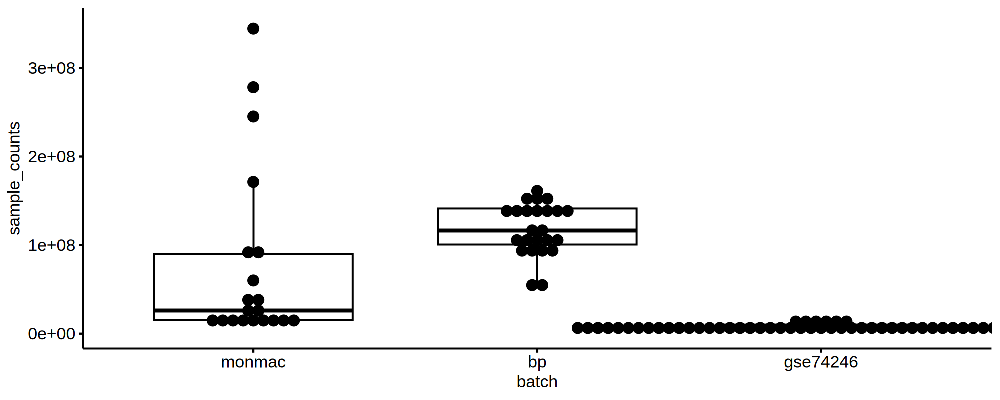

In [44]:
plotdat = as.data.table(apply(count_mtx, 2, sum), keep.rownames = T)
setnames(plotdat, c('sample_name', 'sample_counts'))
plotdat = merge(plotdat, dsn, by.x = 'sample_name', by.y = 'sample_name')
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
ggboxplot(plotdat, x = 'batch', y = 'sample_counts', add = 'dotplot')

# batch correction

In [45]:
count_mtx_batch = ComBat_seq(counts = as.matrix(count_mtx), batch = dsn$batch)


Found 3 batches
Using null model in ComBat-seq.
Adjusting for 0 covariate(s) or covariate level(s)
Estimating dispersions
Fitting the GLM model
Shrinkage off - using GLM estimates for parameters
Adjusting the data


In [46]:
head(count_mtx_batch)

,HSC1,HSC2,HSC3,MPP1,MPP2,MPP3,CMP1,CMP2,CMP3,GMP1,⋯,CD1cDC_normal_rep3,Macrophage_Breast_rep1,Macrophage_Breast_rep2,Macrophage_Endometrial_rep1,Monocyte_normal_rep1,Monocyte_normal_rep2,Monocyte_normal_rep3,Monocyte_normal_rep4,Monocyte_normal_rep5,Monocyte_normal_rep6
A1BG,222,55,31,73,826,32,428,1061,464,78,⋯,24,33,5,15,0,116,11,317,283,369
A1BG-AS1,0,114,33,245,118,0,0,834,635,79,⋯,20,22,13,5,1,19,2,249,169,165
A1CF,1,11,39,3,0,25,0,0,0,54,⋯,0,1,0,1,0,20,0,0,0,0
A2M,9723,620,273,2209,4790,2723,16936,7564,200,255,⋯,31,2139,2269,4594,0,364,83,458,592,586
A2M-AS1,1209,50,136,278,70,190,1125,751,1243,327,⋯,69,160,216,515,0,44,6,41,142,42
A2ML1,315,33,48,153,4,0,0,4,0,218,⋯,2,192,10,44,0,42,0,661,173,77


In [47]:
dim(count_mtx_batch)

[1] 58824    99

Bin width defaults to 1/30 of the range of the data. Pick better value with `binwidth`.


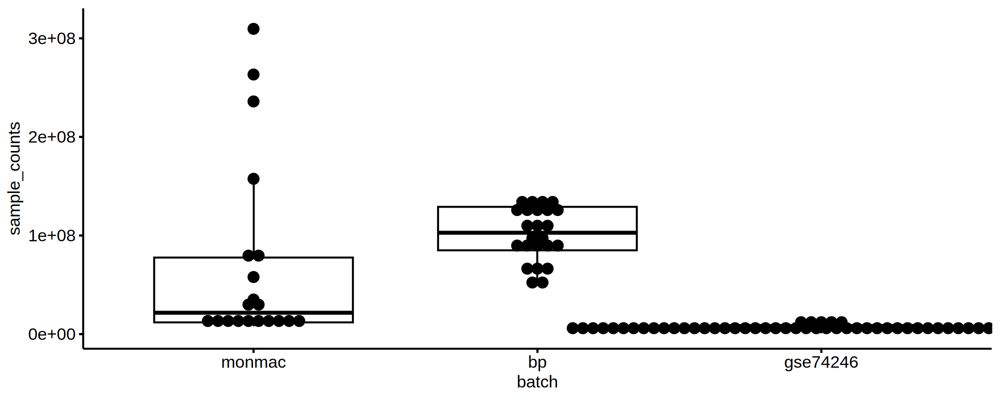

In [153]:
plotdat = as.data.table(apply(count_mtx_batch, 2, sum), keep.rownames = T)
setnames(plotdat, c('sample_name', 'sample_counts'))
plotdat = merge(plotdat, dsn, by.x = 'sample_name', by.y = 'sample_name')
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
ggboxplot(plotdat, x = 'batch', y = 'sample_counts', add = 'dotplot')

# calculate logcpm

In [48]:
# take all together for logcpm
subtype = factor(dsn$cell_type)
subtype = relevel(subtype, ref = 'HSC')

dge_temp = DGEList(counts=count_mtx_batch, group = subtype)
dge_temp <- calcNormFactors(dge_temp)

keep = filterByExpr(dge_temp)
dge_temp = dge_temp[keep, , keep.lib.sizes=FALSE]
dge_temp = normLibSizes(dge_temp)
design = model.matrix( ~  subtype)
dge_temp = estimateDisp(dge_temp, design)
fit_all = glmQLFit(dge_temp, design, robust = T)

logcpm_3batch = log1p(cpm(dge_temp, normalize = T))
logcpm_3batch_t = merge(as.data.table(t(logcpm_3batch), keep.rownames = T), dsn, by.x = 'rn', by.y = 'sample_name', all.x = T)
head(logcpm_3batch_t)


rn,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2MP1,A4GALT,AAAS,⋯,Zaphod:hAT-Tip100:DNA,hAT-1_Mam:hAT-Tag1:DNA,hAT-4b_Ther:hAT-Tip100:DNA,hAT-5_Mam:hAT-Tag1:DNA,hAT-N1_Mam:hAT-Tip100:DNA,hAT-N1a_Mam:hAT-Tip100:DNA,teucerv1_5edge:Unknown:Unknown,teucerv2_3edge:Unknown:Unknown,batch,cell_type
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
BDCA2CD2NpDC_normal_rep1,2.0829329,1.839764,0.0000000,1.073456,1.357949,0.00000000,0.00000000,0.09191688,3.541053,⋯,2.860073,4.108941,2.335879,3.624014,1.955187,2.755562,0.6743399,1.776639,monmac,CD2N_pDC
BDCA2CD2NpDC_normal_rep2,2.1132489,1.846801,0.0000000,1.318149,2.105151,0.12529939,0.42784677,1.38716259,3.768513,⋯,3.003477,4.136839,2.168172,3.722799,2.072085,2.722377,1.1428856,2.037889,monmac,CD2N_pDC
BDCA2CD2NpDC_normal_rep3,2.0264547,1.866955,0.3611647,1.115375,2.611172,0.00000000,0.91285601,1.60485566,3.740963,⋯,3.011922,4.107284,2.212738,3.681729,1.857302,2.651429,1.4127273,2.163979,monmac,CD2N_pDC
BDCA2CD2PpDC_normal_rep1,1.4152250,1.188159,0.0000000,1.688249,1.065008,0.07328248,0.07328248,0.07328248,3.496826,⋯,3.007499,4.157014,2.040055,3.926449,2.169684,2.973098,0.6077957,1.584686,monmac,CD2P_pDC
BDCA2CD2PpDC_normal_rep2,2.0024253,1.878909,0.1750063,1.352946,2.190203,0.00000000,0.48339759,1.00110354,3.740512,⋯,3.234152,4.246369,2.553945,3.875190,1.871578,2.922911,1.1170994,1.982870,monmac,CD2P_pDC
BDCA2CD2PpDC_normal_rep3,0.6258572,1.531340,0.7700144,1.332567,2.371486,0.00000000,0.19676838,0.10321613,3.675149,⋯,3.382737,4.405449,2.655278,4.037889,2.153060,3.082087,0.1353825,1.322960,monmac,CD2P_pDC


In [241]:
dim(count_mtx_batch)

[1] 58824    99

In [157]:
head(logcpm_3batch)


,HSC1,HSC2,HSC3,MPP1,MPP2,MPP3,CMP1,CMP2,CMP3,GMP1,⋯,CD1cDC_normal_rep3,Macrophage_Breast_rep1,Macrophage_Breast_rep2,Macrophage_Endometrial_rep1,Monocyte_normal_rep1,Monocyte_normal_rep2,Monocyte_normal_rep3,Monocyte_normal_rep4,Monocyte_normal_rep5,Monocyte_normal_rep6
A1BG,1.097635312,0.6917385,0.5272200,0.47962375,1.99851011,0.3598840,1.343339,2.28641691,1.617361,0.4873645,⋯,1.1580605,0.5617437,0.3356049,0.41730765,0.0000000,0.7340435,0.37585801,0.8993795,0.8310873,0.9727346
A1BG-AS1,0.000000000,1.1206646,0.5533125,1.12024547,0.64770556,0.0000000,0.000000,2.07296937,1.876187,0.4922979,⋯,1.0366637,0.4071205,0.7114017,0.15924324,0.1311878,0.1633663,0.07969138,0.7632812,0.5731383,0.5513786
A1CF,0.008955592,0.1818522,0.6277380,0.02497856,0.00000000,0.2914814,0.000000,0.00000000,0.000000,0.3610137,⋯,0.0000000,0.0225833,0.0000000,0.03394202,0.0000000,0.1712676,0.00000000,0.0000000,0.0000000,0.0000000
A2M,4.482621581,2.5047902,1.9620053,2.97676268,3.63723200,3.6338812,4.727877,4.15917569,1.008425,1.1161713,⋯,1.3404284,3.9091240,5.2038376,5.07270916,0.0000000,1.4815844,1.49122647,1.1335363,1.3112145,1.2844420
A2M-AS1,2.474514337,0.6452856,1.3976279,1.20711722,0.43211559,1.2730993,2.133391,1.98195045,2.469967,1.2900183,⋯,1.9848956,1.5378211,2.9029352,2.93280224,0.0000000,0.3442833,0.22222983,0.1727628,0.5008942,0.1716438
A2ML1,1.343825469,0.4689473,0.7299201,0.82853010,0.03041908,0.0000000,0.000000,0.03278235,0.000000,1.0135028,⋯,0.1671905,1.6836777,0.5864372,0.92389520,0.0000000,0.3309552,0.00000000,1.3963300,0.5834107,0.2951297


In [243]:
te_genes

[1] "5S-Deu-L2"      "acro"           "Alu"            "centr"          "CR1"            "Crypton"        "Crypton-A"      "DNA"            "DNA?"           "Dong-R4"        "ERV1"          
[12] "ERVK"           "ERVL"           "ERVL-MaLR"      "Gypsy"          "hAT"            "hAT?"           "hAT-Ac"         "hAT-Blackjack"  "hAT-Charlie"    "hAT-hAT19"      "hAT-Tag1"      
[23] "hAT-Tip100"     "hAT-Tip100?"    "Helitron"       "I-Jockey"       "Kolobok"        "L1"             "L1-Tx1"         "L2"             "Low_complexity" "LTR"            "Merlin"        
[34] "MIR"            "MULE-MuDR"      "Penelope"       "PIF-Harbinger"  "PiggyBac"       "RTE-BovB"       "RTE-X"          "Satellite"      "srpRNA"         "subtelo"        "SVA"           
[45] "TcMar"          "TcMar-Mariner"  "TcMar-Pogo"     "TcMar-Tc1"      "TcMar-Tc2"      "TcMar-Tigger"   "Unknown"

# Significant DEGs in blueprint and 3 batches

In [49]:
dsn_all_df24 = dsn_all_df[rownames(dsn_all_df) != 'CLP2', ,drop = F]
head(dsn_all_df24)

,cell_type
,<fct>
HSC1,HSC
HSC2,HSC
HSC3,HSC
MPP1,MPP
MPP2,MPP
MPP3,MPP


In [220]:
dim(row_sel)

[1] 129  12

In [64]:
head()

,HSC1,HSC2,HSC3,MPP1,MPP2,MPP3,CMP1,CMP2,CMP3,GMP1,⋯,CD1cDC_normal_rep3,Macrophage_Breast_rep1,Macrophage_Breast_rep2,Macrophage_Endometrial_rep1,Monocyte_normal_rep1,Monocyte_normal_rep2,Monocyte_normal_rep3,Monocyte_normal_rep4,Monocyte_normal_rep5,Monocyte_normal_rep6
A1BG,1.097635312,0.6917385,0.5272200,0.47962375,1.99851011,0.3598840,1.343339,2.28641691,1.617361,0.4873645,⋯,1.1580605,0.5617437,0.3356049,0.41730765,0.0000000,0.7340435,0.37585801,0.8993795,0.8310873,0.9727346
A1BG-AS1,0.000000000,1.1206646,0.5533125,1.12024547,0.64770556,0.0000000,0.000000,2.07296937,1.876187,0.4922979,⋯,1.0366637,0.4071205,0.7114017,0.15924324,0.1311878,0.1633663,0.07969138,0.7632812,0.5731383,0.5513786
A1CF,0.008955592,0.1818522,0.6277380,0.02497856,0.00000000,0.2914814,0.000000,0.00000000,0.000000,0.3610137,⋯,0.0000000,0.0225833,0.0000000,0.03394202,0.0000000,0.1712676,0.00000000,0.0000000,0.0000000,0.0000000
A2M,4.482621581,2.5047902,1.9620053,2.97676268,3.63723200,3.6338812,4.727877,4.15917569,1.008425,1.1161713,⋯,1.3404284,3.9091240,5.2038376,5.07270916,0.0000000,1.4815844,1.49122647,1.1335363,1.3112145,1.2844420
A2M-AS1,2.474514337,0.6452856,1.3976279,1.20711722,0.43211559,1.2730993,2.133391,1.98195045,2.469967,1.2900183,⋯,1.9848956,1.5378211,2.9029352,2.93280224,0.0000000,0.3442833,0.22222983,0.1727628,0.5008942,0.1716438
A2ML1,1.343825469,0.4689473,0.7299201,0.82853010,0.03041908,0.0000000,0.000000,0.03278235,0.000000,1.0135028,⋯,0.1671905,1.6836777,0.5864372,0.92389520,0.0000000,0.3309552,0.00000000,1.3963300,0.5834107,0.2951297


In [ ]:
gene_sel = c('ZNF311', 'ZNF711', 'STAT3', 'STAT5', 'NR1H3', 'NR1H4', 'SPI1', 'BCL11A', 'RBPJ', 'CTCF', 
             'FOXA1', 'SF1', 'HOXA9', 'LIN28A', 'UPC2', 'DAZAP1', 'CNOT4', 'ZKSCAN1', 'HNRNPA2B1'
)
gene_sel = intersect(gene_sel, rownames(logcpm_3batch))
plotdat = logcpm_3batch[
row_sel = deg_te_dt[logFC < -1 & FDR < 0.1, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_3batch[row_sel$rn, rownames(dsn_all_df24)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df24[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df24$cell_type, levels = cell_types))  


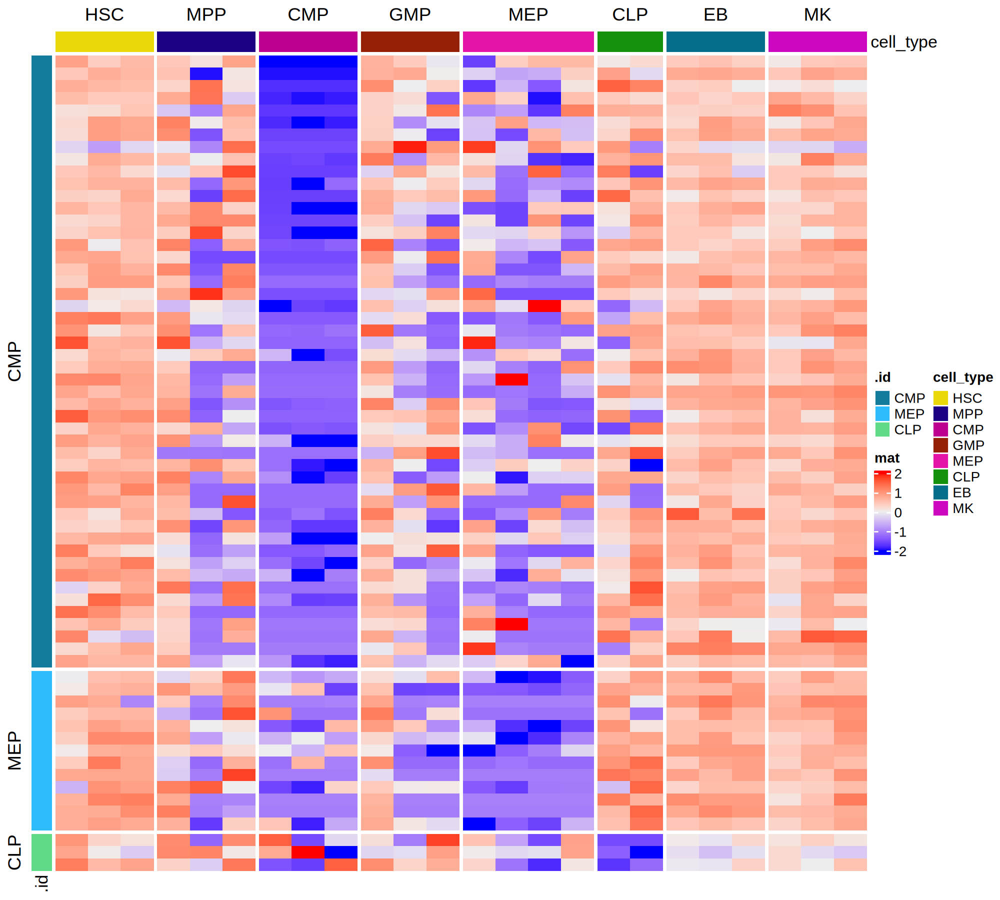

In [224]:
# significant TEs

row_sel = deg_te_dt[logFC < -1 & FDR < 0.1, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df24)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df24[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df24$cell_type, levels = cell_types))  


In [226]:
head(deg_te_dt)

.id,rn,logFC,logCPM,PValue,FDR,sel,idd,class_id,family_id,gene_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<int>,<chr>,<chr>,<chr>
HSC,FLAM_C:Alu:SINE,-0.9128241,12.467095,0.003354908,0.5944787,NA,1,SINE,Alu,FLAM_C
HSC,UCON44:TcMar-Tigger:DNA,-1.6884823,7.812925,0.004110851,0.5944787,NA,2,DNA,TcMar-Tigger,UCON44
HSC,L1ME3G:L1:LINE,-0.5030516,12.483404,0.005752892,0.5944787,NA,3,LINE,L1,L1ME3G
HSC,L1ME4a:L1:LINE,-0.5586001,12.695243,0.007049395,0.5944787,NA,4,LINE,L1,L1ME4a
HSC,MER33:hAT-Charlie:DNA,-0.7200624,10.986634,0.008228203,0.5944787,NA,5,DNA,hAT-Charlie,MER33
HSC,ERVL-B4-int:ERVL:LTR,0.6461831,8.966138,0.009950680,0.5944787,NA,6,LTR,ERVL,ERVL-B4-int


In [234]:
table(deg_te_dt$.id)


 CLP  CMP   EB  GMP  HSC  MEP   MK  MPP 
1270 1270 1270 1270 1270 1262 1270 1270 

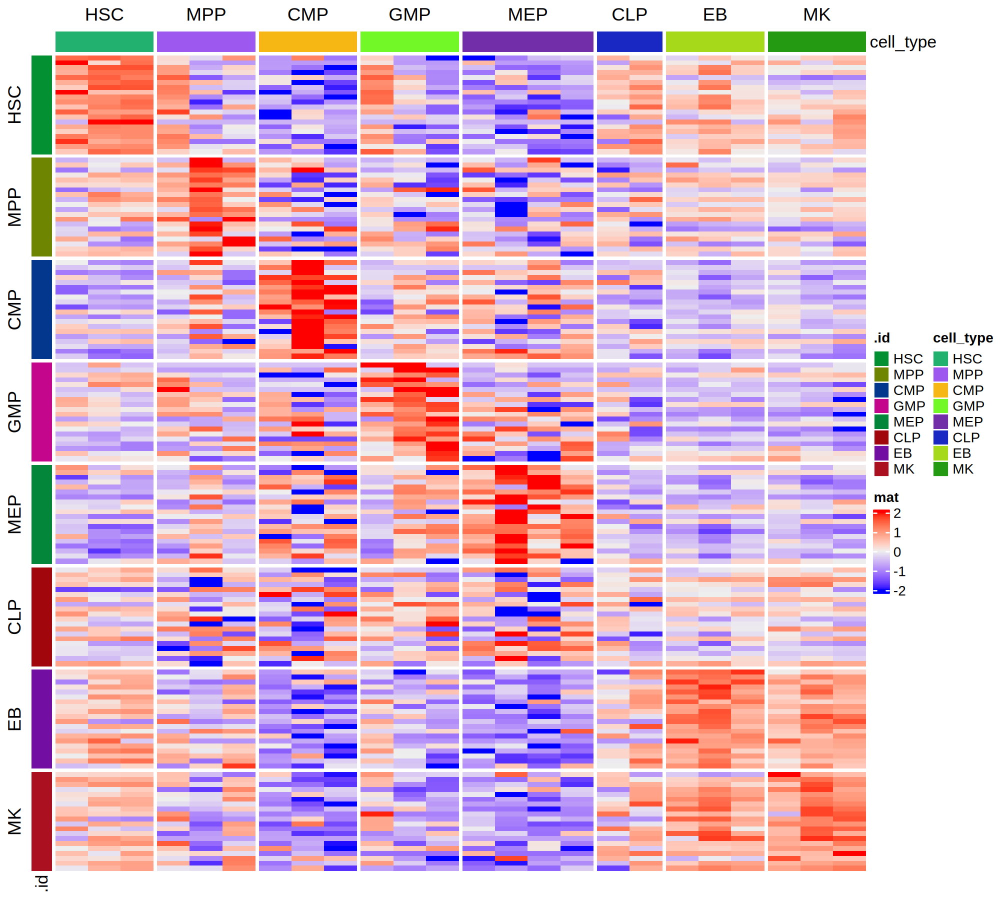

In [228]:
# significant TEs

row_sel = deg_te_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df24)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df24[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df24$cell_type, levels = cell_types))  


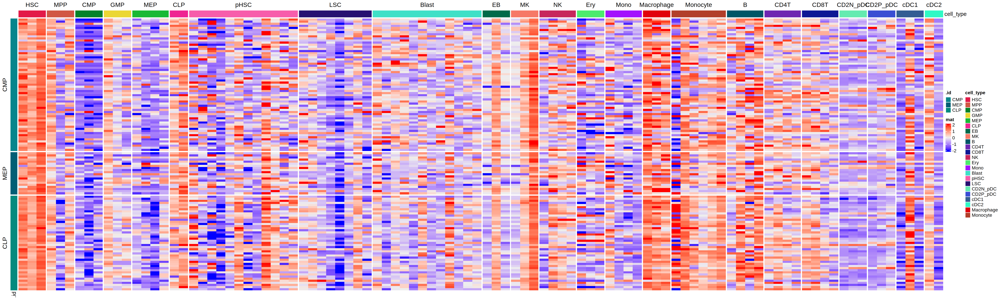

In [233]:
# significant TEs
row_sel = deg_te_dt[abs(logFC) > 1 & FDR < 0.1, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_3batch))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_3batch[row_sel$rn, dsn$sample_name]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 

options(repr.plot.width = 30, repr.plot.height = 9, repr.plot.res = 200)

Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn$cell_type, levels = cell_types_3batch))  

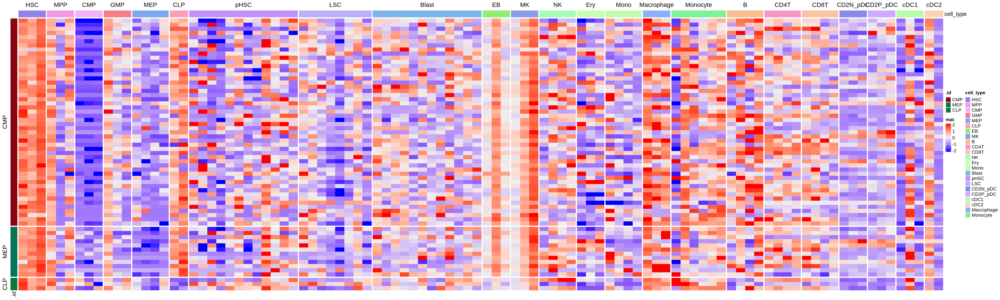

In [225]:
# significant TEs
row_sel = deg_te_dt[logFC < -1 & FDR < 0.1, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_3batch))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_3batch[row_sel$rn, dsn$sample_name]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 

options(repr.plot.width = 30, repr.plot.height = 9, repr.plot.res = 200)

Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn$cell_type, levels = cell_types_3batch))  

In [ ]:
# significant TEs
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_te_dt[abs(logFC) > 1 & FDR < 0.1, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_3batch))
row_sel = row_sel[rn %in% ov, ]
rownames(plotdat) = row_sel$ctype_gene

plotdat = logcpm_3batch[row_sel$rn, dsn$sample_name] 

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn[, 'cell_type', drop = F])

In [ ]:
# significant TEs
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_te_dt[abs(logFC) > 1 & FDR < 0.1, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_3batch))
row_sel = row_sel[rn %in% ov, ]
rownames(plotdat) = row_sel$ctype_gene

plotdat = logcpm_3batch[row_sel$rn, dsn$sample_name] 

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn$cell_type, levels = cell_types_3batch))  

# heatmap based on blueprint results

In [160]:
row_sel = deg_te_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_3batch))
row_sel = row_sel[rn %in% ov, ]
head(row_sel)
dim(row_sel)


.id,rn,logFC,logCPM,PValue,FDR,sel,idd,class_id,family_id,gene_id,ctype_gene
<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<int>,<chr>,<chr>,<chr>,<chr>
HSC,ERVL-B4-int:ERVL:LTR,0.6461831,8.9661377,0.00995068,0.5944787,NA,6,LTR,ERVL,ERVL-B4-int,HSC_ERVL-B4-int:ERVL:LTR
HSC,ACRO1:acro:Satellite,2.7482259,-0.9587067,0.01463087,0.5944787,NA,21,Satellite,acro,ACRO1,HSC_ACRO1:acro:Satellite
HSC,L1PA13:L1:LINE,0.5100995,11.3827194,0.01521246,0.5944787,NA,22,LINE,L1,L1PA13,HSC_L1PA13:L1:LINE
HSC,L1PA16:L1:LINE,0.5246390,11.9908499,0.02056969,0.5944787,NA,32,LINE,L1,L1PA16,HSC_L1PA16:L1:LINE
HSC,THE1D:ERVL-MaLR:LTR,0.3698013,10.9466090,0.02080387,0.5944787,NA,33,LTR,ERVL-MaLR,THE1D,HSC_THE1D:ERVL-MaLR:LTR
HSC,L1PA15:L1:LINE,0.3740317,11.6198445,0.02907687,0.5944787,NA,45,LINE,L1,L1PA15,HSC_L1PA15:L1:LINE


[1] 159  12

In [167]:
table(dsn$cell_type)


       HSC        MPP        CMP        GMP        MEP        CLP         EB         MK          B       CD4T       CD8T         NK        Ery       Mono      Blast       pHSC        LSC   CD2N_pDC 
         3          3          3          3          4          2          3          3          4          4          4          4          3          4         12         12          8          3 
  CD2P_pDC       cDC1       cDC2 Macrophage   Monocyte 
         3          3          2          3          6 

[1] "HSC"        "MPP"        "CMP"        "GMP"        "MEP"        "CLP"        "pHSC"       "LSC"        "Blast"      "EB"         "MK"         "NK"         "Ery"        "Mono"       "Macrophage"
[16] "Monocyte"   "B"          "CD4T"       "CD8T"       "CD2N_pDC"   "CD2P_pDC"   "cDC1"       "cDC2"

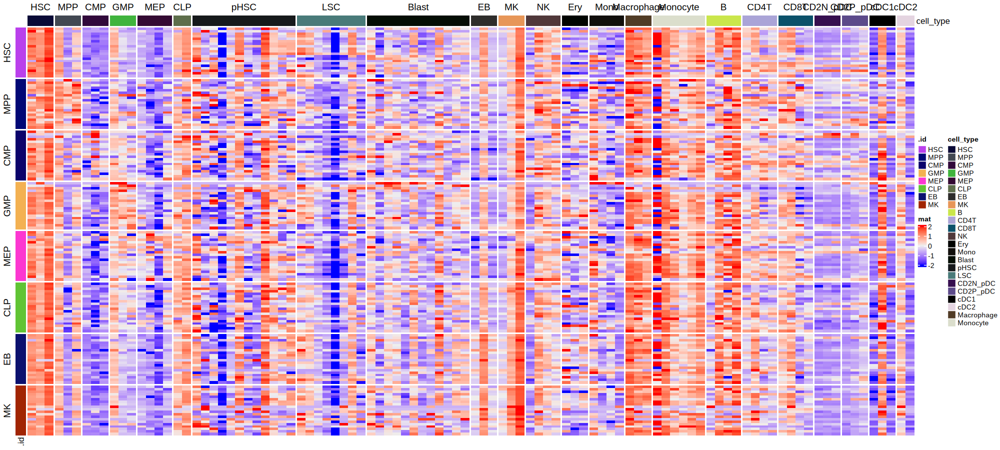

In [170]:
# top 20 up-regulated coding genes for each cell type
options(repr.plot.width = 20, repr.plot.height = 9, repr.plot.res = 100)

plotdat = logcpm_3batch[row_sel$rn, dsn$sample_name]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn$cell_type, levels = cell_types_3batch))  


# export 

In [50]:
ls()

[1] "base_dir"               "cell_types"             "cell_types_3batch"     
 [4] "coding_genes"           "count_mtx"              "count_mtx_batch"       
 [7] "data_dir"               "deg_coding_dt"          "deg_te_dt"             
[10] "deg_telocal_dt"         "design"                 "dge_all"               
[13] "dge_coding"             "dge_te"                 "dge_temp"              
[16] "dsn"                    "dsn_all"                "dsn_all_df"            
[19] "dsn_all_df24"           "dsn_batch2"             "dsn_bp"                
[22] "dsn_df"                 "dsn_list"               "dsn_monmac"            
[25] "dsn_telocal"            "dsn6"                   "fit_all"               
[28] "fit_coding"             "fit_te"                 "graph_dt"              
[31] "keep"                   "logcpm_3batch"          "logcpm_3batch_t"       
[34] "logcpm_all"             "logcpm_all_t"           "logcpm_coding"         
[37] "logcpm_coding_t"        "logcpm_te"              "logcpm_te_t"           
[40] "logcpm_telocal"         "monmac_mtx"             "mtx_all_df"            
[43] "mtx_bp"                 "mtx_coding_df"          "mtx_te_df"             
[46] "ov"                     "pathway_fun"            "plotdat"               
[49] "plotdat0"               "plotdat1"               "plotdat2"              
[52] "sample_names"           "sample_names_n24"       "scale_fun"             
[55] "subtype"                "te_dt"                  "te_genes"              
[58] "tecount_mtx_batch2"     "telocal_sel"            "telocal_sel_list_1"    
[61] "telocal_sel_list_2"     "telocal_sel_seqino_ann" "tmp1"                  
[64] "tmp2"                   "tmp3"                   "tmp4"                  
[67] "txdb"

In [55]:
dim(dsn_df)

[1] 99  3

In [57]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/TE"

In [58]:
# '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/TE'

write.table(count_mtx_batch, file = 'count_mtx_3batch_batchcorrect.tsv', sep = '\t')
write.table(logcpm_3batch, file = 'logcpm_3batch_t_batchcorrect_normalized.tsv', sep = '\t')
fwrite(logcpm_3batch_t, file = 'logcpm_3batch_t_batchcorrect_normalized_t.tsv', sep = '\t')
write.table(dsn_df, file = 'dsn_3batch_df.tsv', sep = '\t')


In [ ]:
# 3 batch 
batch3s_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/TE/'

count_mtx_batch = read.table(file = paste0(batch3s_dir, 'count_mtx_3batch_batchcorrect.tsv'), sep = '\t')
logcpm_3batch = read.table(file = paste0(batch3s_dir, 'logcpm_3batch_t_batchcorrect_normalized.tsv'), sep = '\t')
logcpm_3batch_t = fread(file = paste0(batch3s_dir, 'logcpm_3batch_t_batchcorrect_normalized_t.tsv'), sep = '\t')
dsn_df = read.table(file = paste0(batch3s_dir, 'dsn_3batch_df.tsv'), sep = '\t')


In [62]:
cell_types_3batch = c('HSC', 'MPP', 'CMP', 'GMP', 'MEP', 'CLP', 'EB', 'MK', 'B', 'CD4T', 'CD8T', 'NK', 'Ery', 'Mono', 'Blast', 'pHSC', 'LSC', 
                      'CD2N_pDC', 'CD2P_pDC', 'cDC1', 'cDC2', 'Macrophage', 'Monocyte')


In [52]:
table(deg_telocal_dt$.id)


  CLP   CMP    EB   GMP   HSC   MEP    MK   MPP 
42707 42554 42554 42554 42554 42246 42554 42554 

# backup code

# TE gene DEG 

In [60]:
cell_types_3batch = unique(dsn_df$cell_type)
cell_types_3batch

[1] HSC        MPP        CMP        GMP        MEP        CLP       
 [7] EB         MK         B          CD4T       CD8T       NK        
[13] Ery        Mono       Blast      pHSC       LSC        CD2N_pDC  
[19] CD2P_pDC   cDC1       cDC2       Macrophage Monocyte  
23 Levels: HSC MPP CMP GMP MEP CLP EB MK B CD4T CD8T NK Ery Mono Blast ... Monocyte

In [245]:
deg_te_lineage_list = lapply(cell_types, function(cc){
    dsn_df$ctype = 'Other'
    dsn_df$ctype[dsn_df$cell_type == cc] = cc
    dsn_df$ctype = factor(dsn_df$ctype, levels = c('Other', cc))

    subtype = factor(dsn_df$ctype, levels = c('Other', cc))

    mtx_ranged = count_mtx_batch[!rownames(count_mtx_batch) %in% coding_genes, rownames(dsn_df)]

    dge = DGEList(counts=mtx_ranged, group = subtype)
    dge <- calcNormFactors(dge)

    keep = filterByExpr(dge)
    dge = dge[keep, , keep.lib.sizes=FALSE]
    dge = normLibSizes(dge)
    design = model.matrix( ~ 0 + subtype)
    dge = estimateDisp(dge, design)
    et <- exactTest(dge)
    deg = topTags(et, n = length(keep))
    deg = as.data.table(deg$table, keep.rownames = T)
    deg
})


In [246]:
names(deg_te_lineage_list) = cell_types


In [247]:
deg_te_lineage_dt = rbindlist(deg_te_lineage_list, idcol = T)
head(deg_te_lineage_dt)


.id,rn,logFC,logCPM,PValue,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
HSC,FLAM_C:Alu:SINE,-0.5073787,12.644420,0.002725872,1
HSC,FLAM_A:Alu:SINE,-0.3908493,10.472924,0.009221199,1
HSC,MER83B:ERV1:LTR,-1.1674445,5.977216,0.011026226,1
HSC,MIR:MIR:SINE,-0.2555979,15.000411,0.011803957,1
HSC,MIRc:MIR:SINE,-0.2637451,13.952726,0.012265595,1
HSC,MIR1_Amn:MIR:SINE,-0.4216934,11.059569,0.013634986,1


In [77]:
tecount_sel1 = deg_te_dt %>% group_by(.id) %>% slice_min(PValue, n = 20)
tecount_sel2 = deg_te_dt[FDR < 0.05 & (logFC) > 1, ]
tecount_sel = rbind(tecount_sel1, tecount_sel2)


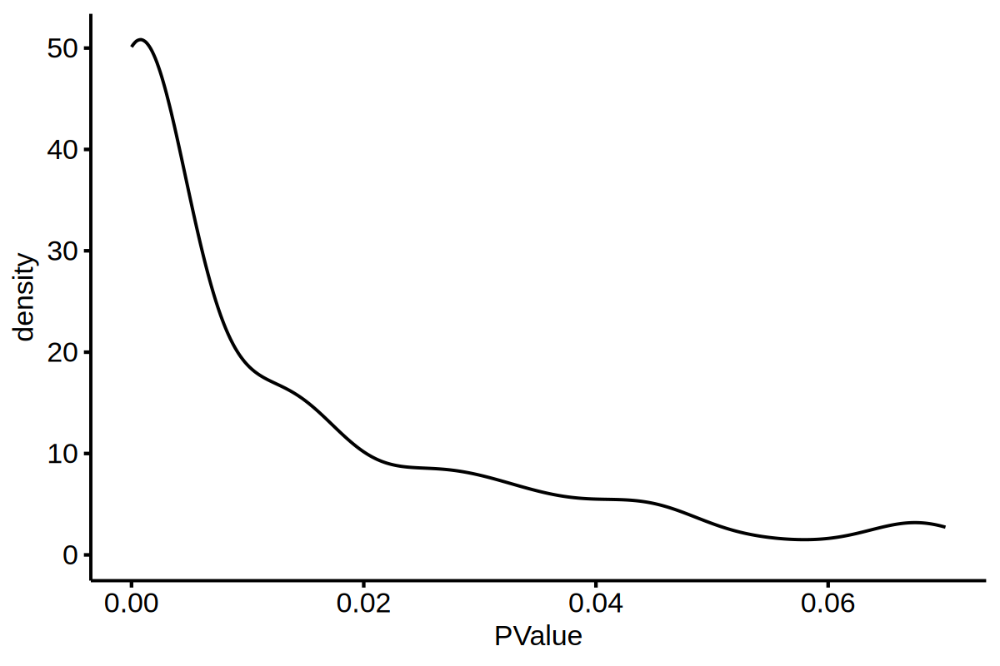

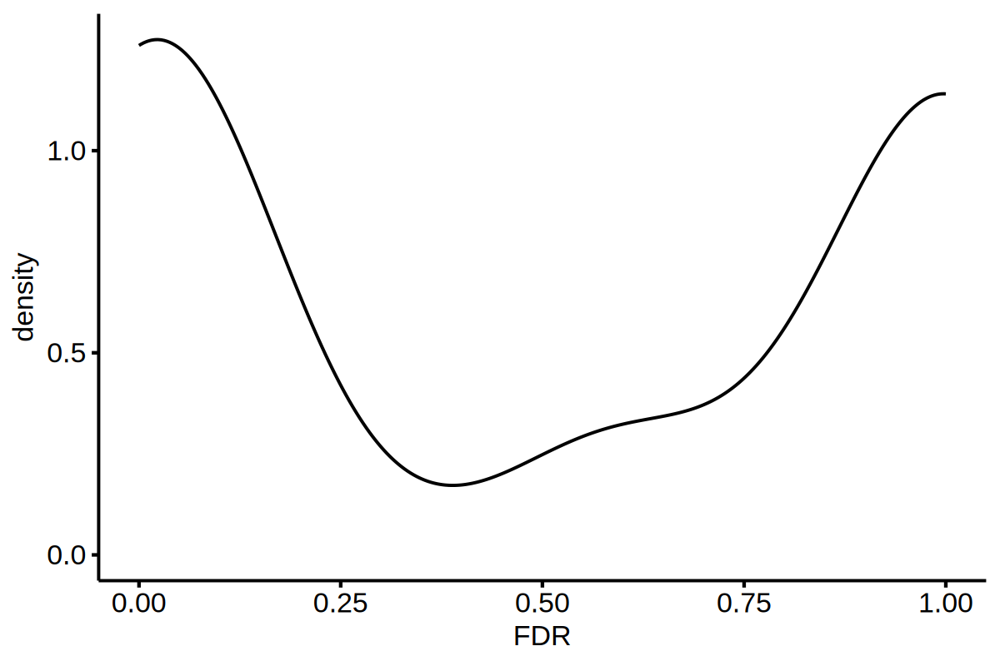

In [91]:
ggdensity(tecount_sel, x = 'PValue') 
ggdensity(tecount_sel, x = 'FDR') 


In [74]:
head(deg_te_dt) 

.id,rn,logFC,logCPM,PValue,FDR,sel,idd,class_id,family_id,gene_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<int>,<chr>,<chr>,<chr>
HSC,FLAM_C:Alu:SINE,-0.9128241,12.467095,0.003354908,0.5944787,NA,1,SINE,Alu,FLAM_C
HSC,UCON44:TcMar-Tigger:DNA,-1.6884823,7.812925,0.004110851,0.5944787,NA,2,DNA,TcMar-Tigger,UCON44
HSC,L1ME3G:L1:LINE,-0.5030516,12.483404,0.005752892,0.5944787,NA,3,LINE,L1,L1ME3G
HSC,L1ME4a:L1:LINE,-0.5586001,12.695243,0.007049395,0.5944787,NA,4,LINE,L1,L1ME4a
HSC,MER33:hAT-Charlie:DNA,-0.7200624,10.986634,0.008228203,0.5944787,NA,5,DNA,hAT-Charlie,MER33
HSC,ERVL-B4-int:ERVL:LTR,0.6461831,8.966138,0.009950680,0.5944787,NA,6,LTR,ERVL,ERVL-B4-int


# heatmap TEcount

## one over all other

In [255]:
head(dsn_df)
dsn_df_sel = dsn_df[dsn_df$cell_type != 'Mono',]


,batch,sample_name,cell_type
,<chr>,<chr>,<fct>
HSC1,bp,HSC1,HSC
HSC2,bp,HSC2,HSC
HSC3,bp,HSC3,HSC
MPP1,bp,MPP1,MPP
MPP2,bp,MPP2,MPP
MPP3,bp,MPP3,MPP


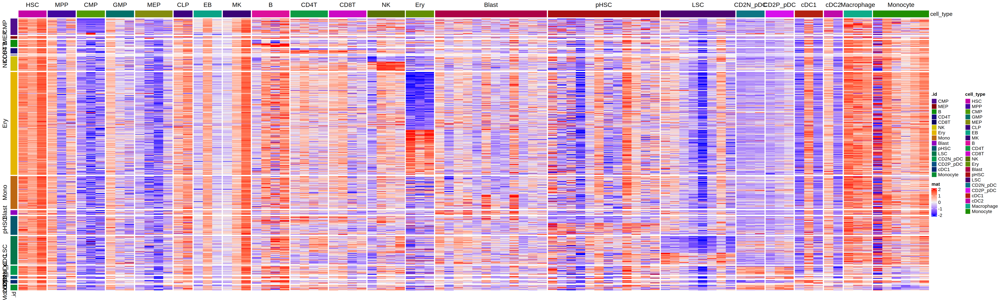

In [258]:
# significant TEs
options(repr.plot.width = 30, repr.plot.height = 9, repr.plot.res = 200)

row_sel = deg_te_lineage_dt[abs(logFC) > 1 & FDR < 0.1, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id, sign(logFC)), ]
ov = intersect(row_sel$rn, rownames(logcpm_3batch))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_3batch[row_sel$rn, rownames(dsn_df_sel)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_df_sel[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_df_sel$cell_type, levels = cell_types))  

In [1]:
ls()

[1] "graph_dt" "plotdat"  "plotdat0" "plotdat1" "plotdat2" "te_dt"   
 [7] "tmp1"     "tmp2"     "tmp3"     "tmp4"

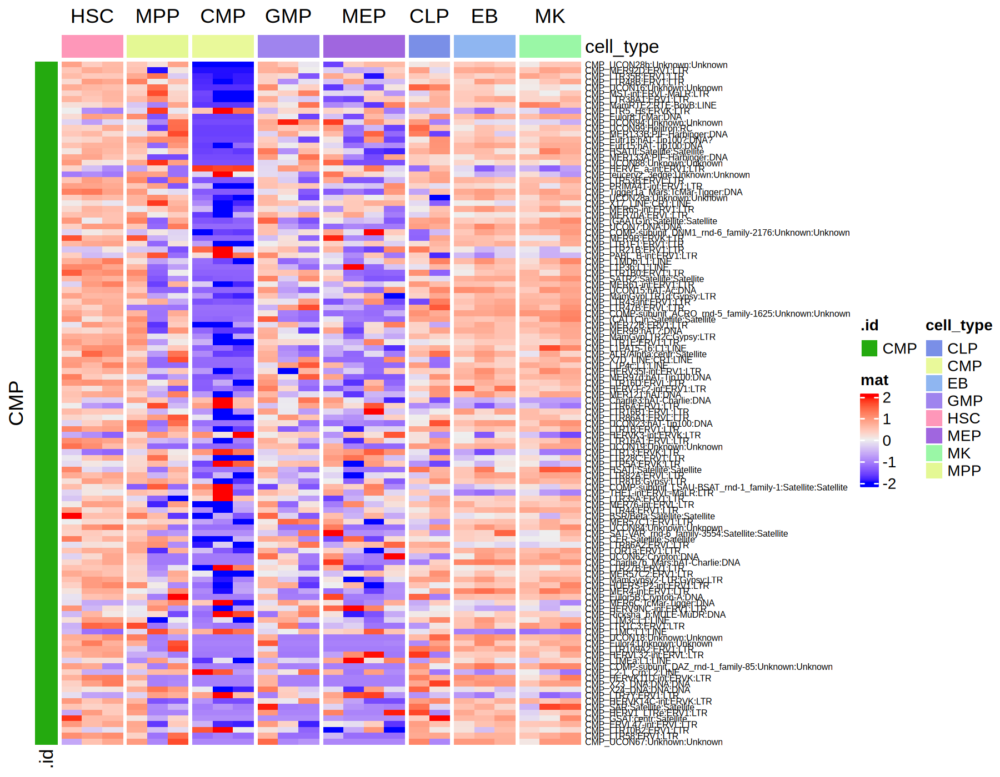

In [78]:
# significant TEs
options(repr.plot.width = 9, repr.plot.height = 7, repr.plot.res = 200)

row_sel = deg_te_dt[abs(logFC) > 1 & FDR < 0.1, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ][.id == 'CMP', ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id,   row_names_gp = grid::gpar(fontsize = 5.5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

In [80]:
nrow( deg_te_dt[.id == 'MK' & logFC > 0 & FDR < 0.1, ] )

[1] 0

In [81]:
mk = deg_te_dt[logFC > 0 & .id == 'MK', ] %>% slice_min(order_by = PValue, n = 20)


In [82]:
head(deg_te_dt)

.id,rn,logFC,logCPM,PValue,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
CMP,UCON28b:Unknown:Unknown,-8.814440,3.694313,5.838190e-14,7.140106e-11
CMP,MER92D:ERV1:LTR,-11.851777,4.025914,1.570117e-09,9.601264e-07
CMP,LTR35B:ERV1:LTR,-8.011572,4.518548,2.525518e-08,1.029569e-05
CMP,LTR48B:ERV1:LTR,-1.501265,7.159887,1.682623e-07,5.144618e-05
CMP,UCON16:Unknown:Unknown,-10.548174,2.734939,2.903848e-07,7.102812e-05
CMP,MST-int:ERVL-MaLR:LTR,-3.356113,4.905069,4.055150e-07,8.265747e-05


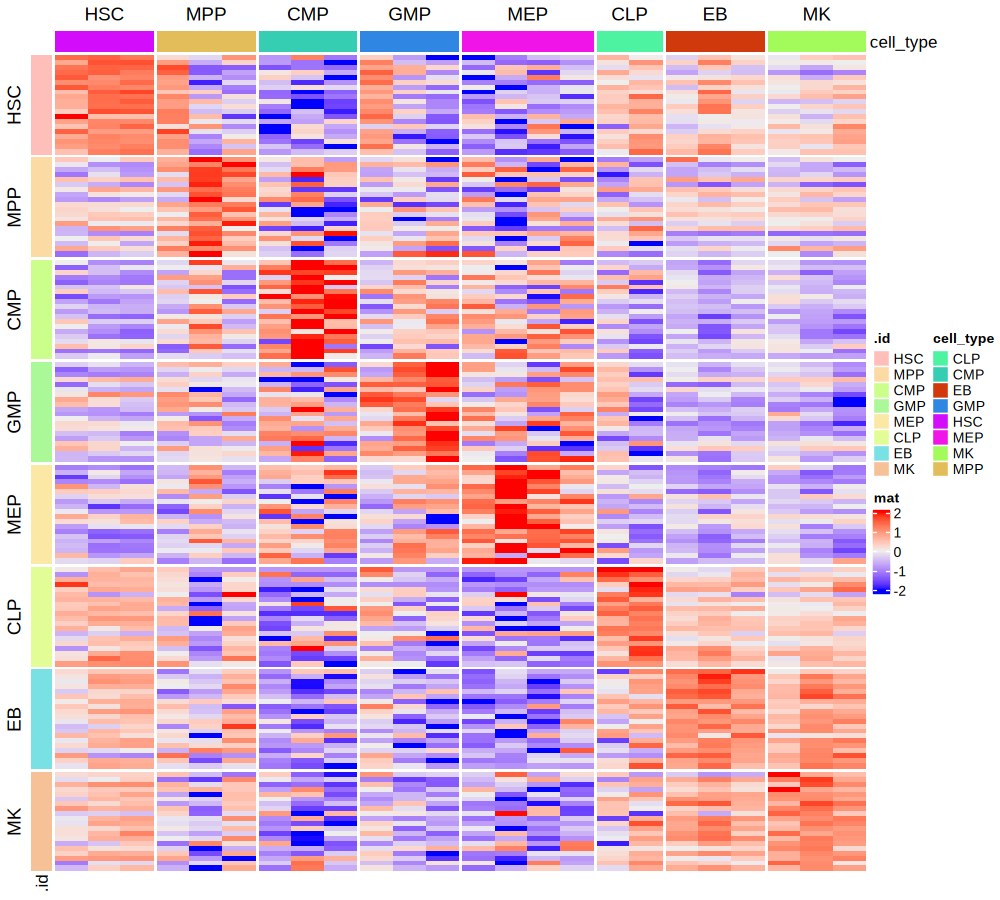

In [83]:
# top 20 up-regulated te genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_te_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

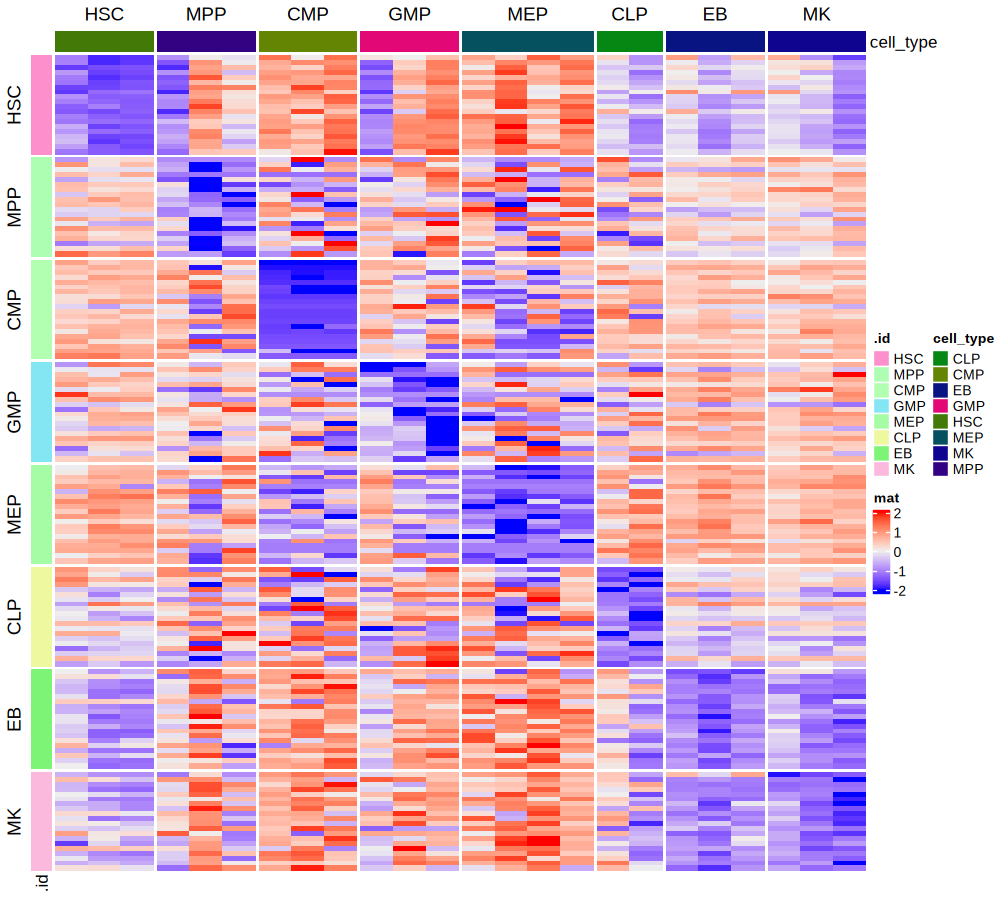

In [84]:
# top 20 up-regulated te genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_te_dt[logFC < 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


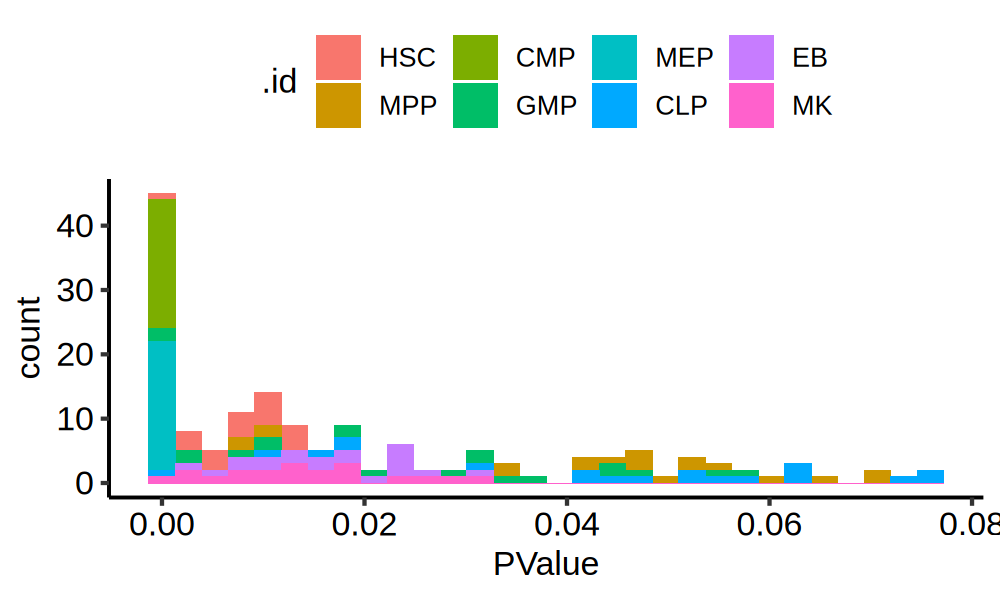

In [86]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = PValue, fill = .id)) + geom_histogram() + theme_pubr()


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


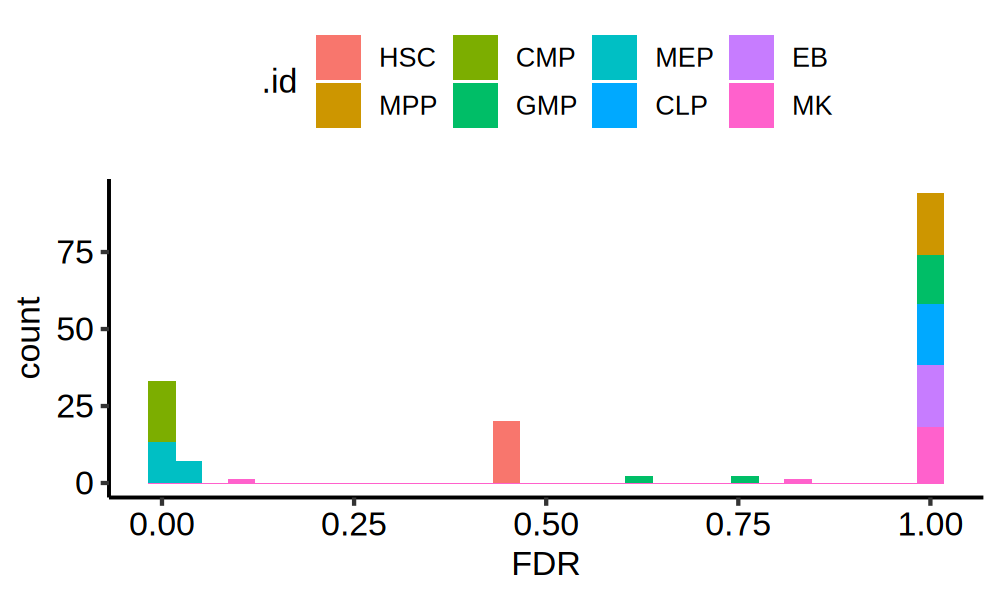

In [85]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = FDR, fill = .id)) + geom_histogram() + theme_pubr()


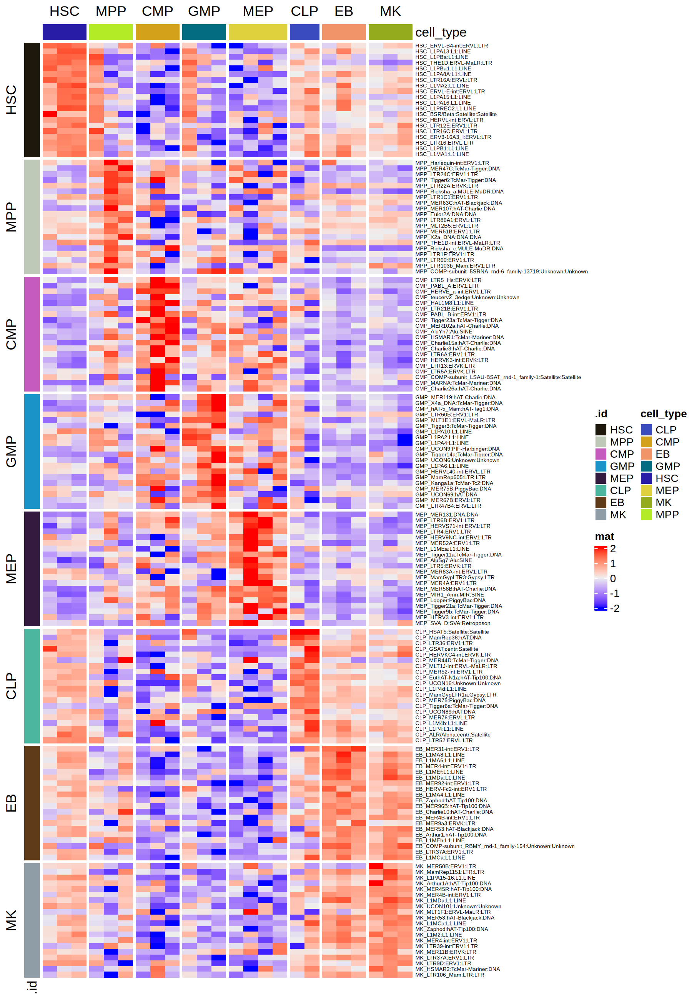

In [87]:
# top 20 up-regulated te genes for each cell type
options(repr.plot.width = 9, repr.plot.height = 13, repr.plot.res = 200)

row_sel = deg_te_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, row_names_gp = grid::gpar(fontsize = 5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


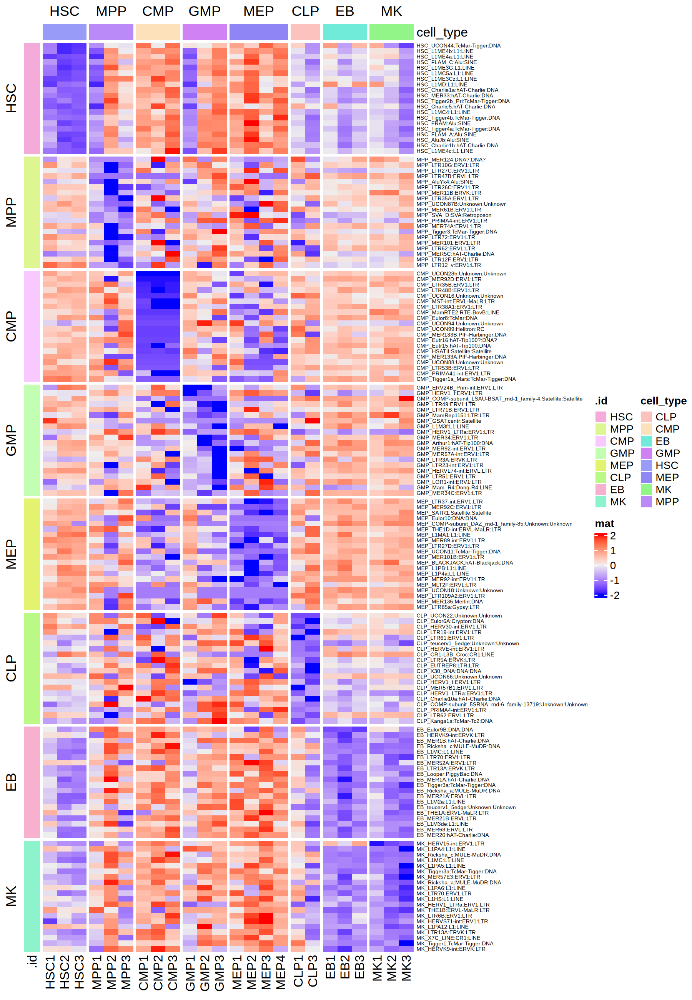

In [88]:
# top 20 down-regulated te genes for each cell type
options(repr.plot.width = 9, repr.plot.height = 13, repr.plot.res = 200)

row_sel = deg_te_dt[logFC < 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, row_names_gp = grid::gpar(fontsize = 5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


## MEP related

[1] 24 12


 DNA LINE  LTR 
   5    2   17 

Warning message:
"The input is a data frame-like object, convert it to a matrix."


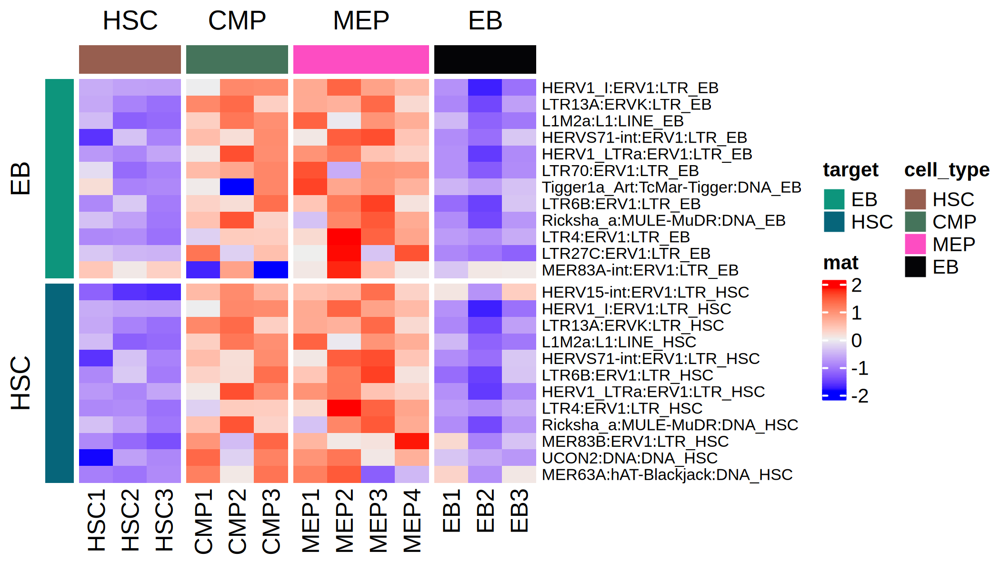

In [164]:
cell_type_mep = c('HSC', 'CMP', 'MEP', 'EB')

te_sel = deg_MEPCMP[batch == 'MEP' & logFC > 2 & FDR < .1, ]
te_sel[, ctype_gene := paste0(rn, '_', target)]

dim( te_sel )
table(te_sel$class_id)

dsn_col = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_MEP)), row.names = colnames(logcpm_MEP))
dsn_col$cell_type = factor(dsn_col$cell_type, levels = cell_type_mep)

dsn_row = te_sel

plotdat = logcpm_MEP[dsn_row$rn, rownames(dsn_col)]
rownames(plotdat) = dsn_row$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_col[, 'cell_type', drop = F], show_annotation_name = F)
column_ra = rowAnnotation(df = dsn_row[, 'target', drop = F], show_annotation_name = F)

options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_col$cell_type, levels = cell_type_mep))  

[1] 80 12


 DNA LINE  LTR 
  30    3   47 

Warning message:
"The input is a data frame-like object, convert it to a matrix."


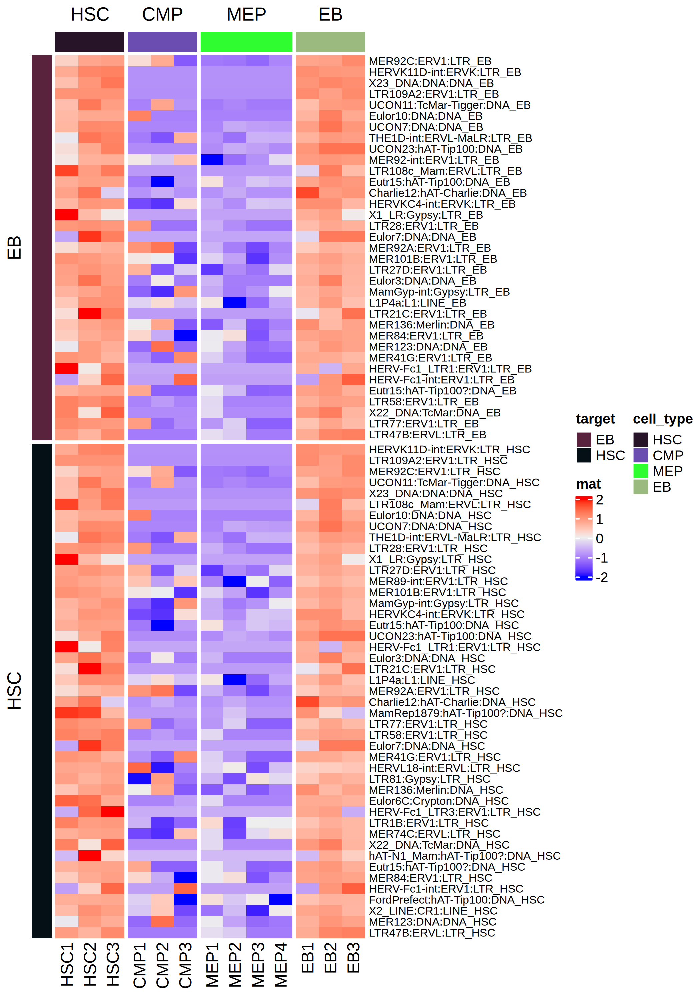

In [165]:
te_sel = deg_MEPCMP[batch == 'MEP' & logFC < -2 & FDR < .1, ]
te_sel[, ctype_gene := paste0(rn, '_', target)]

dim( te_sel )
table(te_sel$class_id)

dsn_col = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_MEP)), row.names = colnames(logcpm_MEP))
dsn_col$cell_type = factor(dsn_col$cell_type, levels = cell_type_mep)

dsn_row = te_sel

plotdat = logcpm_MEP[dsn_row$rn, rownames(dsn_col)]
rownames(plotdat) = dsn_row$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_col[, 'cell_type', drop = F], show_annotation_name = F)
column_ra = rowAnnotation(df = dsn_row[, 'target', drop = F], show_annotation_name = F)

options(repr.plot.width = 7, repr.plot.height = 10, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_col$cell_type, levels = cell_type_mep))  

## CMP related

In [30]:
logcpm_CMP = read.table('data/logcpm_CMP_15Jul.tsv')
head(logcpm_CMP)

,HSC1,HSC2,HSC3,CMP1,CMP2,CMP3,GMP1,GMP2,GMP3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AmnHarb1:PIF-Harbinger:DNA,4.461267,4.809353,4.687502,3.698955,5.690376,4.762428,4.303145,2.793322,4.595809
AmnL2-1:L2:LINE,7.602847,7.663187,7.521926,8.372362,8.184238,7.396911,7.661951,8.022168,8.329443
Arthur1:hAT-Tip100:DNA,9.100948,9.364753,9.428278,8.621817,8.568604,8.692097,8.996145,7.688828,8.381650
Arthur1A:hAT-Tip100:DNA,7.512114,7.600024,7.598551,7.143182,7.896205,6.865835,7.407996,6.926501,7.279535
Arthur1B:hAT-Tip100:DNA,8.790451,8.824105,8.916314,9.689574,9.371485,9.049796,8.941977,8.994989,7.967933
Arthur1C:hAT-Tip100:DNA,6.075185,6.869599,6.732830,5.858468,5.653265,6.792871,6.379708,5.391442,4.990440


In [49]:
tmp1 = deg_MEPCMP[batch == 'CMP' & logFC < -1 & FDR < .1 & target == 'HSC', ]
tmp2 = deg_MEPCMP[batch == 'CMP' & logFC < -1 & FDR < .1 & target == 'GMP', ]
setdiff(tmp2$rn, tmp1$rn)
intersect(tmp1$rn, tmp2$rn)


character(0)

[1] "MER92D:ERV1:LTR"           "LTR1B0:ERV1:LTR"          
[3] "LTR43-int:ERV1:LTR"        "L1P4c:L1:LINE"            
[5] "MER133A:PIF-Harbinger:DNA" "LTR47B:ERVL:LTR"          
[7] "MamRTE2:RTE-BovB:LINE"

[1] 100  12


 DNA LINE  LTR 
  22   15   63 

Warning message:
"The input is a data frame-like object, convert it to a matrix."


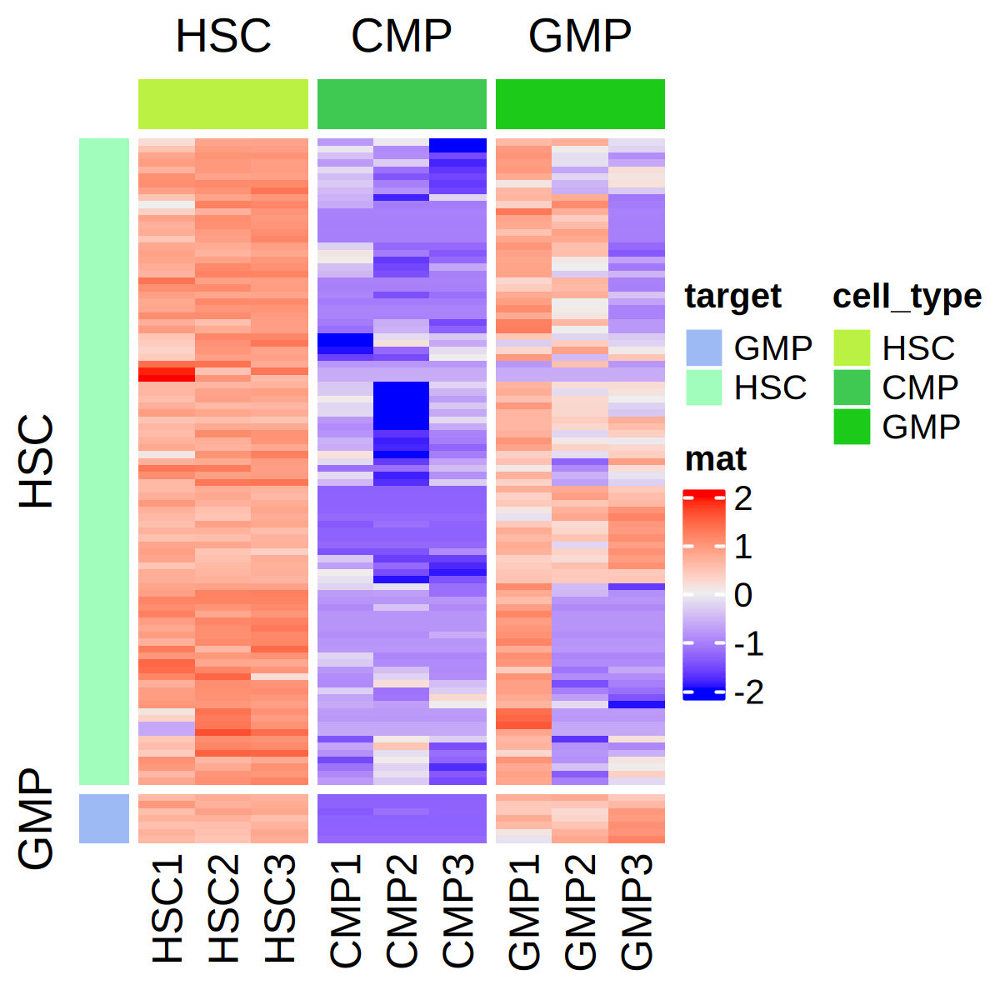

In [36]:
cell_type_cmp = c('HSC', 'CMP', 'GMP')

te_sel = deg_MEPCMP[batch == 'CMP' & logFC < -1 & FDR < .1, ]
te_sel[, ctype_gene := paste0(rn, '_', target)]

dim( te_sel )
table(te_sel$class_id)

dsn_col = dsn_all_df[dsn_all_df$cell_type %in% cell_type_cmp, , drop = F]
#dsn_col = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_all)), row.names = colnames(logcpm_CMP))
dsn_col$cell_type = factor(dsn_col$cell_type, levels = cell_type_cmp)

dsn_row = te_sel

plotdat = logcpm_CMP[dsn_row$rn, rownames(dsn_col)]
rownames(plotdat) = dsn_row$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_col[, 'cell_type', drop = F], show_annotation_name = F)
column_ra = rowAnnotation(df = dsn_row[, 'target', drop = F], show_annotation_name = F)

options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_col$cell_type, levels = cell_type_cmp))  


[1] 77 12


 DNA LINE  LTR 
  42    4   31 

Warning message:
"The input is a data frame-like object, convert it to a matrix."


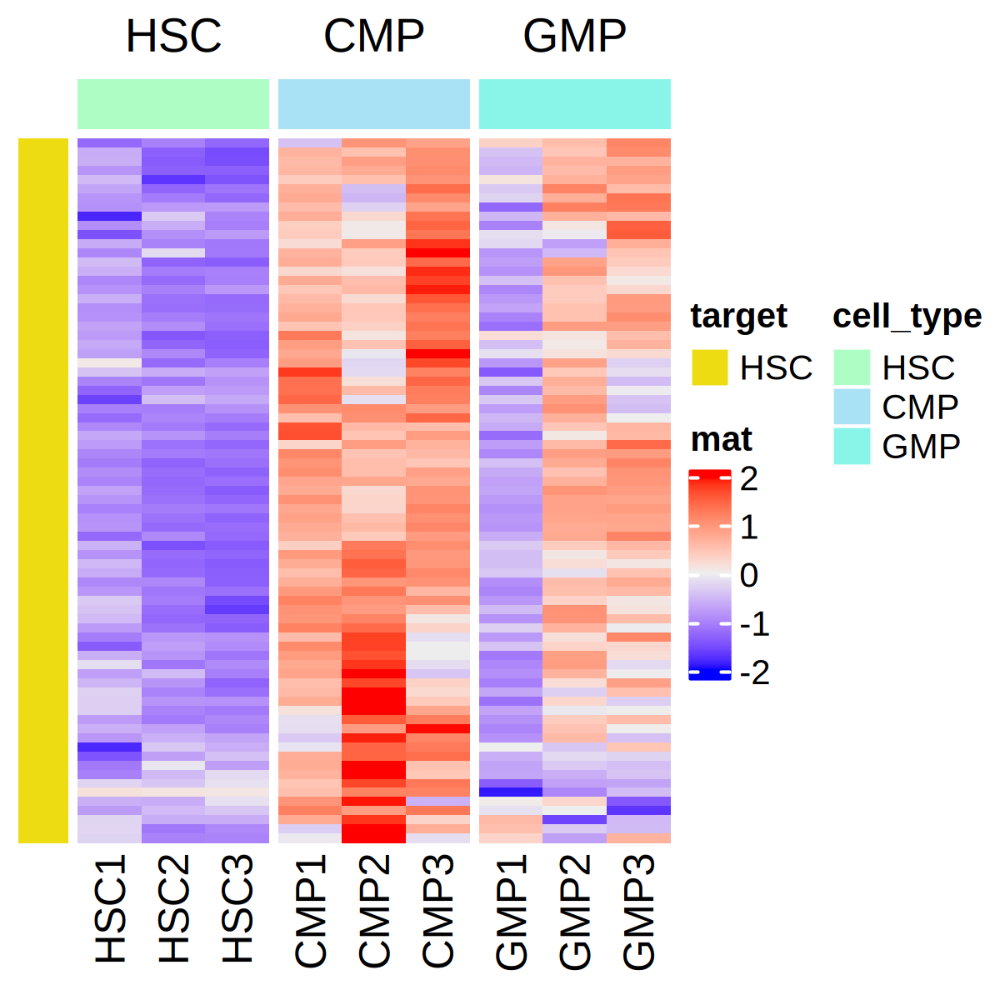

In [44]:
cell_type_cmp = c('HSC', 'CMP', 'GMP')

te_sel = deg_MEPCMP[batch == 'CMP' & logFC > 1 & FDR < .1 & target == 'HSC', ]
te_sel[, ctype_gene := paste0(rn, '_', target)]

dim( te_sel )
table(te_sel$class_id)

dsn_col = dsn_all_df[dsn_all_df$cell_type %in% cell_type_cmp, , drop = F]
#dsn_col = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_all)), row.names = colnames(logcpm_CMP))
dsn_col$cell_type = factor(dsn_col$cell_type, levels = cell_type_cmp)

dsn_row = te_sel

plotdat = logcpm_CMP[dsn_row$rn, rownames(dsn_col)]
rownames(plotdat) = dsn_row$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_col[, 'cell_type', drop = F], show_annotation_name = F)
column_ra = rowAnnotation(df = dsn_row[, 'target', drop = F], show_annotation_name = F)

options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_col$cell_type, levels = cell_type_cmp))  

In [40]:
te_sel_dn = deg_MEPCMP[batch == 'CMP' & logFC < -1 & FDR < .1, ]
te_sel_dn[, ctype_gene := paste0(rn, '_', target)]
te_sel_up = deg_MEPCMP[batch == 'CMP' & logFC > 1 & FDR < .1 & target == 'HSC', ]
te_sel_up[, ctype_gene := paste0(rn, '_', target)]
te_sel_up$rn

[1] "HERV15-int:ERV1:LTR"           "Charlie1a:hAT-Charlie:DNA"    
 [3] "MER57E3:ERV1:LTR"              "Tigger4a:TcMar-Tigger:DNA"    
 [5] "MER21B:ERVL:LTR"               "Charlie4z:hAT-Charlie:DNA"    
 [7] "L1MC:L1:LINE"                  "Tigger15a:TcMar-Tigger:DNA"   
 [9] "MER2:TcMar-Tigger:DNA"         "MER3:hAT-Charlie:DNA"         
[11] "MER33:hAT-Charlie:DNA"         "MER30:hAT-Charlie:DNA"        
[13] "LTR10C:ERV1:LTR"               "LTR13:ERVK:LTR"               
[15] "Tigger4b:TcMar-Tigger:DNA"     "HAL1M8:L1:LINE"               
[17] "L1M2a:L1:LINE"                 "LTR13A:ERVK:LTR"              
[19] "MER104:TcMar-Tc2:DNA"          "Tigger2b_Pri:TcMar-Tigger:DNA"
[21] "Tigger19b:TcMar-Tigger:DNA"    "HERV1_I:ERV1:LTR"             
[23] "Charlie15a:hAT-Charlie:DNA"    "Charlie4a:hAT-Charlie:DNA"    
[25] "Ricksha_c:MULE-MuDR:DNA"       "UCON44:TcMar-Tigger:DNA"      
[27] "MER105:hAT-Charlie:DNA"        "Charlie1b:hAT-Charlie:DNA"    
[29] "Tigger23a:TcMar-Tigger:DNA"    "MER49:ERV1:LTR"               
[31] "Looper:PiggyBac:DNA"           "MER20B:hAT-Charlie:DNA"       
[33] "LTR70:ERV1:LTR"                "MER2B:TcMar-Tigger:DNA"       
[35] "MER68:ERVL:LTR"                "MER63A:hAT-Blackjack:DNA"     
[37] "HERVS71-int:ERV1:LTR"          "HERVK3-int:ERVK:LTR"          
[39] "MER85:PiggyBac:DNA"            "LTR5_Hs:ERVK:LTR"             
[41] "HERV1_LTRa:ERV1:LTR"           "HERVE_a-int:ERV1:LTR"         
[43] "hAT-1_Mam:hAT-Tag1:DNA"        "Ricksha_a:MULE-MuDR:DNA"      
[45] "LTR6A:ERV1:LTR"                "LTR6B:ERV1:LTR"               
[47] "PABL_A:ERV1:LTR"               "Charlie16a:hAT-Charlie:DNA"   
[49] "MER5C1:hAT-Charlie:DNA"        "LTR7B:ERV1:LTR"               
[51] "LTR13_v:ERVK:LTR"              "HSMAR1:TcMar-Mariner:DNA"     
[53] "X9b_DNA:TcMar-Tigger:DNA"      "LTR7Y:ERV1:LTR"               
[55] "LTR5B:ERVK:LTR"                "MER83B:ERV1:LTR"              
[57] "PRIMA4-int:ERV1:LTR"           "X7C_LINE:CR1:LINE"            
[59] "Charlie22a:hAT-Charlie:DNA"    "PABL_B-int:ERV1:LTR"          
[61] "Charlie9:hAT-Charlie:DNA"      "X4b_DNA:TcMar-Tigger:DNA"     
[63] "Chap1_Mam:hAT-Charlie:DNA"     "LTR21B:ERV1:LTR"              
[65] "UCON2:DNA:DNA"                 "Tigger6:TcMar-Tigger:DNA"     
[67] "MER57F:ERV1:LTR"               "UCON58:DNA:DNA"               
[69] "LTR61:ERV1:LTR"                "LTR47B2:ERVL:LTR"             
[71] "Charlie3:hAT-Charlie:DNA"      "MER68B:ERVL:LTR"              
[73] "Kanga1b:TcMar-Tc2:DNA"         "UCON39:TcMar-Tigger:DNA"      
[75] "Charlie26a:hAT-Charlie:DNA"    "LTR2C:ERV1:LTR"               
[77] "Charlie10a:hAT-Charlie:DNA"

In [89]:
### MAplot

Warning message:
"ggrepel: 320 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 154 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 536 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


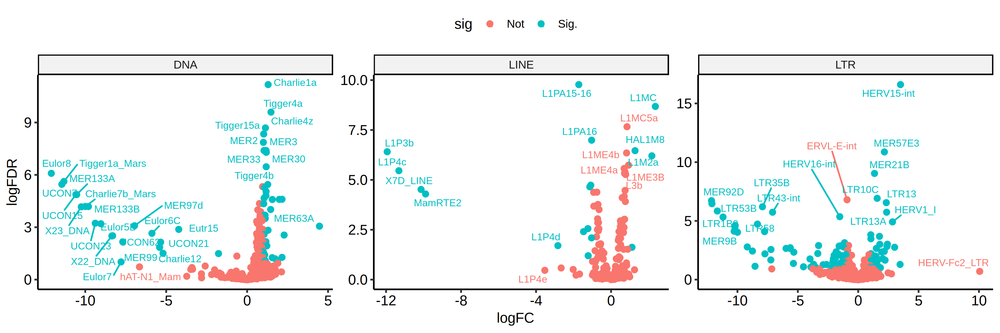

In [64]:
plotdat = deg_MEPCMP[batch == 'CMP' & target == 'HSC', ]
plotdat[, logFDR := - log(FDR, 10) ]
plotdat[, sig := 'Not']
plotdat[FDR < .1 & abs(logFC) > 1, sig := 'Sig.']
plotdat[, sig := factor(sig, levels = c('Not', 'Sig.'))]
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 300)
ggplot(plotdat, aes(x = logFC, y = logFDR, color = sig, label = gene_id)) + geom_point(size = 2) + 
geom_text_repel(size = 3) + theme_pubr() + facet_wrap(~ class_id, scale = 'free')


Warning message:
"ggrepel: 321 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 152 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 535 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


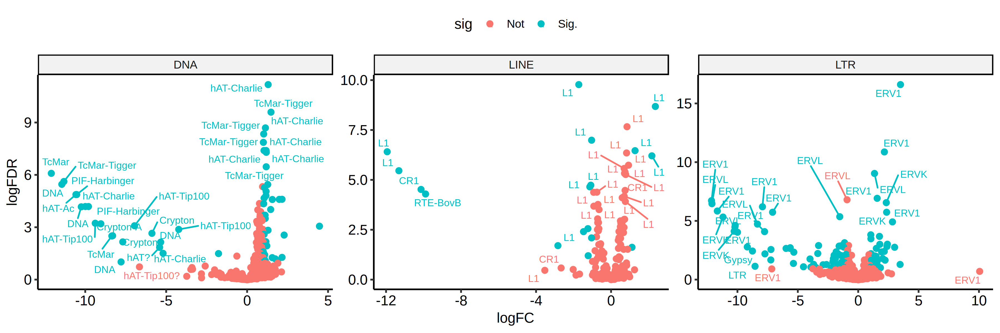

In [65]:
plotdat = deg_MEPCMP[batch == 'CMP' & target == 'HSC', ]
plotdat[, logFDR := - log(FDR, 10) ]
plotdat[, sig := 'Not']
plotdat[FDR < .1 & abs(logFC) > 1, sig := 'Sig.']
plotdat[, sig := factor(sig, levels = c('Not', 'Sig.'))]
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 300)
ggplot(plotdat, aes(x = logFC, y = logFDR, color = sig, label = family_id)) + geom_point(size = 2) + 
geom_text_repel(size = 3) + theme_pubr() + facet_wrap(~ class_id, scale = 'free')


In [43]:
te_cmp_updn = list(te_cmp_up = te_sel_up,  te_cmp_dn = te_sel_dn) 
saveRDS(te_cmp_updn, file = 'te_cmp_updn.rds')


[1] 20 12


 DNA LINE  LTR 
   4    2   14 

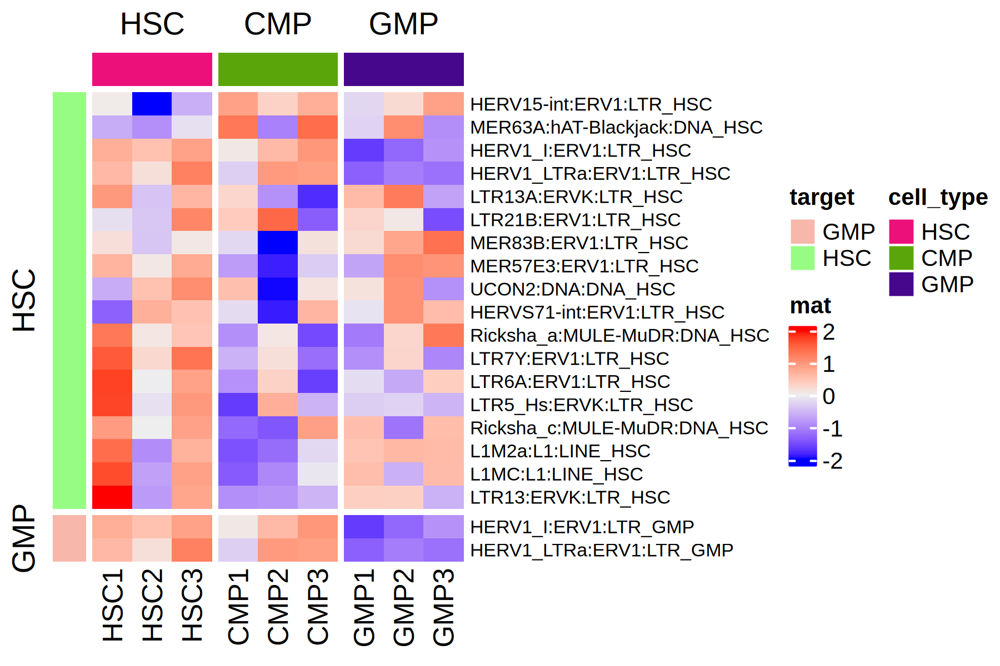

In [171]:
cell_type_cmp = c('HSC', 'CMP', 'GMP')

te_sel = deg_MEPCMP[batch == 'CMP' & logFC > 1 & FDR < .1, ]
te_sel[, ctype_gene := paste0(rn, '_', target)]

dim( te_sel )
table(te_sel$class_id)

dsn_col = dsn_all_df[dsn_all_df$cell_type %in% cell_type_cmp, , drop = F]
#dsn_col = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_all)), row.names = colnames(logcpm_CMP))
dsn_col$cell_type = factor(dsn_col$cell_type, levels = cell_type_cmp)

dsn_row = te_sel

plotdat = logcpm_all[dsn_row$rn, rownames(dsn_col)]
rownames(plotdat) = dsn_row$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_col[, 'cell_type', drop = F], show_annotation_name = F)
column_ra = rowAnnotation(df = dsn_row[, 'target', drop = F], show_annotation_name = F)

options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_col$cell_type, levels = cell_type_cmp))  

In [173]:
head(deg_MEPCMP)

.id,rn,logFC,logCPM,PValue,FDR,batch,target,class_id,family_id,gene_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
deg_MEP_EB,Ricksha_c:MULE-MuDR:DNA,1.794502,9.671313,3.537422e-15,3.855790e-12,MEP,EB,DNA,MULE-MuDR,Ricksha_c
deg_MEP_EB,MER4-int:ERV1:LTR,-1.552194,10.178204,8.196779e-12,4.467245e-09,MEP,EB,LTR,ERV1,MER4-int
deg_MEP_EB,HERV1_I:ERV1:LTR,4.016606,8.909953,1.601935e-11,5.820362e-09,MEP,EB,LTR,ERV1,HERV1_I
deg_MEP_EB,MER1B:hAT-Charlie:DNA,1.311878,11.324185,1.354780e-10,3.691776e-08,MEP,EB,DNA,hAT-Charlie,MER1B
deg_MEP_EB,MER92C:ERV1:LTR,-6.102215,4.219076,1.113748e-09,2.011836e-07,MEP,EB,LTR,ERV1,MER92C
deg_MEP_EB,MER31-int:ERV1:LTR,-1.827139,9.028825,1.243251e-09,2.011836e-07,MEP,EB,LTR,ERV1,MER31-int


[1] 67 12


 DNA LINE  LTR 
  21    7   39 

Warning message:
"The input is a data frame-like object, convert it to a matrix."


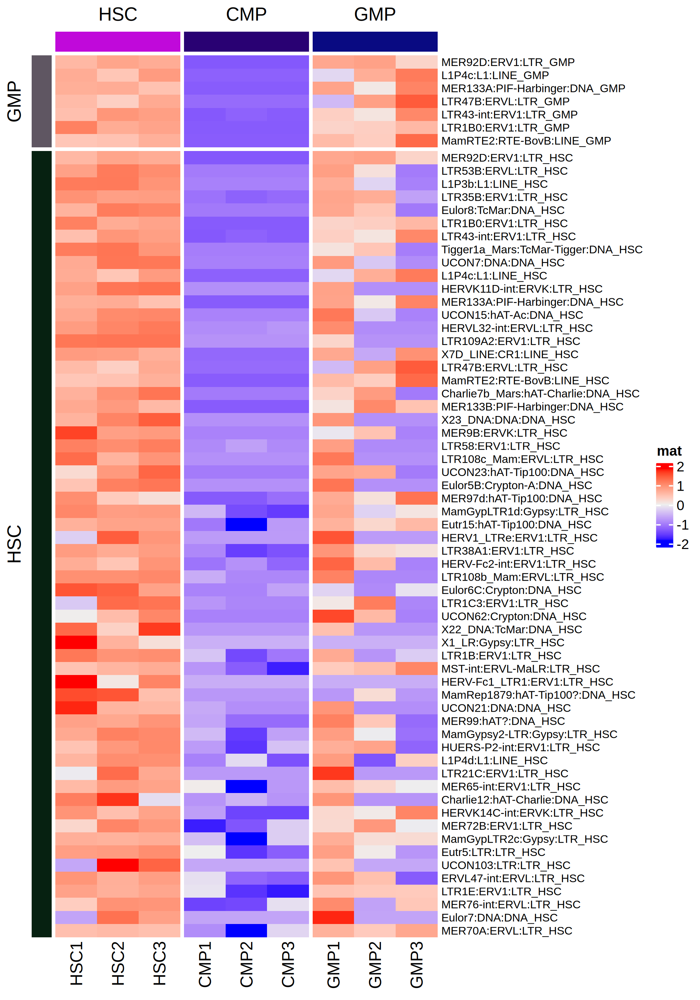

In [172]:
te_sel = deg_MEPCMP[batch == 'CMP' & logFC < -2 & FDR < .1, ]
te_sel[, ctype_gene := paste0(rn, '_', target)]

dim( te_sel )
table(te_sel$class_id)


dsn_col = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_CMP)), row.names = colnames(logcpm_CMP))
dsn_col$cell_type = factor(dsn_col$cell_type, levels = cell_type_cmp)

dsn_row = te_sel

plotdat = logcpm_CMP[dsn_row$rn, rownames(dsn_col)]
rownames(plotdat) = dsn_row$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_col[, 'cell_type', drop = F], show_annotation_name = F, show_legend = F)
column_ra = rowAnnotation(df = dsn_row[, 'target', drop = F], show_annotation_name = F, show_legend = F)

options(repr.plot.width = 7, repr.plot.height = 10, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_col$cell_type, levels = cell_type_cmp))  

# telocal heatmap

## one over all

In [26]:
dsn_telocal = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_telocal)), row.names = colnames(logcpm_telocal))
head(dsn_telocal)

,cell_type
,<chr>
HSC1,HSC
HSC2,HSC
HSC3,HSC
MPP1,MPP
MPP2,MPP
MPP3,MPP


In [30]:
cell_types

[1] "HSC" "MPP" "CMP" "GMP" "MEP" "CLP" "EB"  "MK"

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



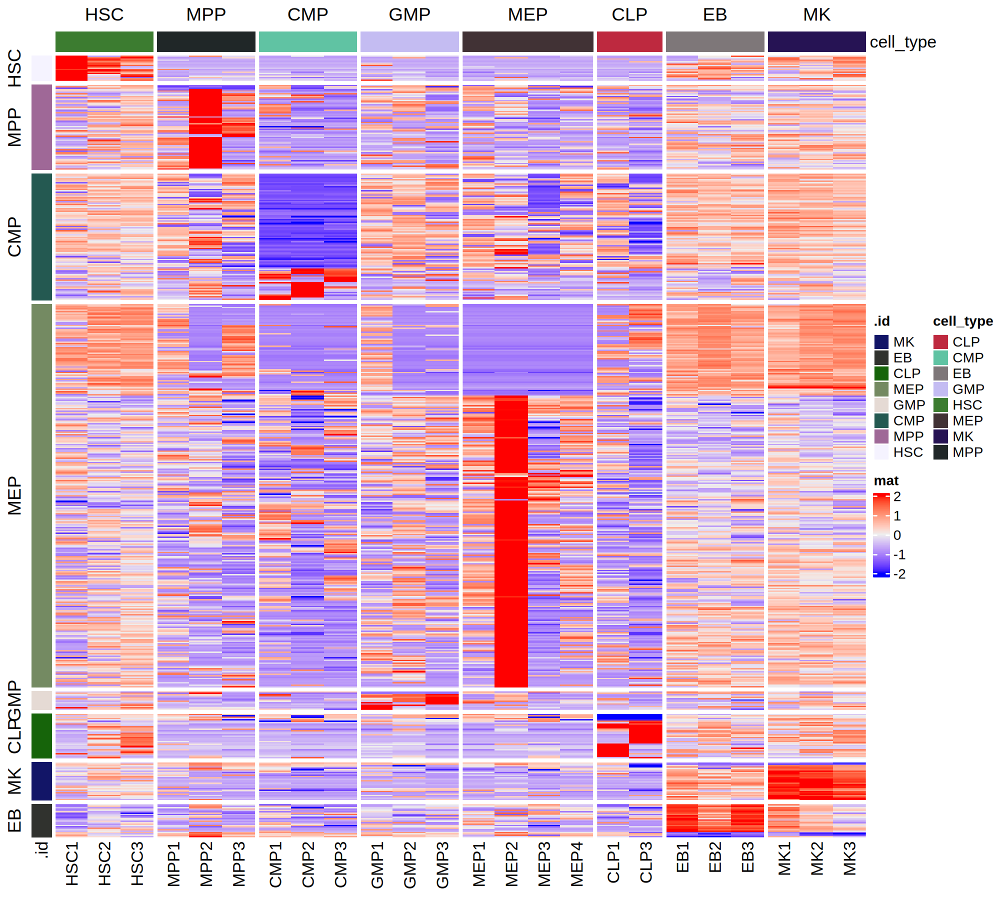

In [31]:
# all sig ones with FDr < 0.1
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)

row_sel = deg_telocal_dt[ PValue < 0.01 & abs(logFC) > 1, ] 
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = rev(cell_types))]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = row_sel$.id, row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  
hp


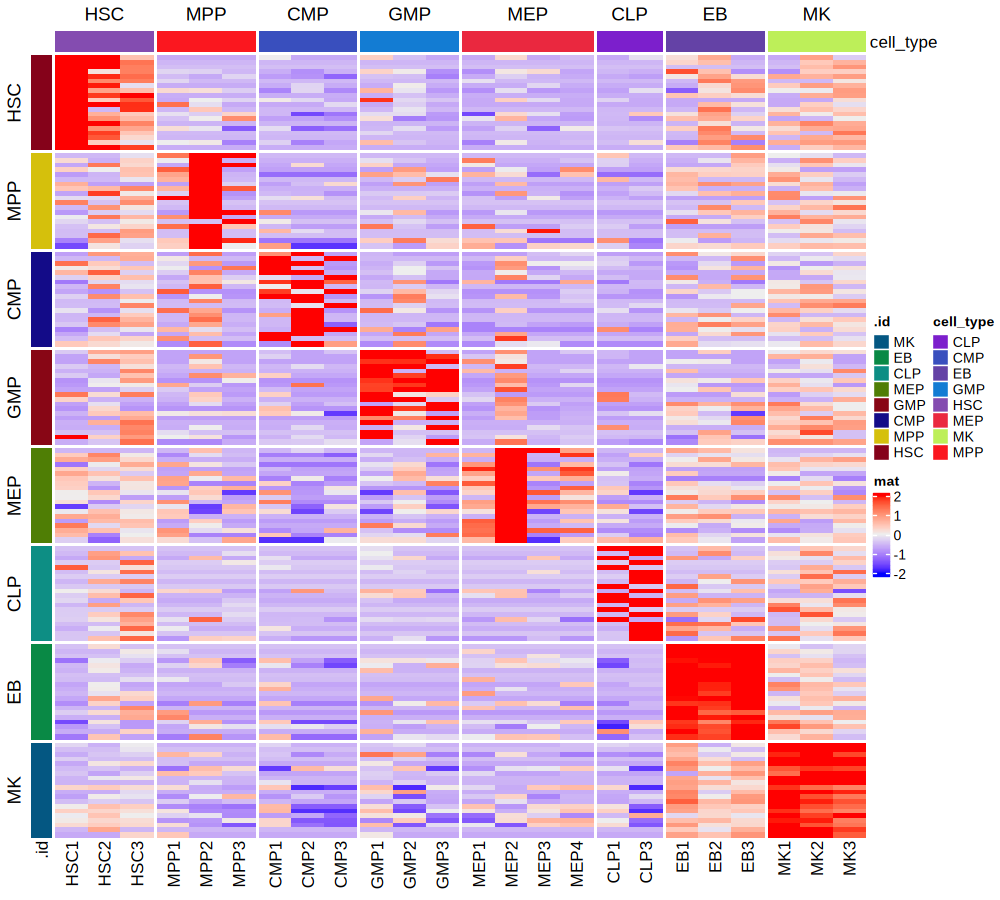

In [34]:
# top 20 up-regulated coding genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_telocal_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
fwrite(row_sel, file = 'data/telocal_up20.xls', sep = '\t') 
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = rev(cell_types))]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(row_sel$.id, levels = cell_types), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


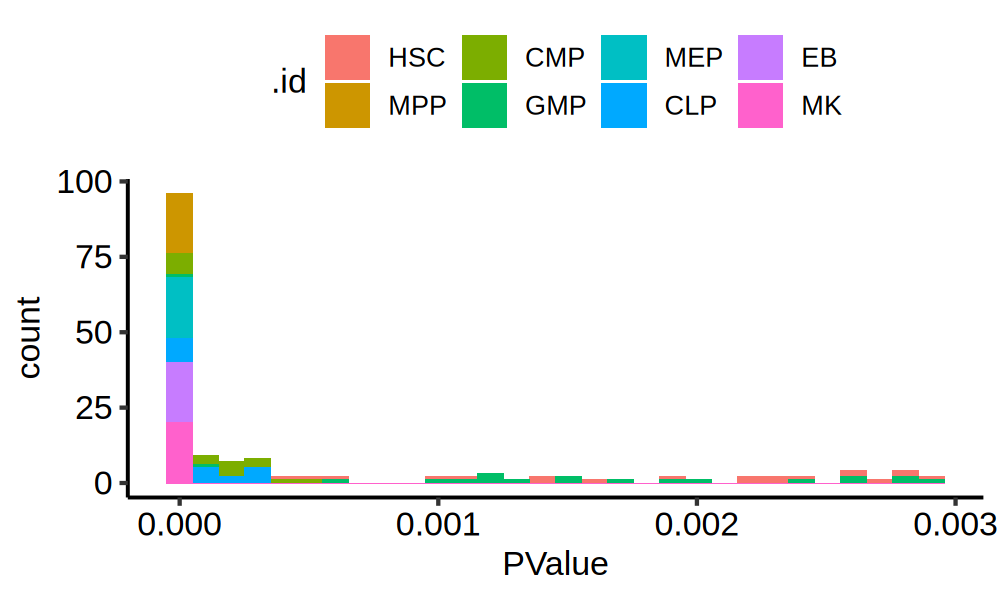

In [236]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = PValue, fill = .id)) + geom_histogram() + theme_pubr()


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


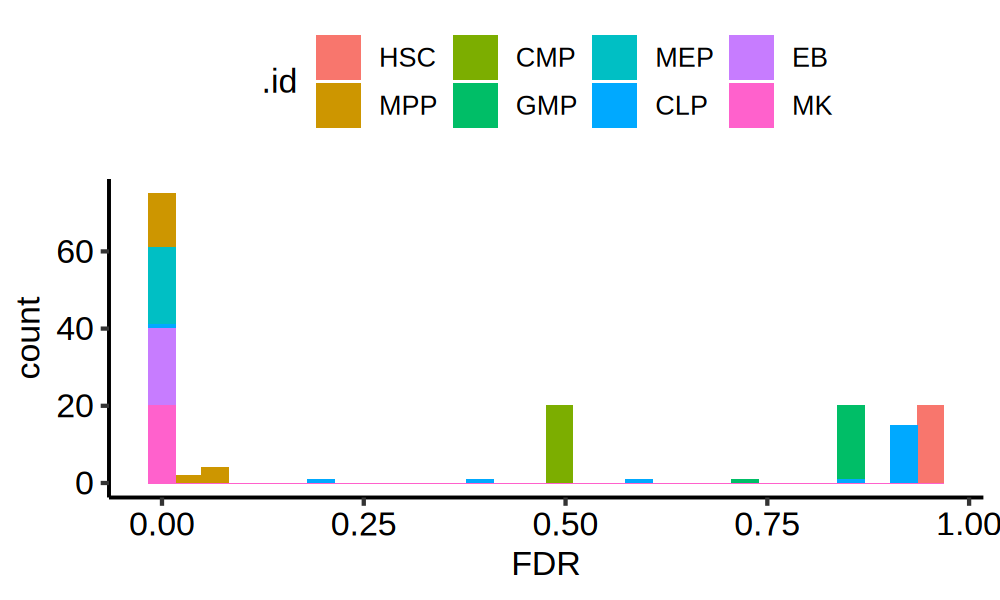

In [237]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = FDR, fill = .id)) + geom_histogram() + theme_pubr()


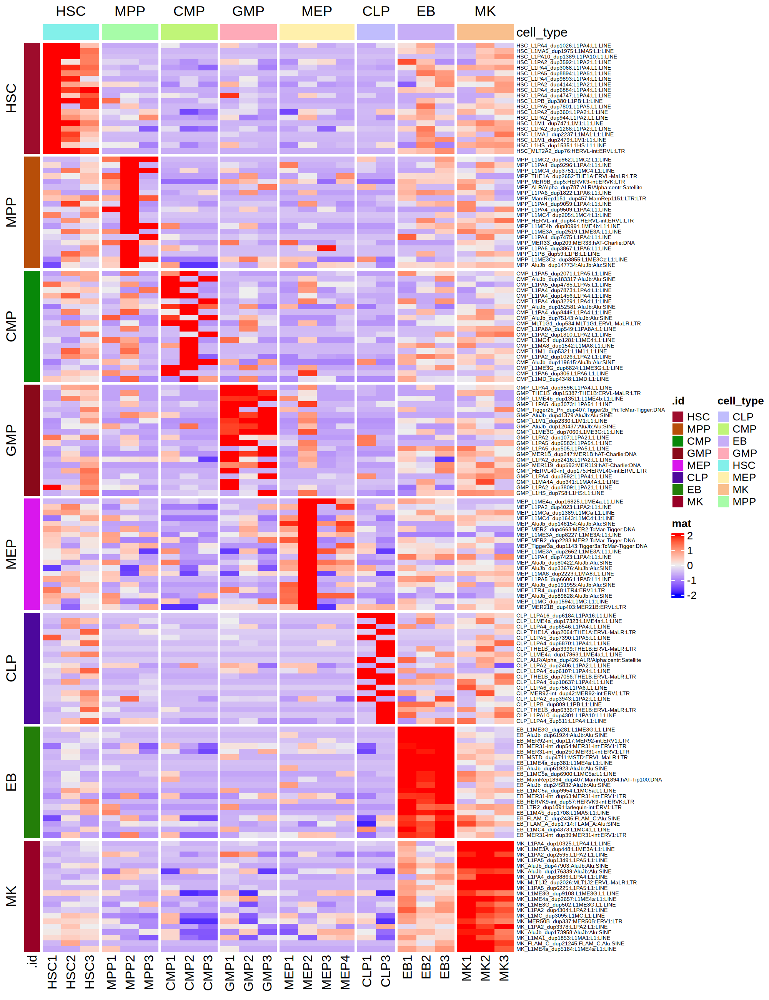

In [37]:
# top 20 up-regulated coding genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 13, repr.plot.res = 200)

row_sel = deg_telocal_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(row_sel$.id, levels = cell_types), 
        row_names_gp = grid::gpar(fontsize = 5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  


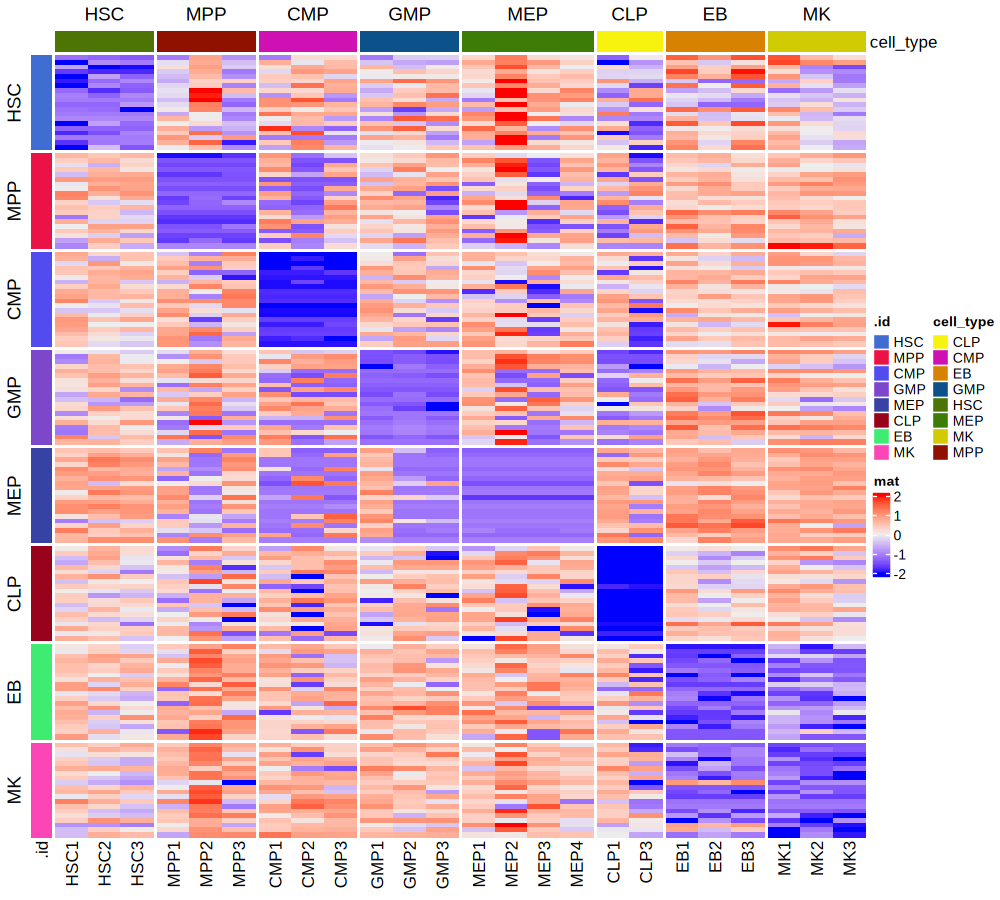

In [39]:
# top 20 dn-regulated coding genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_telocal_dt[logFC < 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
fwrite(row_sel, file = 'data/telocal_down20.xls', sep = '\t') 
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(row_sel$.id, levels = cell_types), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


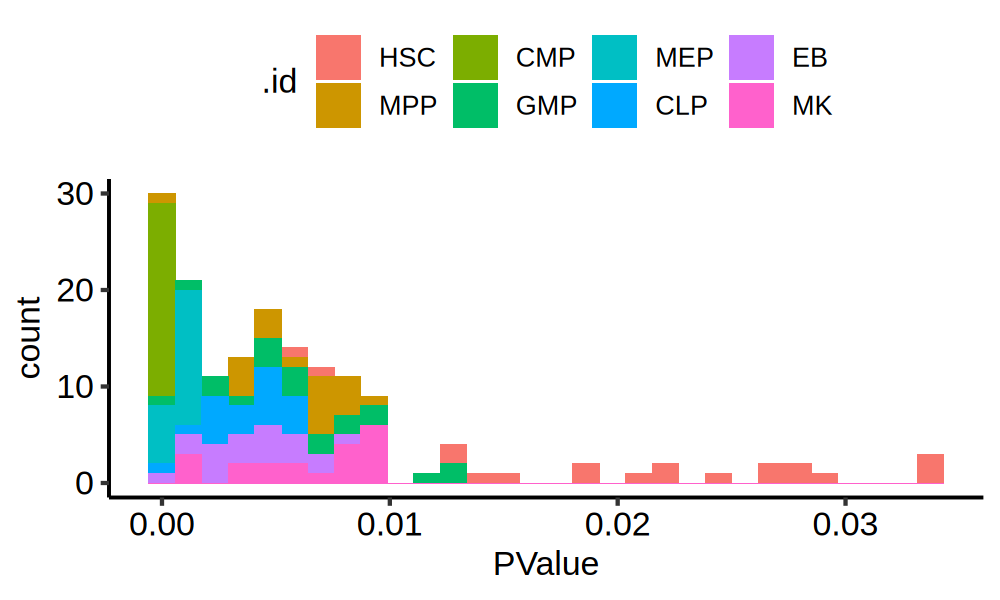

In [917]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = PValue, fill = .id)) + geom_histogram() + theme_pubr()


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


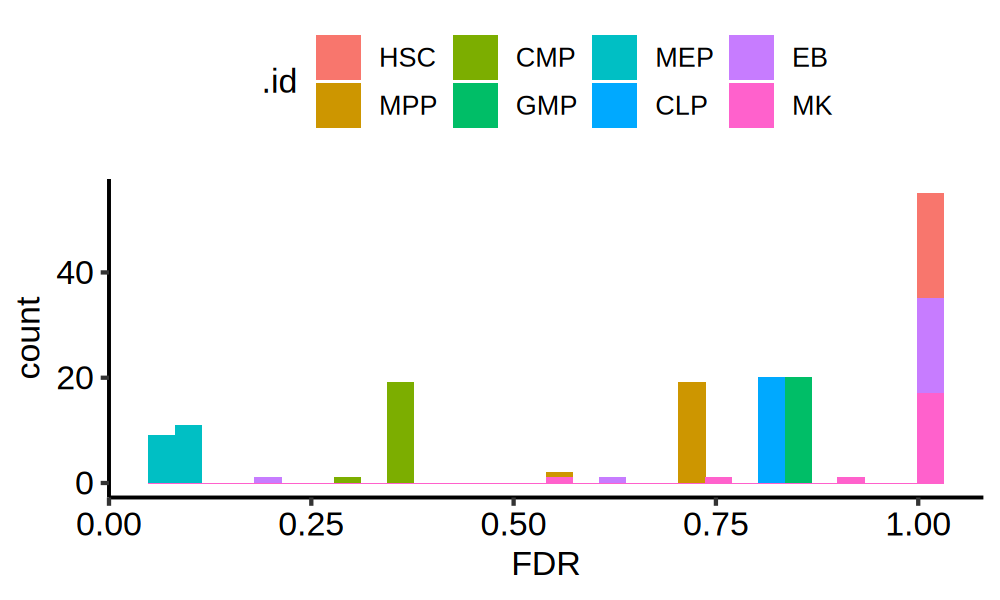

In [918]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = FDR, fill = .id)) + geom_histogram() + theme_pubr()


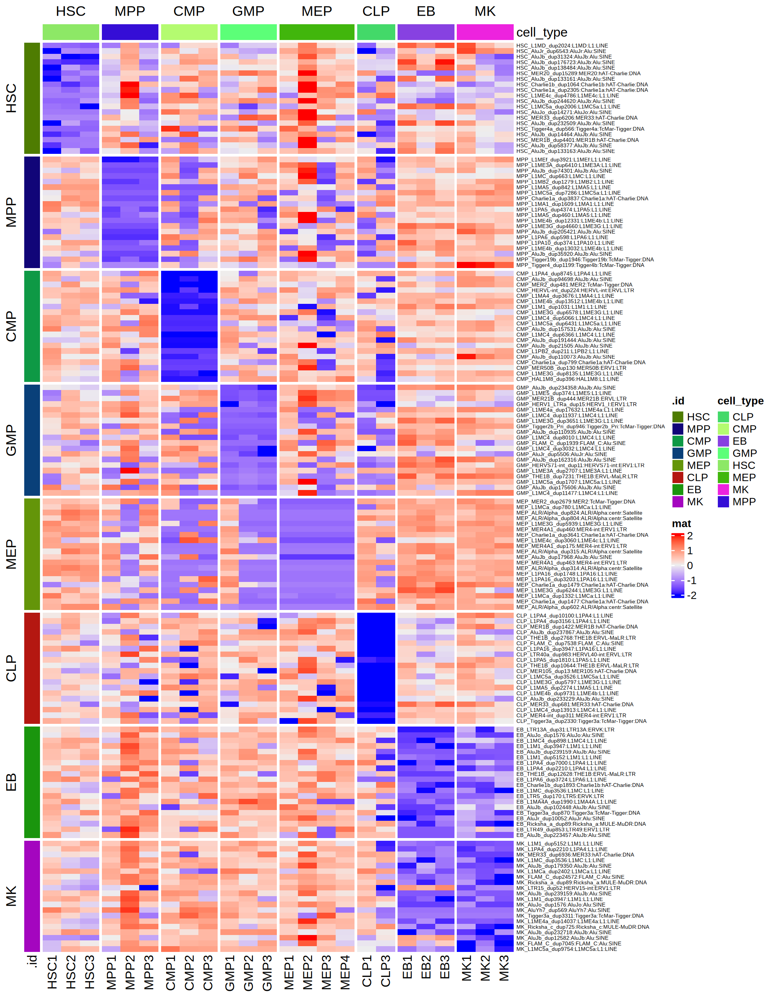

In [43]:
# top 20 dn-regulated coding genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 13, repr.plot.res = 200)

row_sel = deg_telocal_dt[logFC < 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
fwrite(row_sel, file = 'data/telocal_down20.xls', sep = '\t') 
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(row_sel$.id, levels = cell_types), row_names_gp = grid::gpar(fontsize = 5),  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_telocal$cell_type, levels = cell_types))  

## CMP related

In [28]:
cell_type_cmp = c('HSC', 'CMP', 'GMP')

In [66]:
head(deg_telocal_MEPCMP)

.id,rn,logFC,logCPM,PValue,FDR,batch,target,class_id,family_id,gene_id,tx_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
deg_telocal_MEP_EB,MSTD_dup4711:MSTD:ERVL-MaLR:LTR,-15.14818,10.847784,2.234428e-10,6.451911e-06,MEP,EB,LTR,ERVL-MaLR,MSTD,MSTD_dup4711
deg_telocal_MEP_EB,L1ME3G_dup281:L1ME3G:L1:LINE,-13.22592,8.928775,2.035238e-08,1.122423e-04,MEP,EB,LINE,L1,L1ME3G,L1ME3G_dup281
deg_telocal_MEP_EB,L1MC5a_dup9954:L1MC5a:L1:LINE,-13.30574,9.008395,2.299462e-08,1.122423e-04,MEP,EB,LINE,L1,L1MC5a,L1MC5a_dup9954
deg_telocal_MEP_EB,LTR2_dup109:Harlequin-int:ERV1:LTR,-14.01686,9.717875,1.036616e-07,1.122423e-04,MEP,EB,LTR,ERV1,Harlequin-int,LTR2_dup109
deg_telocal_MEP_EB,L1PA10_dup901:L1PA10:L1:LINE,-12.41123,8.117376,1.454230e-07,1.122423e-04,MEP,EB,LINE,L1,L1PA10,L1PA10_dup901
deg_telocal_MEP_EB,L1MA4A_dup1872:L1MA4A:L1:LINE,-11.91200,7.621480,3.271400e-07,1.122423e-04,MEP,EB,LINE,L1,L1MA4A,L1MA4A_dup1872


In [21]:
logcpm_telocal_CMP = read.table(file = 'data/logcpm_telocal_CMP_15Jul.tsv')


In [72]:
te_sel = deg_telocal_MEPCMP[batch == 'CMP' & logFC > 0 & FDR < .2, ]
te_sel[, ctype_gene := paste0(rn, '_', target)]

options(repr.plot.width = 10, repr.plot.height = 13, repr.plot.res = 200)

dsn_col = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_telocal_CMP)), row.names = colnames(logcpm_telocal_CMP))
dsn_col$cell_type = factor(dsn_col$cell_type, levels = unique(dsn_col$cell_type))

dsn_row = te_sel

plotdat = logcpm_telocal_CMP[dsn_row$rn, rownames(dsn_col)]
rownames(plotdat) = dsn_row$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_col[, 'cell_type', drop = F], show_annotation_name = F, show_legend = F)
column_ra = rowAnnotation(df = dsn_row[, 'target', drop = F], show_annotation_name = F, show_legend =  F)
dim(plotdat)

options(repr.plot.width = 3, repr.plot.height = 4, repr.plot.res = 300)
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 5),  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_col$cell_type, levels = cell_type_cmp))  
hp_draw = draw(hp)




[1] 16848     9

Warning message:
“The input is a data frame-like object, convert it to a matrix.”


In [ ]:
norm_updn = function(plotdat, ctype_row, ctype_col = NULL, updn = 'up', rr = .1){
    if(is.null(ctype_col)){ctype_col = ctype_row}
    tmp = plotdat[grep(ctype_row, rownames(plotdat)), grep(ctype_col, colnames(plotdat))]
    nnrow = nrow(tmp); nncol = ncol(tmp)
    tmp = as.vector(tmp)
    set.seed(123)
    if(updn == 'up'){
        tmp = sort(tmp)
        rr = floor(length(tmp) * rr) 
        oo = tmp[ceiling(quantile(1:length(tmp), .25)): ceiling(quantile(1:length(tmp), .75))]
        tmp[1:rr] = sample(oo, rr, replace = T)
    }else{
        tmp = sort(tmp)
        rr = length(tmp) - floor(length(tmp) * rr) 
        oo = tmp[ceiling(quantile(1:length(tmp), .25)): ceiling(quantile(1:length(tmp), .75))]
        tmp[rr:length(tmp)] = sample(oo, length(rr:length(tmp)), replace = T)
    }
    tmp = matrix(sample(tmp, length(tmp)), nrow = nnrow, ncol = nncol)
    plotdat[grep(ctype_row, rownames(plotdat)), grep(ctype_col, colnames(plotdat))] = tmp
    plotdat
}


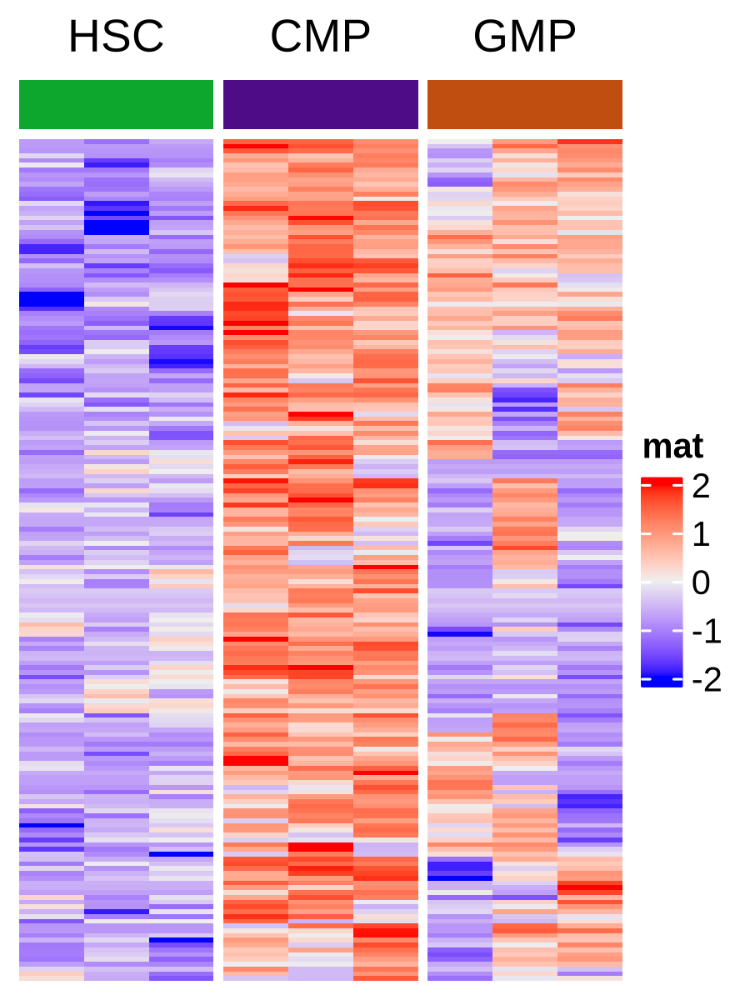

In [67]:
plotdat = as.matrix(plotdat)
nnrow = nrow(plotdat); nncol = ncol(plotdat)
tmp = plotdat[, grep('CMP', colnames(plotdat))]
rr = .13
rr = floor(length(tmp) * rr) 
tmp = as.vector(tmp)
tmp = sort(tmp)
oo = tmp[ceiling(quantile(1:length(tmp), .25)): ceiling(quantile(1:length(tmp), .75))]
tmp[1:rr] = sample(oo, rr, replace = T)
tmp = matrix(sample(tmp, length(tmp)), nrow = nnrow, ncol = 3)
plotdat2 = copy(plotdat)
plotdat2[, grep('CMP', colnames(plotdat))] = tmp

options(repr.plot.width = 3, repr.plot.height = 4, repr.plot.res = 300)
hp = Heatmap(plotdat2, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  # row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 5),  
        show_row_dend = F, top_annotation = column_ha, #left_annotation = column_ra, 
        column_split = factor(dsn_col$cell_type, levels = cell_type_cmp))  
hp_draw = draw(hp)



[1] 1065   13

Warning message:
“The input is a data frame-like object, convert it to a matrix.”


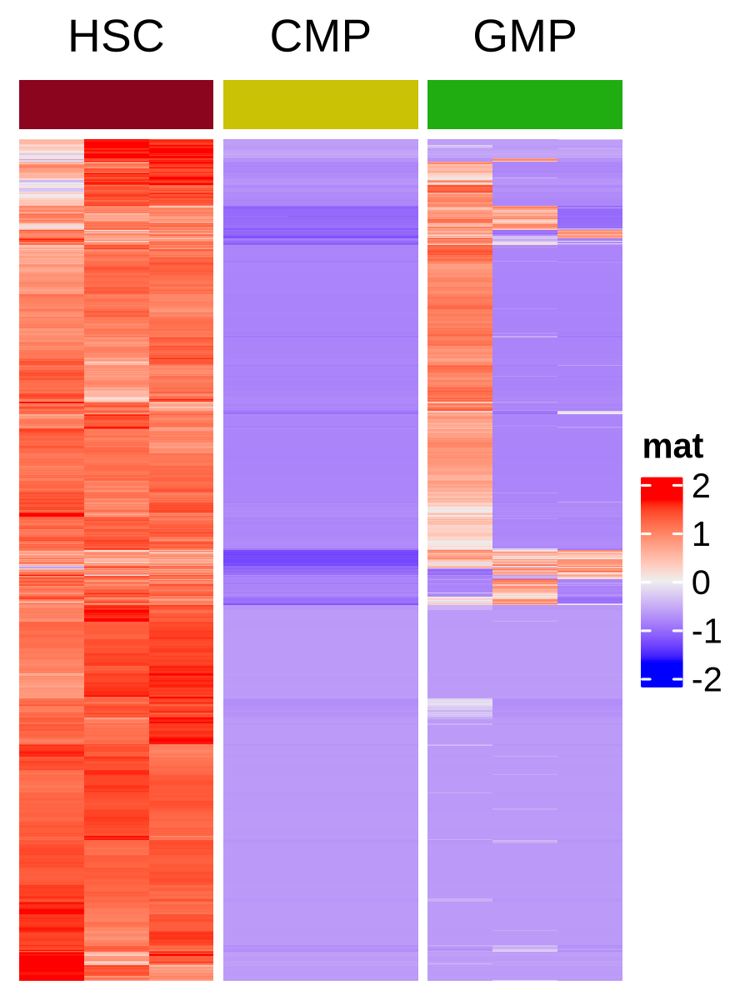

In [70]:
te_sel = deg_telocal_MEPCMP[batch == 'CMP' & logFC < -2 & FDR < .05, ]
te_sel = deg_telocal_MEPCMP[batch == 'CMP' & logFC < -10 & FDR < .01, ]
te_sel[, ctype_gene := paste0(rn, '_', target)]
dim(te_sel)

options(repr.plot.width = 10, repr.plot.height = 13, repr.plot.res = 200)

dsn_col = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_telocal_CMP)), row.names = colnames(logcpm_telocal_CMP))
dsn_col$cell_type = factor(dsn_col$cell_type, levels = unique(dsn_col$cell_type))

dsn_row = te_sel #data.frame(cell_type = deg_cmp_up_sig$target, rn = deg_cmp_up_sig$rn, row.names = deg_cmp_up_sig$ctype_gene)

plotdat = logcpm_telocal_CMP[dsn_row$rn, rownames(dsn_col)]
rownames(plotdat) = dsn_row$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_col[, 'cell_type', drop = F], show_annotation_name = F, show_legend = F)
column_ra = rowAnnotation(df = dsn_row[, 'target', drop = F], show_annotation_name = F, show_legend = F)

options(repr.plot.width = 3, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  #row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, #left_annotation = column_ra, 
        column_split = factor(dsn_col$cell_type, levels = cell_type_cmp))  


In [108]:
ann = readRDS('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/deg_teloccal_cmp_anno.rds')
ann = as.data.table(ann@anno)
ann_dist = ann[annotation == 'Distal Intergenic' & !duplicated(name), ]

In [107]:
length(unique(ann$name))

[1] 13935

In [95]:
dim(ann[annotation == 'Distal Intergenic' & !duplicated(name), ])


[1] 5681   18

[1] 13935    12

[1] 5681   13

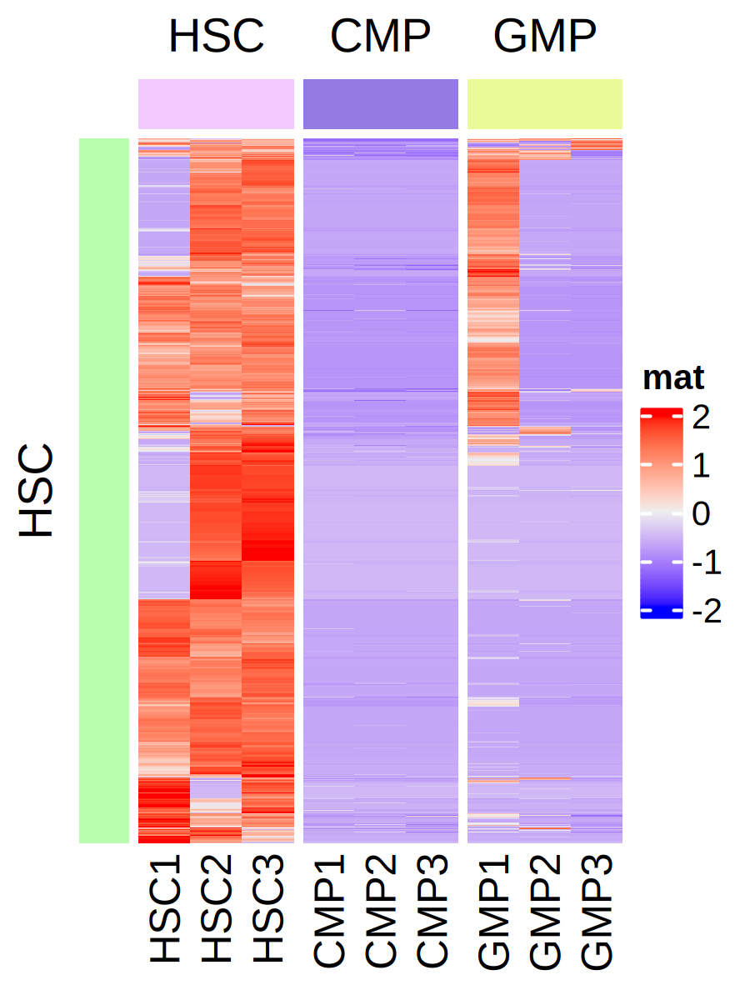

In [109]:
te_sel = deg_telocal_MEPCMP[batch == 'CMP' & logFC < -1 & FDR < .1 & target == 'HSC', ]
dim(te_sel)
te_sel = te_sel[rn %in% ann_dist$name, ]
te_sel[, ctype_gene := paste0(rn, '_', target)]
dim(te_sel)

options(repr.plot.width = 10, repr.plot.height = 13, repr.plot.res = 200)

dsn_col = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_telocal_cmp)), row.names = colnames(logcpm_telocal_cmp))
dsn_col$cell_type = factor(dsn_col$cell_type, levels = unique(dsn_col$cell_type))

dsn_row = te_sel #data.frame(cell_type = deg_cmp_up_sig$target, rn = deg_cmp_up_sig$rn, row.names = deg_cmp_up_sig$ctype_gene)

plotdat = logcpm_telocal_cmp[dsn_row$rn, rownames(dsn_col)]
rownames(plotdat) = dsn_row$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2
dim(plotdat)

column_ha = HeatmapAnnotation(df = dsn_col[, 'cell_type', drop = F], show_annotation_name = F, show_legend = F)
column_ra = rowAnnotation(df = dsn_row[, 'target', drop = F], show_annotation_name = F, show_legend = F)

options(repr.plot.width = 3, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_col$cell_type, levels = cell_type_cmp))  


[1] 13935    12

[1] 8254   13

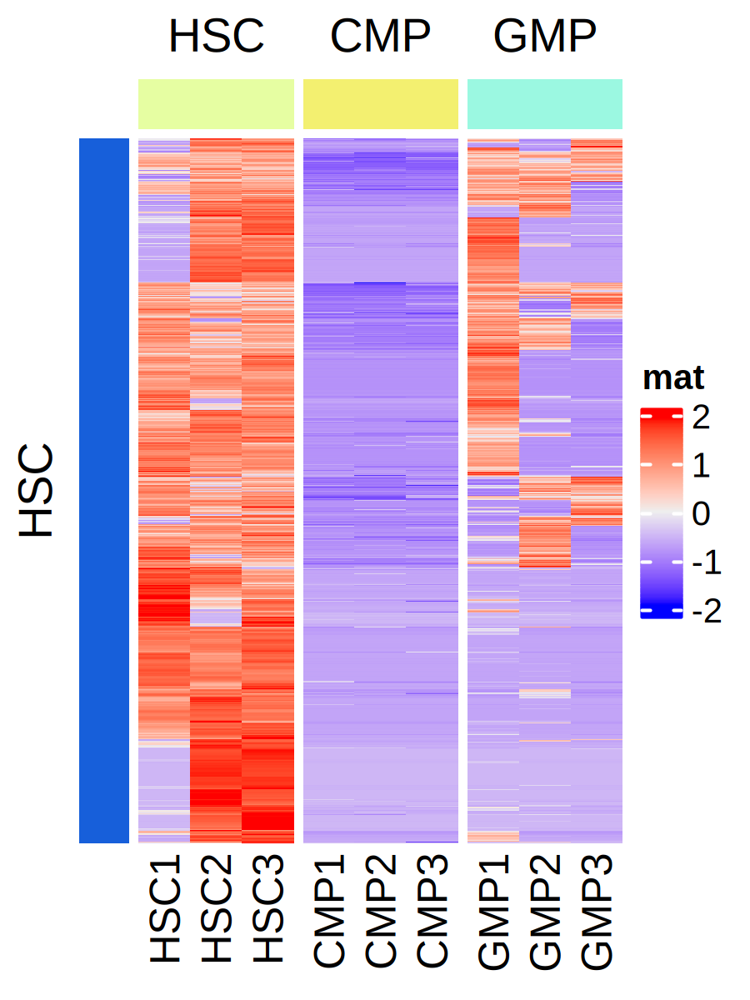

In [110]:
te_sel = deg_telocal_MEPCMP[batch == 'CMP' & logFC < -1 & FDR < .1 & target == 'HSC', ]
dim(te_sel)
te_sel = te_sel[!rn %in% ann_dist$name, ]
te_sel[, ctype_gene := paste0(rn, '_', target)]
dim(te_sel)

options(repr.plot.width = 10, repr.plot.height = 13, repr.plot.res = 200)

dsn_col = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_telocal_cmp)), row.names = colnames(logcpm_telocal_cmp))
dsn_col$cell_type = factor(dsn_col$cell_type, levels = unique(dsn_col$cell_type))

dsn_row = te_sel #data.frame(cell_type = deg_cmp_up_sig$target, rn = deg_cmp_up_sig$rn, row.names = deg_cmp_up_sig$ctype_gene)

plotdat = logcpm_telocal_cmp[dsn_row$rn, rownames(dsn_col)]
rownames(plotdat) = dsn_row$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_col[, 'cell_type', drop = F], show_annotation_name = F, show_legend = F)
column_ra = rowAnnotation(df = dsn_row[, 'target', drop = F], show_annotation_name = F, show_legend = F)

options(repr.plot.width = 3, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 8),  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_col$cell_type, levels = cell_type_cmp))  


In [111]:
deg_telocal_MEPCMP[batch == 'CMP' & logFC < -1 & FDR < .1 & target == 'HSC', ann := 'gene_region']
deg_telocal_MEPCMP[batch == 'CMP' & logFC < -1 & FDR < .1 & target == 'HSC' & rn %in% ann_dist$name, ann := 'distal_region']

In [112]:
saveRDS(deg_telocal_MEPCMP, file = 'data/deg_telocal_MEPCMP_Sep23.rds')

### maplot

Warning message:
"ggrepel: 4366 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 20933 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 3559 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


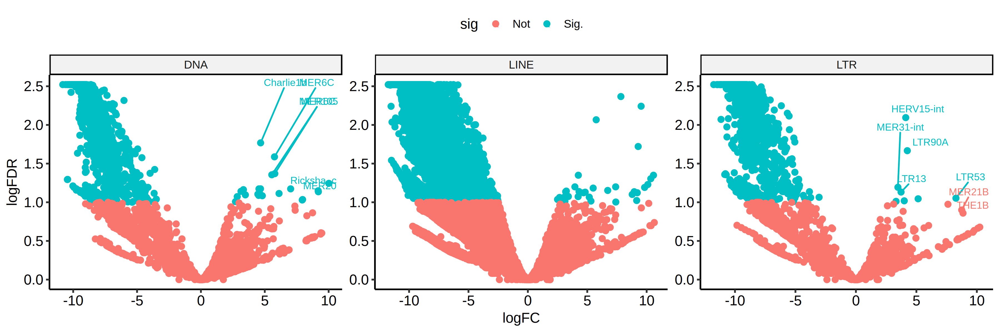

In [90]:
plotdat = deg_telocal_MEPCMP[batch == 'CMP' & target == 'HSC', ]
plotdat[, logFDR := - log(FDR, 10) ]
plotdat[, sig := 'Not']
plotdat[FDR < .1 & abs(logFC) > 1, sig := 'Sig.']
plotdat[, sig := factor(sig, levels = c('Not', 'Sig.'))]
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 300)
ggplot(plotdat, aes(x = logFC, y = logFDR, color = sig, label = gene_id)) + geom_point(size = 2) + 
geom_text_repel(size = 3) + theme_pubr() + facet_wrap(~ class_id, scale = 'free')


Warning message:
"ggrepel: 4367 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 20920 unlabeled data points (too many overlaps). Consider increasing max.overlaps"
Warning message:
"ggrepel: 3556 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


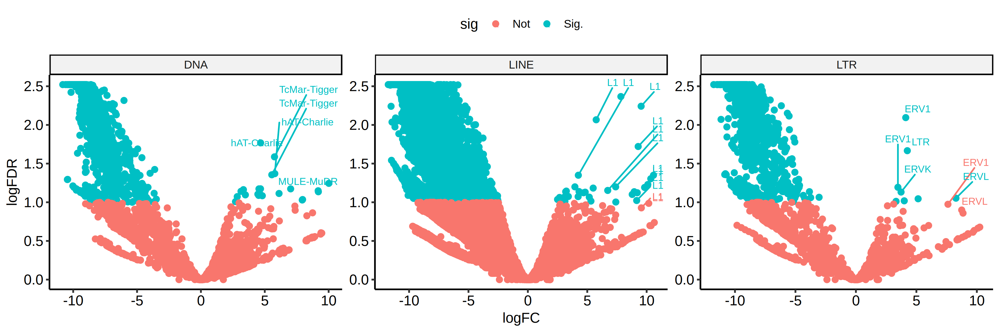

In [91]:
plotdat = deg_telocal_MEPCMP[batch == 'CMP' & target == 'HSC', ]
plotdat[, logFDR := - log(FDR, 10) ]
plotdat[, sig := 'Not']
plotdat[FDR < .1 & abs(logFC) > 1, sig := 'Sig.']
plotdat[, sig := factor(sig, levels = c('Not', 'Sig.'))]
options(repr.plot.width = 12, repr.plot.height = 4, repr.plot.res = 300)
ggplot(plotdat, aes(x = logFC, y = logFDR, color = sig, label = family_id)) + geom_point(size = 2) + 
geom_text_repel(size = 3) + theme_pubr() + facet_wrap(~ class_id, scale = 'free')


## MEP related

In [92]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan"

In [68]:
logcpm_telocal_mep = readRDS(file = 'data/logcpm_telocal_mep.rds')
logcpm_telocal_cmp = readRDS(file = 'data/logcpm_telocal_cmp.rds')


In [87]:
cell_type_mep = c('HSC', 'CMP', 'MEP', 'EB')

In [81]:
head(te_sel)

.id,rn,logFC,logCPM,PValue,FDR,batch,target,class_id,family_id,gene_id,tx_id,ctype_gene
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
deg_telocal_MEP_EB,MSTD_dup4711:MSTD:ERVL-MaLR:LTR,15.14818,10.847784,2.234428e-10,6.451911e-06,MEP,deg_telocal_MEP_EB,LTR,ERVL-MaLR,MSTD,MSTD_dup4711,MSTD_dup4711:MSTD:ERVL-MaLR:LTR_deg_telocal_MEP_EB
deg_telocal_MEP_EB,L1ME3G_dup281:L1ME3G:L1:LINE,13.22592,8.928775,2.035238e-08,1.122423e-04,MEP,deg_telocal_MEP_EB,LINE,L1,L1ME3G,L1ME3G_dup281,L1ME3G_dup281:L1ME3G:L1:LINE_deg_telocal_MEP_EB
deg_telocal_MEP_EB,L1MC5a_dup9954:L1MC5a:L1:LINE,13.30574,9.008395,2.299462e-08,1.122423e-04,MEP,deg_telocal_MEP_EB,LINE,L1,L1MC5a,L1MC5a_dup9954,L1MC5a_dup9954:L1MC5a:L1:LINE_deg_telocal_MEP_EB
deg_telocal_MEP_EB,LTR2_dup109:Harlequin-int:ERV1:LTR,14.01686,9.717875,1.036616e-07,1.122423e-04,MEP,deg_telocal_MEP_EB,LTR,ERV1,Harlequin-int,LTR2_dup109,LTR2_dup109:Harlequin-int:ERV1:LTR_deg_telocal_MEP_EB
deg_telocal_MEP_EB,L1PA10_dup901:L1PA10:L1:LINE,12.41123,8.117376,1.454230e-07,1.122423e-04,MEP,deg_telocal_MEP_EB,LINE,L1,L1PA10,L1PA10_dup901,L1PA10_dup901:L1PA10:L1:LINE_deg_telocal_MEP_EB
deg_telocal_MEP_EB,L1MA4A_dup1872:L1MA4A:L1:LINE,11.91200,7.621480,3.271400e-07,1.122423e-04,MEP,deg_telocal_MEP_EB,LINE,L1,L1MA4A,L1MA4A_dup1872,L1MA4A_dup1872:L1MA4A:L1:LINE_deg_telocal_MEP_EB


In [82]:
deg_telocal_MEPCMP[, target := sub('.*_', '', .id) ]
head(deg_telocal_MEPCMP)

.id,rn,logFC,logCPM,PValue,FDR,batch,target,class_id,family_id,gene_id,tx_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
deg_telocal_MEP_EB,MSTD_dup4711:MSTD:ERVL-MaLR:LTR,15.14818,10.847784,2.234428e-10,6.451911e-06,MEP,EB,LTR,ERVL-MaLR,MSTD,MSTD_dup4711
deg_telocal_MEP_EB,L1ME3G_dup281:L1ME3G:L1:LINE,13.22592,8.928775,2.035238e-08,1.122423e-04,MEP,EB,LINE,L1,L1ME3G,L1ME3G_dup281
deg_telocal_MEP_EB,L1MC5a_dup9954:L1MC5a:L1:LINE,13.30574,9.008395,2.299462e-08,1.122423e-04,MEP,EB,LINE,L1,L1MC5a,L1MC5a_dup9954
deg_telocal_MEP_EB,LTR2_dup109:Harlequin-int:ERV1:LTR,14.01686,9.717875,1.036616e-07,1.122423e-04,MEP,EB,LTR,ERV1,Harlequin-int,LTR2_dup109
deg_telocal_MEP_EB,L1PA10_dup901:L1PA10:L1:LINE,12.41123,8.117376,1.454230e-07,1.122423e-04,MEP,EB,LINE,L1,L1PA10,L1PA10_dup901
deg_telocal_MEP_EB,L1MA4A_dup1872:L1MA4A:L1:LINE,11.91200,7.621480,3.271400e-07,1.122423e-04,MEP,EB,LINE,L1,L1MA4A,L1MA4A_dup1872



  DNA  LINE   LTR 
 1096 12531  2049 

[1] 15676    13

`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



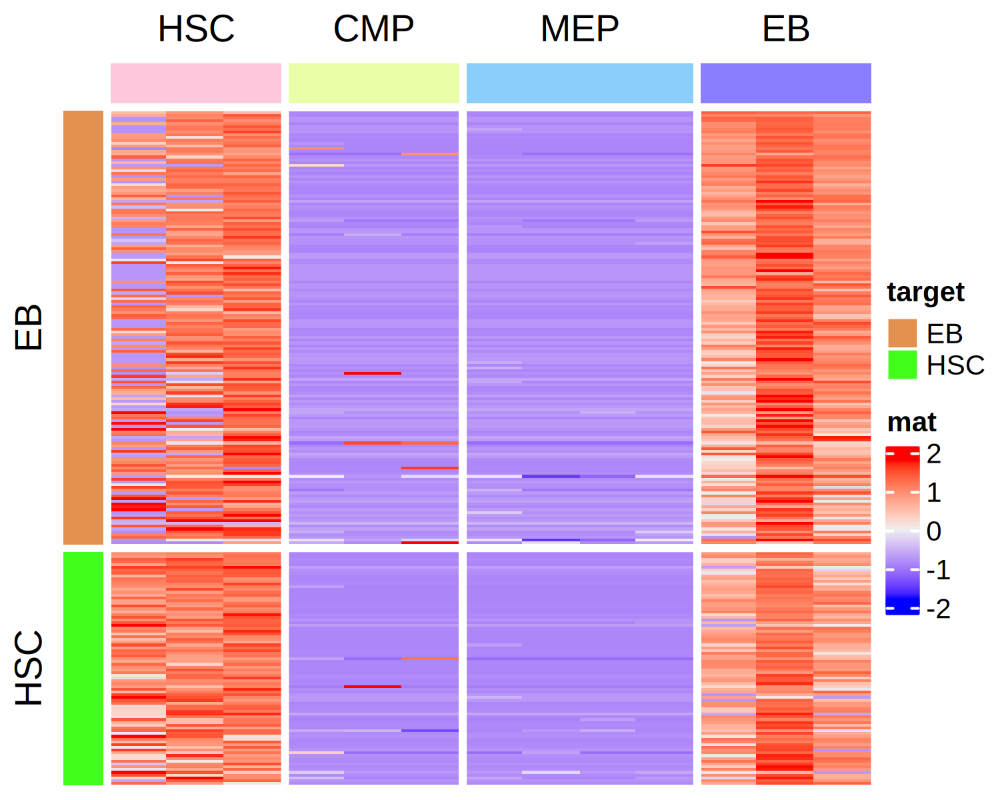

In [123]:
te_sel = deg_telocal_MEPCMP[batch == 'MEP' & logFC > 2 & FDR < .01, ]
te_sel[, ctype_gene := paste0(rn, '_', target)]

dsn_col = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_telocal_mep)), row.names = colnames(logcpm_telocal_mep))
dsn_col$cell_type = factor(dsn_col$cell_type, levels = unique(dsn_col$cell_type))

dsn_row = te_sel 
table(dsn_row$class_id)

plotdat = logcpm_telocal_mep[dsn_row$rn, rownames(dsn_col)]
rownames(plotdat) = dsn_row$ctype_gene
dim(plotdat)

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_col[, 'cell_type', drop = F], show_annotation_name = F, show_legend = F)
column_ra = rowAnnotation(df = dsn_row[, 'target', drop = F], show_annotation_name = F)

options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 5),  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_col$cell_type, levels = cell_type_mep))  

In [ ]:
te_sel = deg_telocal_MEPCMP[batch == 'MEP' & logFC < -2 & FDR < .01, ]
te_sel[, ctype_gene := paste0(rn, '_', target)]

dsn_col = data.frame(cell_type = sub('\\d+', '', colnames(logcpm_telocal_mep)), row.names = colnames(logcpm_telocal_mep))
dsn_col$cell_type = factor(dsn_col$cell_type, levels = unique(dsn_col$cell_type))

dsn_row = te_sel 
table(dsn_row$class_id)
table(dsn_row[class_id == 'LTR', tx_id])
table(dsn_row[class_id == 'LINE', tx_id])

plotdat = logcpm_telocal_mep[dsn_row$rn, rownames(dsn_col)]
rownames(plotdat) = dsn_row$ctype_gene
dim(plotdat)

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_col[, 'cell_type', drop = F], show_annotation_name = F, show_legend = F)
column_ra = rowAnnotation(df = dsn_row[, 'target', drop = F], show_annotation_name = F)

options(repr.plot.width = 7, repr.plot.height = 9, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(dsn_row$target), row_names_gp = grid::gpar(fontsize = 7),  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_col$cell_type, levels = cell_type_mep))  


 DNA LINE  LTR 
  18   37    5 


  LTR13A_dup31    LTR15_dup52    LTR5_dup170  MLT1G1_dup288 THE1B_dup12628 
             1              1              1              1              1 


   L1M1_dup3947    L1M1_dup5152   L1MA1_dup2591   L1MA5_dup2001    L1MC_dup3536 
              1               1               1               1               1 
   L1MC_dup3548   L1MC4_dup1724   L1MC4_dup2672    L1MC4_dup898   L1MC4_dup9927 
              1               1               1               1               1 
 L1MC5a_dup2425   L1MC5a_dup276  L1ME3A_dup8227  L1ME3C_dup1171  L1ME3G_dup1814 
              1               1               1               1               1 
 L1ME3G_dup7896  L1ME3G_dup8599 L1ME4a_dup11257 L1ME4a_dup14037 L1ME4a_dup14303 
              1               1               1               1               1 
 L1ME4a_dup4137  L1ME4a_dup6693  L1ME4b_dup4706  L1ME4c_dup4574  L1PA16_dup1978 
              1               1               1               1               1 
 L1PA16_dup1979  L1PA16_dup5724  L1PA16_dup8355   L1PA4_dup2210   L1PA4_dup3091 
              1               1               1               1               1 
  L1PA4_dup5741   L1PA4_dup

[1] 60 13

# iPSC related TEs in HSPC


In [7]:
dim(deg[FDR < .1 & logFC > 1, ])
dim(deg[FDR < .1 & logFC < -1, ])

[1] 15  6

[1] 9 6

# telocal annotation to known genes

In [147]:
txdb = readRDS('~/workspace/t2t_txdb.rds')

In [141]:
te_sel = deg_telocal_MEPCMP[batch == 'MEP' & logFC > 2 & FDR < .01 & class_id == 'LTR', ]
te_sel = merge(te_sel, te_dt[, .(idd, start, end, chr)], by.x = 'rn', by.y = 'idd') 
head(te_sel)


rn,.id,logFC,logCPM,PValue,FDR,batch,target,class_id,family_id,gene_id,tx_id,start,end,chr
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<chr>
ERVL-B4-int_dup153:ERVL-B4-int:ERVL:LTR,deg_telocal_MEP_EB,8.617123,4.423764,1.172481e-05,0.0001214760,MEP,EB,LTR,ERVL,ERVL-B4-int,ERVL-B4-int_dup153,46858246,46858518,chr19
ERVL-B4-int_dup153:ERVL-B4-int:ERVL:LTR,deg_telocal_MEP_EB,8.617123,4.423764,1.172481e-05,0.0001214760,MEP,EB,LTR,ERVL,ERVL-B4-int,ERVL-B4-int_dup153,46858511,46858685,chr19
ERVL-B4-int_dup153:ERVL-B4-int:ERVL:LTR,deg_telocal_MEP_EB,8.617123,4.423764,1.172481e-05,0.0001214760,MEP,EB,LTR,ERVL,ERVL-B4-int,ERVL-B4-int_dup153,46858979,46859356,chr19
ERVL-B4-int_dup153:ERVL-B4-int:ERVL:LTR,deg_telocal_MEP_EB,8.617123,4.423764,1.172481e-05,0.0001214760,MEP,EB,LTR,ERVL,ERVL-B4-int,ERVL-B4-int_dup153,46859449,46859669,chr19
ERVL-B4-int_dup189:ERVL-B4-int:ERVL:LTR,deg_telocal_MEP_EB,8.091626,3.946695,1.479241e-04,0.0006081021,MEP,EB,LTR,ERVL,ERVL-B4-int,ERVL-B4-int_dup189,64940101,64940567,chr18
ERVL-B4-int_dup189:ERVL-B4-int:ERVL:LTR,deg_telocal_MEP_EB,8.091626,3.946695,1.479241e-04,0.0006081021,MEP,EB,LTR,ERVL,ERVL-B4-int,ERVL-B4-int_dup189,64940876,64941230,chr18


In [143]:
te_sel_gr = makeGRangesFromDataFrame(te_sel, keep.extra.columns = T)
te_sel_gr

GRanges object with 6577 ranges and 12 metadata columns:
         seqnames            ranges strand |                     rn
            <Rle>         <IRanges>  <Rle> |            <character>
     [1]    chr19 46858246-46858518      * | ERVL-B4-int_dup153:E..
     [2]    chr19 46858511-46858685      * | ERVL-B4-int_dup153:E..
     [3]    chr19 46858979-46859356      * | ERVL-B4-int_dup153:E..
     [4]    chr19 46859449-46859669      * | ERVL-B4-int_dup153:E..
     [5]    chr18 64940101-64940567      * | ERVL-B4-int_dup189:E..
     ...      ...               ...    ... .                    ...
  [6573]     chr7 17523267-17523584      * | THE1B_dup9887:THE1B:..
  [6574]     chr7 17523585-17525153      * | THE1B_dup9887:THE1B:..
  [6575]     chr7 17525154-17525510      * | THE1B_dup9887:THE1B:..
  [6576]    chr11 59080043-59081677      * | THE1D-int_dup165:THE..
  [6577]     chr8 88828957-88830532      * | THE1D-int_dup236:THE..
                         .id     logFC    logCPM      PValu

In [149]:
ls()

[1] "base_dir"               "cell_type_cmp"          "cell_type_mep"         
 [4] "cell_types"             "ChIPseekerEnv"          "coding_genes"          
 [7] "column_ha"              "column_ra"              "deg_cmp_up_sig"        
[10] "deg_coding_dt"          "deg_mep_up_sig"         "deg_MEPCMP"            
[13] "deg_te_dt"              "deg_telocal_dt"         "deg_telocal_MEPCMP"    
[16] "dge_all"                "dge_coding"             "dge_te"                
[19] "dsn_all"                "dsn_all_df"             "dsn_col"               
[22] "dsn_row"                "dsn_telocal"            "dsn6"                  
[25] "fit_all"                "fit_coding"             "fit_te"                
[28] "graph_dt"               "logcpm_all"             "logcpm_all_t"          
[31] "logcpm_CMP"             "logcpm_coding"          "logcpm_coding_t"       
[34] "logcpm_MEP"             "logcpm_te"              "logcpm_te_t"           
[37] "logcpm_telocal"         "logcpm_telocal_cmp"     "logcpm_telocal_CMP"    
[40] "logcpm_telocal_mep"     "logcpm_telocal_MEP"     "lsc17"                 
[43] "mtx_all_df"             "mtx_coding_df"          "mtx_te_df"             
[46] "pathway_fun"            "plotdat"                "plotdat0"              
[49] "plotdat1"               "plotdat2"               "sample_names"          
[52] "sample_names_n24"       "scale_fun"              "te_dt"                 
[55] "te_genes"               "te_sel"                 "te_sel_gr"             
[58] "telocal_sel"            "telocal_sel_seqino_ann" "tmp1"                  
[61] "tmp2"                   "tmp3"                   "tmp4"                  
[64] "txdb"

In [144]:
annotatePeak(te_sel_gr, TxDb = txdb, annoDb = org.Hs.eg.db)

>> preparing features information...		 2024-07-21 01:03:08 PM 


ERROR: Error in AnnotationDbi:::.getMetaValue(conn, "DBSCHEMAVERSION"): invalid DB file


In [148]:
transcriptsBy(txdb)


ERROR: Error in AnnotationDbi:::.getMetaValue(conn, "DBSCHEMAVERSION"): invalid DB file


# TE summary based on GTF

In [52]:
telocal_sel = fread('data/telocal_sel.xls')
head(telocal_sel)


rn,.id,logFC,logCPM,PValue,FDR,updn,tag,chr,rmsk,⋯,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd_2
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP,-10.394113,6.156018,1.119425e-03,0.09111988,dn,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,32919806,32920060,1044,-,.,ALR/Alpha,ALR/Alpha_dup314,centr,Satellite,chr16_32919806_32920060__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite
ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP,-10.394113,6.156018,1.119425e-03,0.09111988,dn,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,32920075,32952929,1308,-,.,ALR/Alpha,ALR/Alpha_dup314,centr,Satellite,chr16_32920075_32952929__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite
ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,MEP,-10.519311,6.279623,8.760105e-04,0.08353937,dn,MEP_ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,32952964,32975480,1325,+,.,ALR/Alpha,ALR/Alpha_dup315,centr,Satellite,chr16_32952964_32975480__ALR/Alpha_dup315:ALR/Alpha:centr:Satellite
ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,CLP,7.377682,3.151155,1.170015e-04,0.55519789,up,CLP_ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,chr15,UCSC_rmsk,⋯,15876497,15883791,1177,+,.,ALR/Alpha,ALR/Alpha_dup426,centr,Satellite,chr15_15876497_15883791__ALR/Alpha_dup426:ALR/Alpha:centr:Satellite
ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,MEP,-10.245376,6.009376,1.407620e-03,0.09796758,dn,MEP_ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,chr12,UCSC_rmsk,⋯,34408244,34452774,1272,-,.,ALR/Alpha,ALR/Alpha_dup602,centr,Satellite,chr12_34408244_34452774__ALR/Alpha_dup602:ALR/Alpha:centr:Satellite
ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,MPP,6.753373,4.349032,2.443891e-05,0.17332893,up,MPP_ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,chr9,UCSC_rmsk,⋯,42411679,42415274,1195,-,.,ALR/Alpha,ALR/Alpha_dup787,centr,Satellite,chr9_42411679_42415274__ALR/Alpha_dup787:ALR/Alpha:centr:Satellite


In [65]:
nrow(telocal_sel)

[1] 1505

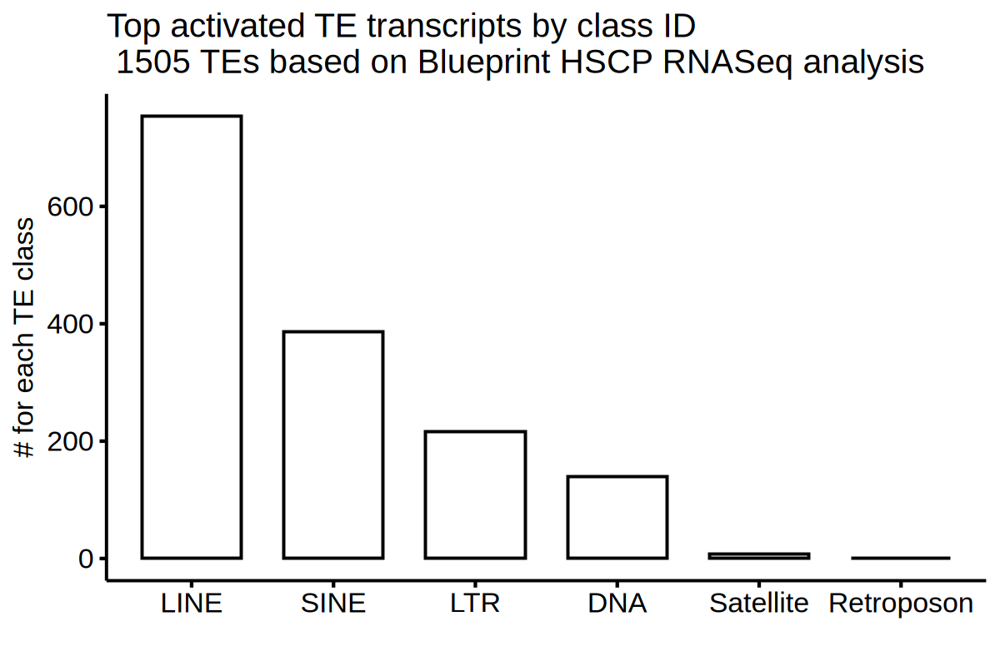

In [67]:
telocal_sel[, nn := nrow(.SD), by = 'class_id']
plotdat = telocal_sel[!duplicated(class_id), ]
plotdat = plotdat[order(nn, decreasing = T), ]

options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)
ggbarplot(plotdat, x = 'class_id', y = 'nn') + xlab('') + ylab('# for each TE class') + 
ggtitle('Top activated TE transcripts by class ID\n 1505 TEs based on Blueprint HSCP RNASeq analysis')


In [13]:
te_dt[, ww := end - start ] 


In [23]:
class_id_freq = table(te_dt$class_id)
class_id_freq = as.data.table(class_id_freq)
setnames(class_id_freq, c('class_id', 'number'))
class_id_freq = class_id_freq[order(number, decreasing = T), ]
class_id_freq

class_id,number
<chr>,<int>
SINE,1782180
LINE,1567840
LTR,751651
DNA,527321
Satellite,49729
Unknown,23274
Retroposon,7380
RC,2267
DNA?,148


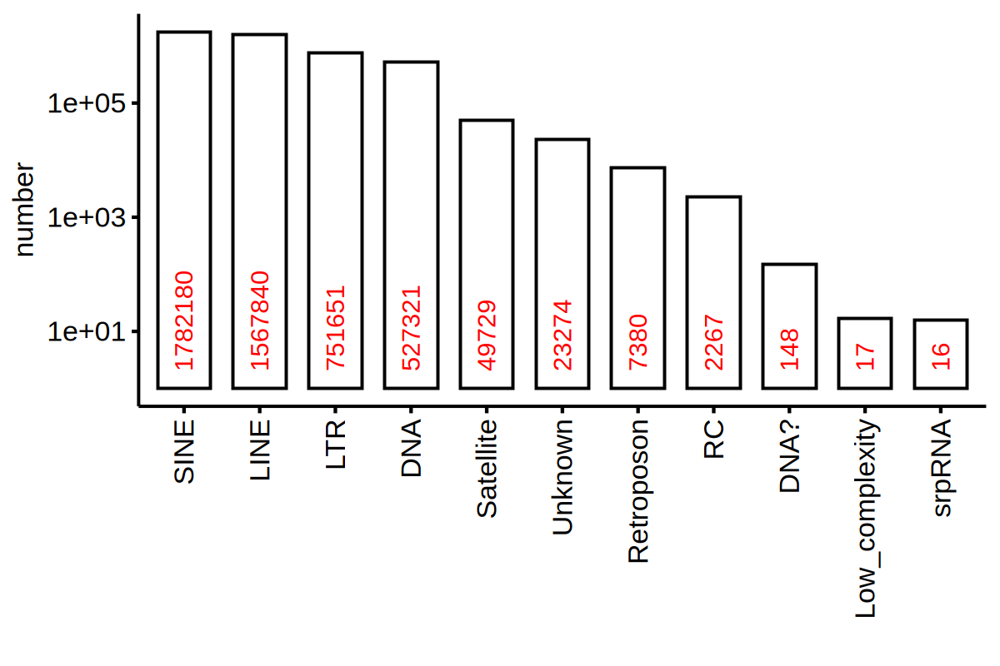

In [45]:
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)
ggbarplot(class_id_freq, x = 'class_id', y = 'number') + theme(axis.text.x = element_text(angle = 90, vjust = .5, hjust = 1)) + xlab('') + 
scale_y_continuous(trans='log10') + annotate(geom = "text", x = 1:11, y = 2, label = class_id_freq$number, color = "red", angle = 90, vjust = .5, hjust = 0)



In [49]:
te_dt[, family_nn := nrow(.SD), by = 'family_id' ] 
family_id_nn = te_dt[!duplicated(family_id), ] 
head(family_id_nn)


chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd,idd_2,ww,ll,family_nn
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>
chr1,UCSC_rmsk,exon,2710,4402,5119,-,.,TAR1,TAR1_dup164,subtelo,Satellite,TAR1_dup164:TAR1:subtelo:Satellite,chr1_2710_4402__TAR1_dup164:TAR1:subtelo:Satellite,1692,164841316,201
chr1,UCSC_rmsk,exon,4083,4533,962,-,.,LTR60B,LTR60B_dup190,ERV1,LTR,LTR60B_dup190:LTR60B:ERV1:LTR,chr1_4083_4533__LTR60B_dup190:LTR60B:ERV1:LTR,450,273806534,183553
chr1,UCSC_rmsk,exon,4664,5263,1304,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_4664_5263__L1MC3_dup5932:L1MC3:L1:LINE,599,636588645,981465
chr1,UCSC_rmsk,exon,5687,6131,2442,+,.,MSTA1,MSTA1_dup469,ERVL-MaLR,LTR,MSTA1_dup469:MSTA1:ERVL-MaLR:LTR,chr1_5687_6131__MSTA1_dup469:MSTA1:ERVL-MaLR:LTR,444,273806534,351557
chr1,UCSC_rmsk,exon,12273,12571,2329,+,.,AluY,AluY_dup96151,Alu,SINE,AluY_dup96151:AluY:Alu:SINE,chr1_12273_12571__AluY_dup96151:AluY:Alu:SINE,298,392098234,1205643
chr1,UCSC_rmsk,exon,14342,14427,190,+,.,MIRb,MIRb_dup184492,MIR,SINE,MIRb_dup184492:MIRb:MIR:SINE,chr1_14342_14427__MIRb_dup184492:MIRb:MIR:SINE,85,392098234,574467


In [47]:
te_dt[, ll := sum(.SD$ww), by = 'class_id']
class_id_ll = te_dt[!duplicated(class_id), ]
class_id_ll


chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd,idd_2,ww,ll
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>
chr1,UCSC_rmsk,exon,2710,4402,5119,-,.,TAR1,TAR1_dup164,subtelo,Satellite,TAR1_dup164:TAR1:subtelo:Satellite,chr1_2710_4402__TAR1_dup164:TAR1:subtelo:Satellite,1692,164841316
chr1,UCSC_rmsk,exon,4083,4533,962,-,.,LTR60B,LTR60B_dup190,ERV1,LTR,LTR60B_dup190:LTR60B:ERV1:LTR,chr1_4083_4533__LTR60B_dup190:LTR60B:ERV1:LTR,450,273806534
chr1,UCSC_rmsk,exon,4664,5263,1304,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_4664_5263__L1MC3_dup5932:L1MC3:L1:LINE,599,636588645
chr1,UCSC_rmsk,exon,12273,12571,2329,+,.,AluY,AluY_dup96151,Alu,SINE,AluY_dup96151:AluY:Alu:SINE,chr1_12273_12571__AluY_dup96151:AluY:Alu:SINE,298,392098234
chr1,UCSC_rmsk,exon,19731,19815,295,-,.,MER112,MER112_dup3643,hAT-Charlie,DNA,MER112_dup3643:MER112:hAT-Charlie:DNA,chr1_19731_19815__MER112_dup3643:MER112:hAT-Charlie:DNA,84,109266601
chr1,UCSC_rmsk,exon,61829,61890,241,-,.,UCON41,UCON41_dup503,Unknown,Unknown,UCON41_dup503:UCON41:Unknown:Unknown,chr1_61829_61890__UCON41_dup503:UCON41:Unknown:Unknown,61,5391325
chr1,UCSC_rmsk,exon,157687,157800,355,+,.,SVA_E,SVA_E_dup842,SVA,Retroposon,SVA_E_dup842:SVA_E:SVA:Retroposon,chr1_157687_157800__SVA_E_dup842:SVA_E:SVA:Retroposon,113,4668727
chr1,UCSC_rmsk,exon,3260748,3260858,270,-,.,Helitron3Na_Mam,Helitron3Na_Mam_dup821,Helitron,RC,Helitron3Na_Mam_dup821:Helitron3Na_Mam:Helitron:RC,chr1_3260748_3260858__Helitron3Na_Mam_dup821:Helitron3Na_Mam:Helitron:RC,110,458721
chr1,UCSC_rmsk,exon,19940621,19940634,307,-,.,7SLRNA,AluY_dup97248,srpRNA,srpRNA,AluY_dup97248:7SLRNA:srpRNA:srpRNA,chr1_19940621_19940634__AluY_dup97248:7SLRNA:srpRNA:srpRNA,13,724


In [17]:
options(repr.plot.width = 10, repr.plot.height = 7, repr.plot.res = 200)
ggbarplot(te_dt, 'class_id')

In [16]:
te_dt[class_id == 'LTR' & ww > 100000, ]

chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd,idd_2,ww
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
chrY,UCSC_rmsk,exon,20961204,21226263,2653,-,.,LTR12B,LTR12B_dup126,ERV1,LTR,LTR12B_dup126:LTR12B:ERV1:LTR,chrY_20961204_21226263__LTR12B_dup126:LTR12B:ERV1:LTR,265059


In [ ]:
ggdensity(te_dt, x = "weight", fill = "lightgray", add = "mean", rug = TRUE) + facet_by 


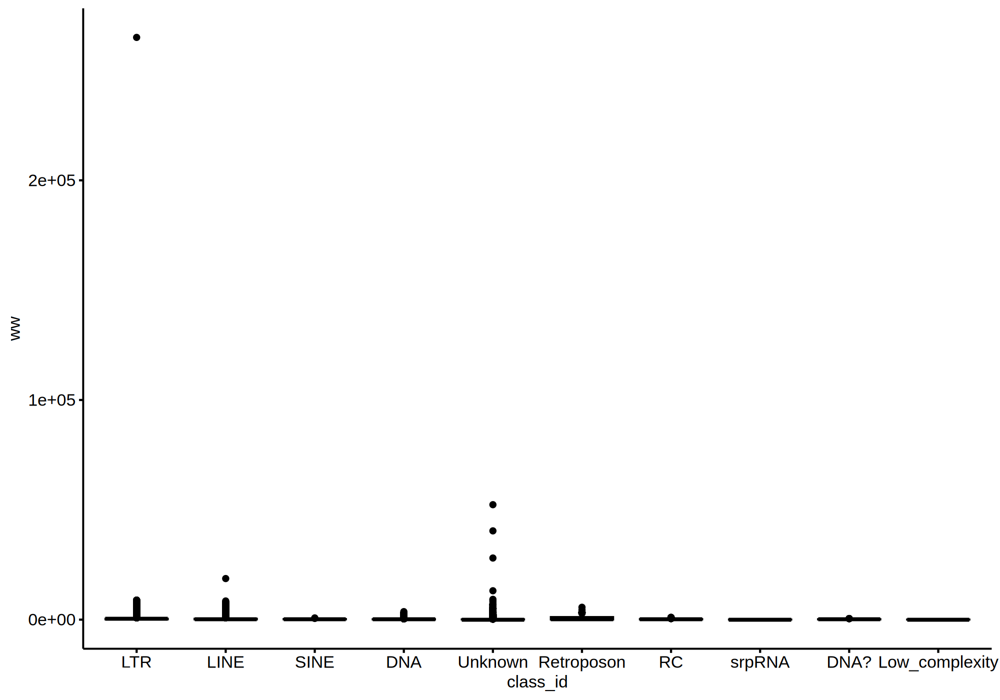

In [15]:
options(repr.plot.width = 10, repr.plot.height = 7, repr.plot.res = 200)
ggboxplot(te_dt[class_id != 'Satellite', ], x = 'class_id', y = 'ww')

In [12]:
head(te_dt)

chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd,idd_2
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,UCSC_rmsk,exon,2710,4402,5119,-,.,TAR1,TAR1_dup164,subtelo,Satellite,TAR1_dup164:TAR1:subtelo:Satellite,chr1_2710_4402__TAR1_dup164:TAR1:subtelo:Satellite
chr1,UCSC_rmsk,exon,4083,4533,962,-,.,LTR60B,LTR60B_dup190,ERV1,LTR,LTR60B_dup190:LTR60B:ERV1:LTR,chr1_4083_4533__LTR60B_dup190:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4534,4660,505,-,.,LTR60B,LTR60B_dup191,ERV1,LTR,LTR60B_dup191:LTR60B:ERV1:LTR,chr1_4534_4660__LTR60B_dup191:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4664,5263,1304,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_4664_5263__L1MC3_dup5932:L1MC3:L1:LINE
chr1,UCSC_rmsk,exon,5275,5528,1403,+,.,MER34C_v,MER34C_v_dup375,ERV1,LTR,MER34C_v_dup375:MER34C_v:ERV1:LTR,chr1_5275_5528__MER34C_v_dup375:MER34C_v:ERV1:LTR
chr1,UCSC_rmsk,exon,5529,5686,3544,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_5529_5686__L1MC3_dup5932:L1MC3:L1:LINE


In [51]:
head(telocal_sel)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'head': object 'telocal_sel' not found


# annotate and summarize top TE

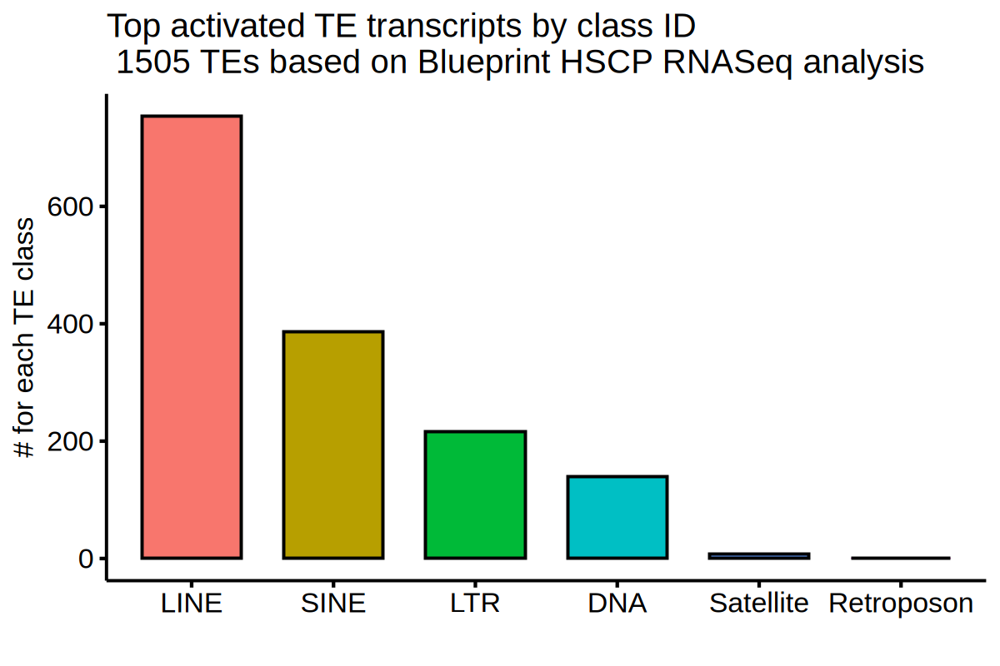

In [73]:
telocal_sel_seqino = copy(telocal_sel)
telocal_sel_seqino[, nn := nrow(.SD), by = 'class_id']
plotdat = telocal_sel_seqino[!duplicated(class_id), ]
plotdat = plotdat[order(nn, decreasing = T), ]

options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)
ggbarplot(plotdat, x = 'class_id', y = 'nn', fill = 'class_id') + xlab('') + ylab('# for each TE class') + 
ggtitle('Top activated TE transcripts by class ID\n 1505 TEs based on Blueprint HSCP RNASeq analysis') + rremove('legend')


In [51]:
telocal_sel_seqino = merge(telocal_sel, te_dt, by.x = 'rn', by.y = 'idd', all.x = T)
telocal_sel_seqino[, ctype_gene := paste0(.id, '__', rn)]
telocal_sel_seqino[, cell_type := .id]
fwrite(telocal_sel_seqino, file = 'data/telocal_sel_may29.xls', sep = '\t')


In [59]:
head(telocal_sel_seqino)

rn,.id,logFC,logCPM,PValue,FDR,updn,tag,chr,rmsk,⋯,width,strand,score,gene_id,transcript_id,family_id,class_id,idd_2,ctype_gene,cell_type
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP,-10.394113,6.156018,1.119425e-03,0.09111988,dn,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,1044,-,.,ALR/Alpha,ALR/Alpha_dup314,centr,Satellite,chr16_32919806_32920060__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP
ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP,-10.394113,6.156018,1.119425e-03,0.09111988,dn,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,1308,-,.,ALR/Alpha,ALR/Alpha_dup314,centr,Satellite,chr16_32920075_32952929__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP
ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,MEP,-10.519311,6.279623,8.760105e-04,0.08353937,dn,MEP_ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,1325,+,.,ALR/Alpha,ALR/Alpha_dup315,centr,Satellite,chr16_32952964_32975480__ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,MEP__ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,MEP
ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,CLP,7.377682,3.151155,1.170015e-04,0.55519789,up,CLP_ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,chr15,UCSC_rmsk,⋯,1177,+,.,ALR/Alpha,ALR/Alpha_dup426,centr,Satellite,chr15_15876497_15883791__ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,CLP__ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,CLP
ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,MEP,-10.245376,6.009376,1.407620e-03,0.09796758,dn,MEP_ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,chr12,UCSC_rmsk,⋯,1272,-,.,ALR/Alpha,ALR/Alpha_dup602,centr,Satellite,chr12_34408244_34452774__ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,MEP__ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,MEP
ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,MPP,6.753373,4.349032,2.443891e-05,0.17332893,up,MPP_ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,chr9,UCSC_rmsk,⋯,1195,-,.,ALR/Alpha,ALR/Alpha_dup787,centr,Satellite,chr9_42411679_42415274__ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,MPP__ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,MPP


In [60]:
tmp = data.frame(seqname = telocal_sel_seqino$chr, start = telocal_sel_seqino$start, end = telocal_sel_seqino$end, name = telocal_sel_seqino$ctype_gene)
gr = GRanges(tmp)
gr_anno = annotatePeak(gr, TxDb=txdb, tssRegion=c(-3000, 3000), verbose=FALSE, annoDb = 'org.Hs.eg.db', addFlankGeneInfo = T)
telocal_anno_dt = as.data.table(gr_anno@anno, keep.rownames = T)
head(telocal_anno_dt)


'select()' returned 1:many mapping between keys and columns

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


rn,seqnames,start,end,width,strand,name,annotation,geneChr,geneStart,⋯,geneStrand,geneId,transcriptId,distanceToTSS,ENSEMBL,SYMBOL,GENENAME,flank_txIds,flank_geneIds,flank_gene_distances
<chr>,<fct>,<int>,<int>,<int>,<fct>,<chr>,<chr>,<int>,<int>,⋯,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,chr16,32919806,32920060,255,*,MEP__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,"Exon (ENST00000621154.1/ENST00000621154.1, exon 4 of 15)",16,32878706,⋯,2,386757,ENST00000431994.5,-34305,ENSG00000290985,SLC6A10P,"solute carrier family 6 member 10, pseudogene",NA,NA,NA
2,chr16,32920075,32952929,32855,*,MEP__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,"Exon (ENST00000621154.1/ENST00000621154.1, exon 5 of 15)",16,32878706,⋯,2,386757,ENST00000431994.5,-34574,ENSG00000290985,SLC6A10P,"solute carrier family 6 member 10, pseudogene",NA,NA,NA
3,chr16,32952964,32975480,22517,*,MEP__ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,"Exon (ENST00000567619.1/ENST00000567619.1, exon 2 of 3)",16,32878706,⋯,2,386757,ENST00000431994.5,-67463,ENSG00000290985,SLC6A10P,"solute carrier family 6 member 10, pseudogene",NA,NA,NA
4,chr15,15876497,15883791,7295,*,CLP__ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,Distal Intergenic,15,20012741,⋯,1,105379202,ENST00000611556.1,-4128950,NA,FAM30B,family with sequence similarity 30 member B,NA,NA,NA
5,chr12,34408244,34452774,44531,*,MEP__ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,Distal Intergenic,12,34191037,⋯,2,124903068,ENST00000660987.1,-188998,NA,LOC124903068,uncharacterized LOC124903068,NA,NA,NA
6,chr9,42411679,42415274,3596,*,MPP__ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,"Exon (ENST00000454088.2/ENST00000454088.2, exon 1 of 1)",9,42566993,⋯,2,103908605,ENST00000428895.1,154036,NA,FAM88E,family with sequence similarity 88 member E,NA,NA,NA


In [61]:
telocal_sel_seqino_ann = merge(telocal_sel_seqino[!duplicated(ctype_gene), ], telocal_anno_dt, by.x = 'ctype_gene', by.y = 'name', all.x = T)

In [50]:
head(telocal_sel_seqino_ann)
dim(telocal_sel_seqino_ann)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'head': object 'telocal_sel_seqino_ann' not found


In [11]:
head(te_dt)


chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd,idd_2
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,UCSC_rmsk,exon,2710,4402,5119,-,.,TAR1,TAR1_dup164,subtelo,Satellite,TAR1_dup164:TAR1:subtelo:Satellite,chr1_2710_4402__TAR1_dup164:TAR1:subtelo:Satellite
chr1,UCSC_rmsk,exon,4083,4533,962,-,.,LTR60B,LTR60B_dup190,ERV1,LTR,LTR60B_dup190:LTR60B:ERV1:LTR,chr1_4083_4533__LTR60B_dup190:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4534,4660,505,-,.,LTR60B,LTR60B_dup191,ERV1,LTR,LTR60B_dup191:LTR60B:ERV1:LTR,chr1_4534_4660__LTR60B_dup191:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4664,5263,1304,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_4664_5263__L1MC3_dup5932:L1MC3:L1:LINE
chr1,UCSC_rmsk,exon,5275,5528,1403,+,.,MER34C_v,MER34C_v_dup375,ERV1,LTR,MER34C_v_dup375:MER34C_v:ERV1:LTR,chr1_5275_5528__MER34C_v_dup375:MER34C_v:ERV1:LTR
chr1,UCSC_rmsk,exon,5529,5686,3544,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_5529_5686__L1MC3_dup5932:L1MC3:L1:LINE


In [63]:
gr_anno

Annotated peaks generated by ChIPseeker
1505/1505  peaks were annotated
Genomic Annotation Summary:
             Feature  Frequency
8   Promoter (<=1kb)  9.7674419
9   Promoter (1-2kb)  5.8471761
10  Promoter (2-3kb)  5.1827243
4             5' UTR  0.3986711
3             3' UTR  3.0564784
1           1st Exon  1.1295681
6         Other Exon  2.7242525
2         1st Intron 15.1495017
7       Other Intron 27.1096346
5  Distal Intergenic 29.6345515

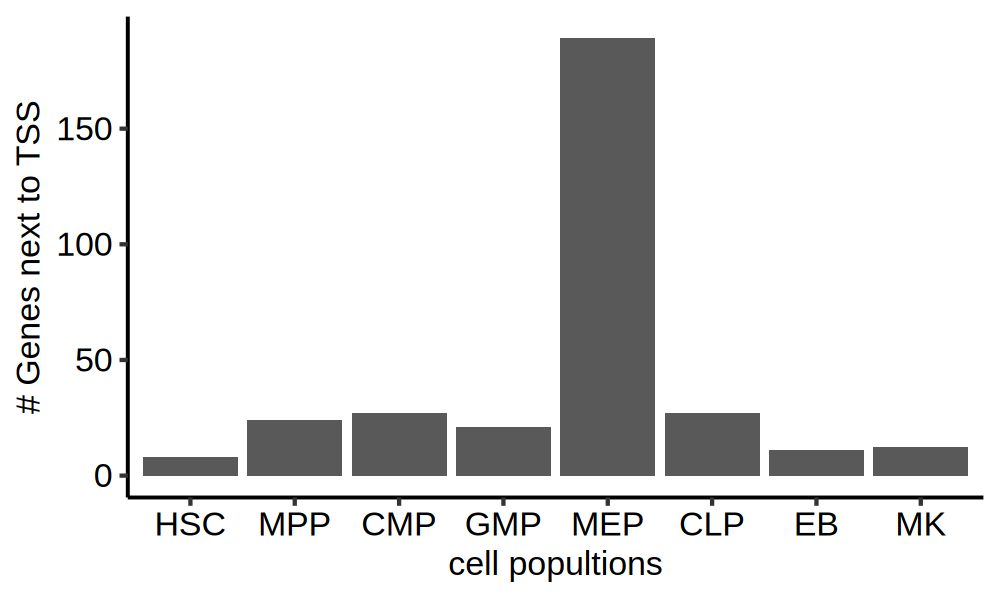

In [70]:
tmp = as.data.frame.matrix(table(telocal_sel_seqino_ann[!is.na(SYMBOL) & abs(distanceToTSS) < 3100, SYMBOL],  telocal_sel_seqino_ann[!is.na(SYMBOL) & abs(distanceToTSS) < 3100, cell_type]) )
tmp2 = as.data.table(apply(tmp, 2, sum), keep.rownames = T)
setnames(tmp2, c('cell_type', 'ene_num'))
tmp2[, cell_type := factor(cell_type, levels = c(cell_types))] 
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(tmp2, aes(cell_type, ene_num)) + geom_bar(stat = 'identity') + theme_pubr() + xlab('cell popultions') + ylab('# Genes next to TSS')


In [71]:
gs = telocal_sel_seqino_ann[!is.na(SYMBOL) & abs(distanceToTSS) < 3000 & cell_type == 'CMP', SYMBOL]
yy = enrichGO(gs, OrgDb = org.Hs.eg.db, keyType = 'SYMBOL', ont="BP", pvalueCutoff=0.01)


In [ ]:
yy_res = as.data.table(yy@result)
yy_res = yy_res[order(pvalue), ]


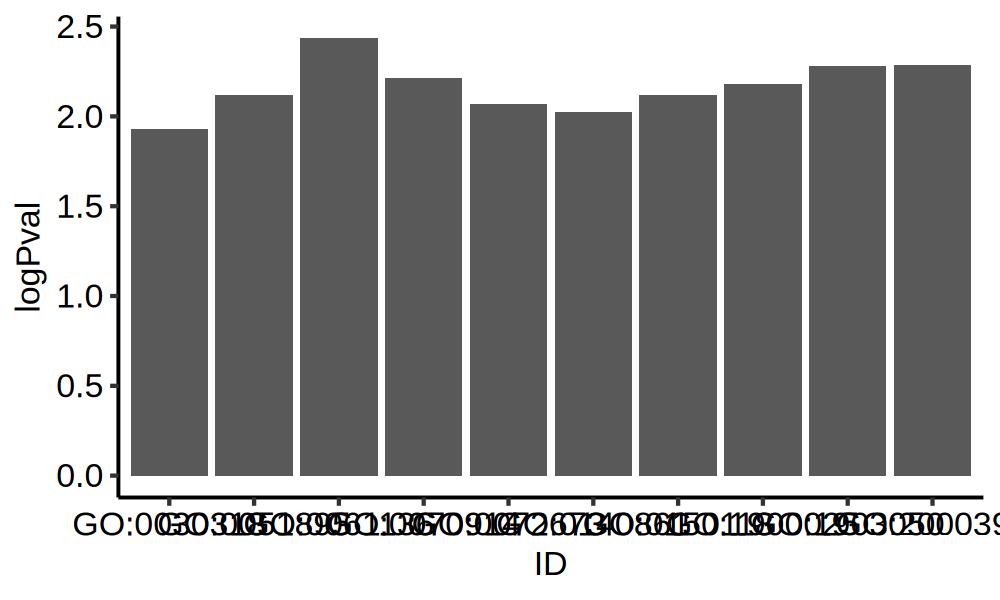

In [78]:
yy_res[, logPval := -log(pvalue, 10)] 
ggplot(yy_res[1:10, ], aes(ID, logPval)) + geom_bar(stat = 'identity') + theme_pubr()


In [75]:
head(yy_res)
                

ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count,logFDR
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<dbl>
GO:0061136,regulation of proteasomal protein catabolic process,2/9,196/18870,0.003683105,0.1072957,0.06507301,PSMC2/FHIT,2,0.9694178
GO:2000392,regulation of lamellipodium morphogenesis,1/9,11/18870,0.005235313,0.1072957,0.06507301,CORO1C,1,0.9694178
GO:1903050,regulation of proteolysis involved in protein catabolic process,2/9,235/18870,0.005248195,0.1072957,0.06507301,PSMC2/FHIT,2,0.9694178
GO:0070914,UV-damage excision repair,1/9,13/18870,0.006184567,0.1072957,0.06507301,DDB2,1,0.9694178
GO:1900025,negative regulation of substrate adhesion-dependent cell spreading,1/9,14/18870,0.006658891,0.1072957,0.06507301,CORO1C,1,0.9694178
GO:0051895,negative regulation of focal adhesion assembly,1/9,16/18870,0.007606937,0.1072957,0.06507301,CORO1C,1,0.9694178


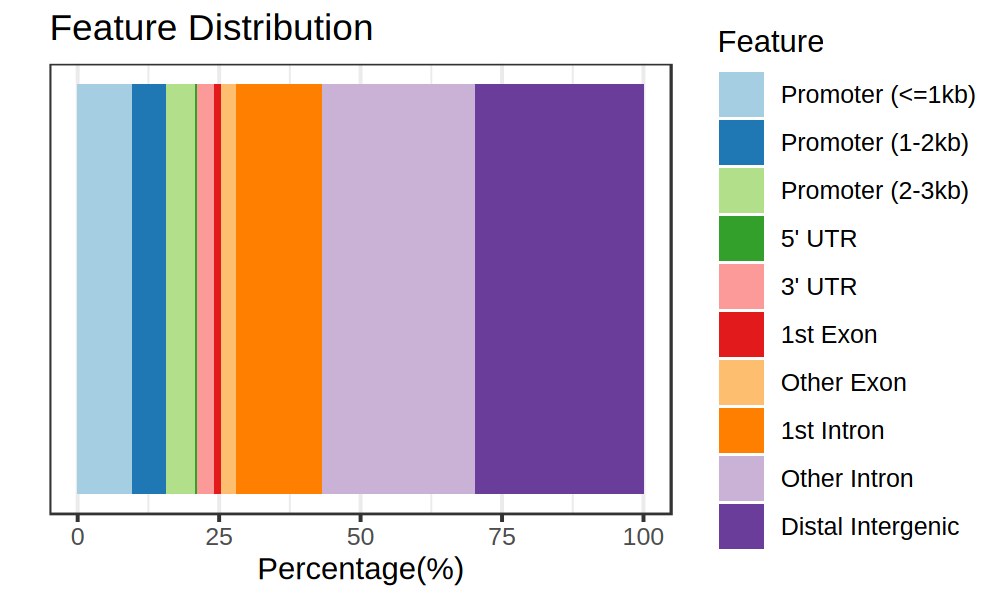

In [79]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
plotAnnoBar(gr_anno)

# TE tree plot

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'head': object 'te_dt' not found


In [ ]:
# lvl1 : TE => class id
# lvl2 : class id => family id
# lvl3 : family id => gene id
# lvl4 : gene id => transcript id

In [187]:
graph_dt = readRDS('data/te_dt_may08.rds')
graph_dt[class_id == family_id, family_id := paste0(family_id, '_F')]
graph_dt[family_id == gene_id, gene_id := paste0(gene_id, '_G')]
graph_dt[gene_id == transcript_id, transcript_id := paste0(transcript_id, '_Tx')]

graph_dt[family_id %in% graph_dt$class_id, family_id := paste0(family_id, '_F')]
graph_dt[gene_id %in% graph_dt$family_id, gene_id := paste0(family_id, '_G')]
graph_dt[transcript_id %in% graph_dt$gene_id, transcript_id := paste0(family_id, '_Tx')]


In [191]:
tmp1 = graph_dt[!duplicated(class_id), .(class_id)]
setnames(tmp1, 1, 'to')
tmp1[, from := 'TE'] 
tmp1 = relocate(tmp1, 2)
tmp1$lvl = 'lvl1'

tmp2 = graph_dt[!duplicated(family_id), .(class_id, family_id)]
setnames(tmp2, c('from', 'to'))
tmp2$lvl = 'lvl2'

tmp3 = graph_dt[!duplicated(gene_id), .(family_id, gene_id)]
setnames(tmp3, c('from', 'to'))
tmp3$lvl = 'lvl3'

tmp4 = graph_dt[!duplicated(transcript_id), .(gene_id, transcript_id)]
setnames(tmp4, c('from', 'to'))
tmp4$lvl = 'lvl4'

graph_dt_2 = rbindlist(list(tmp1, tmp2, tmp3, tmp4), use.names=TRUE )
graph_dt_2[, from_ori := from]
graph_dt_2[, to_ori := to]

fwrite(graph_dt_2, file = 'data/graph_dt')

graph_dt = copy(graph_dt_2)
remove(graph_dt_2)


In [ ]:
graph_dt[, nn := 1:nrow(graph_dt)] # nn added for convenient reference
# if lvl4 has problem:
lvl4_dt = graph_dt[from == to & lvl == 'lvl4', ]
graph_dt[nn %in% lvl4_dt$nn, to := paste0(to, '_Tx')]


In [158]:
graph_dt[from == to, ]

from,to,lvl,nn
<chr>,<chr>,<chr>,<int>
Unknown,Unknown,lvl2,24
LTR,LTR,lvl2,26
Satellite,Satellite,lvl2,31
DNA,DNA,lvl2,34
srpRNA,srpRNA,lvl2,51
DNA?,DNA?,lvl2,53
Low_complexity,Low_complexity,lvl2,61
Alu,Alu,lvl3,110
MIR,MIR,lvl3,117


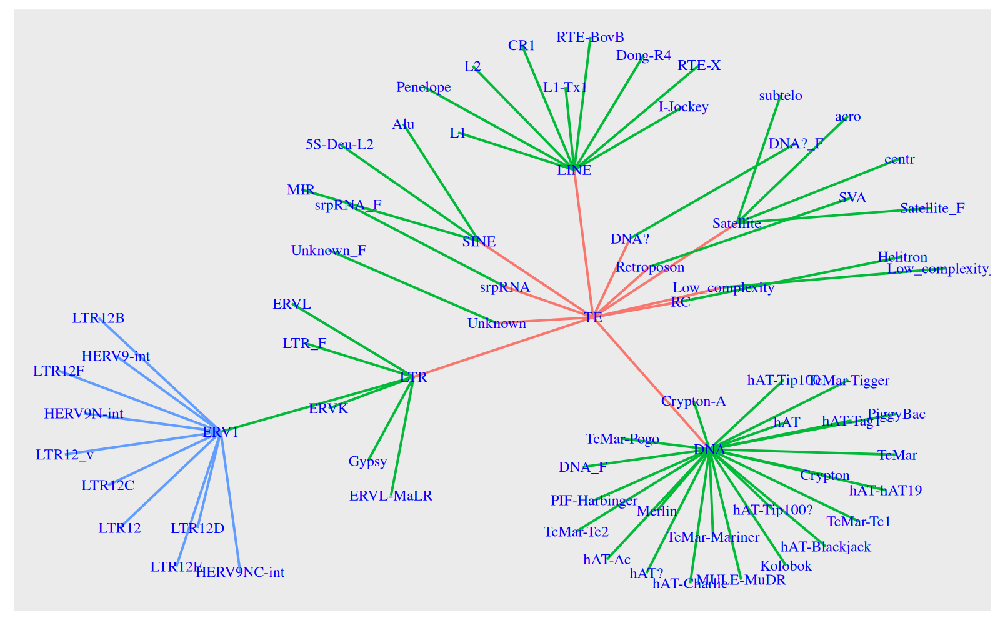

In [192]:
plotdat0 = graph_dt[lvl %in% c('lvl1', 'lvl2'), ] 
plotdat1 = graph_dt[grepl('HERV9', to) & lvl == 'lvl3', ] 
plotdat2 = graph_dt[grepl('LTR12', to) & lvl == 'lvl3', ] 
plotdat = rbind(plotdat0, plotdat1, plotdat2)
plotdat = as_tbl_graph(plotdat)

options(repr.plot.width = 8, repr.plot.height = 5, repr.plot.res = 200)
ggraph(plotdat, layout = 'stress') +  geom_edge_link(aes(colour = factor(lvl))) +  #geom_node_point() + 
  geom_node_text(aes(label = name),  colour = 'blue', size=3, show.legend = FALSE, family = "serif") + theme(legend.position = "none")


# BCAT in HSPC

In [194]:
genes = c('BCAT1', 'BCAT2', 'SLC7A8')


rn,BCAT1,BCAT2,SLC7A8,cell_type
<chr>,<dbl>,<dbl>,<dbl>,<fct>
CLP1,5.101753,3.517052,1.5381969,CLP
CLP3,5.090762,2.128723,0.3149615,CLP
CMP1,5.424535,4.072155,2.5423603,CMP
CMP2,5.884538,4.104046,3.1154551,CMP
CMP3,4.958027,4.062217,2.9162621,CMP
EB1,5.923482,3.894558,0.3836219,EB


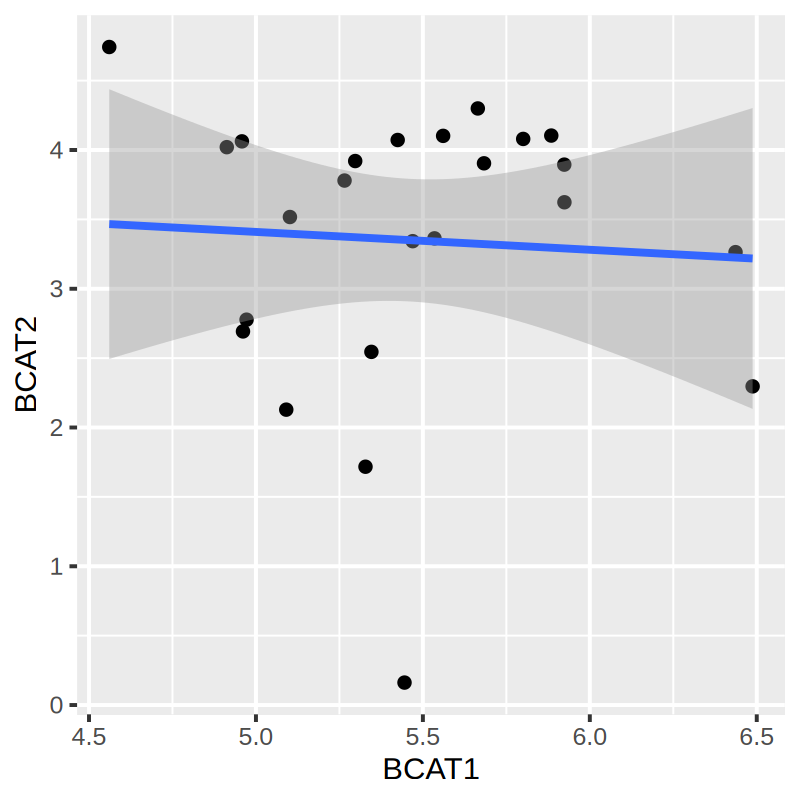

In [241]:
plotdat = as.data.table(t(logcpm_coding[genes, ]), keep.rownames = T)
plotdat[, cell_type := sub('\\d+', '', rn)]
plotdat[, cell_type := factor(cell_type, levels = cell_types)] 
plotdat = plotdat[rn != 'CLP2', ]
head(plotdat)

ggplot(plotdat, aes(BCAT1, BCAT2)) + geom_point() + stat_smooth(method = "lm",  formula = y ~ x,  geom = "smooth") 


In [202]:
plotdat = as.data.table(t(logcpm_coding[genes, ]), keep.rownames = T)
plotdat[, cell_type := sub('\\d+', '', rn)]
plotdat[, cell_type := factor(cell_type, levels = cell_types)] 
plotdat = plotdat[rn != 'CLP2', ]
plotdat = melt(plotdat)
setnames(plotdat, c('sample_name', 'cell_type', 'gene_name', 'expression'))

head(plotdat)

Warning message in melt.data.table(plotdat):
"id.vars and measure.vars are internally guessed when both are 'NULL'. All non-numeric/integer/logical type columns are considered id.vars, which in this case are columns [rn, cell_type, ...]. Consider providing at least one of 'id' or 'measure' vars in future."


sample_name,cell_type,gene_name,expression
<chr>,<fct>,<fct>,<dbl>
CLP1,CLP,BCAT1,5.101753
CLP3,CLP,BCAT1,5.090762
CMP1,CMP,BCAT1,5.424535
CMP2,CMP,BCAT1,5.884538
CMP3,CMP,BCAT1,4.958027
EB1,EB,BCAT1,5.923482


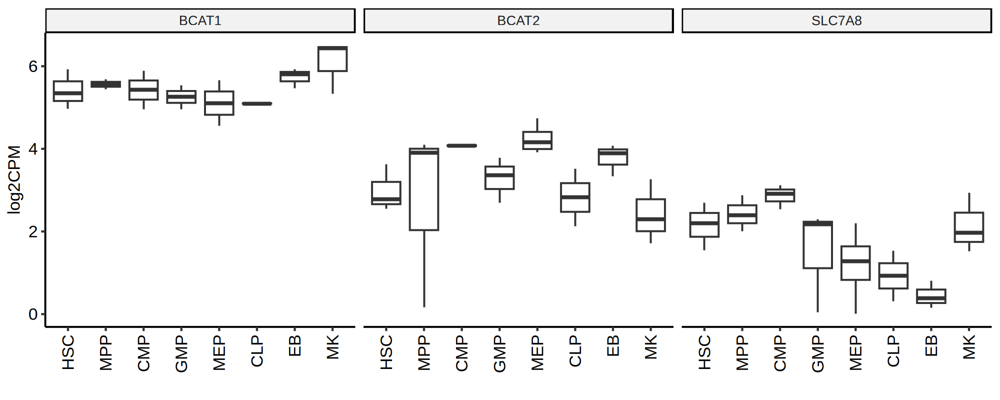

In [213]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat, aes(cell_type, expression)) + geom_boxplot(outlier.colour = NA) + 
facet_wrap(~ gene_name) + theme_pubr() + xlab('') + ylab('log2CPM') +
theme(axis.text.x = element_text(angle = 90, vjust = .5, hjust = 1))


,BCAT1,BCAT2,SLC7A8
BCAT1,1.0000000,-0.1797741,0.2846963
BCAT2,-0.1797741,1.0000000,-0.1216906
SLC7A8,0.2846963,-0.1216906,1.0000000


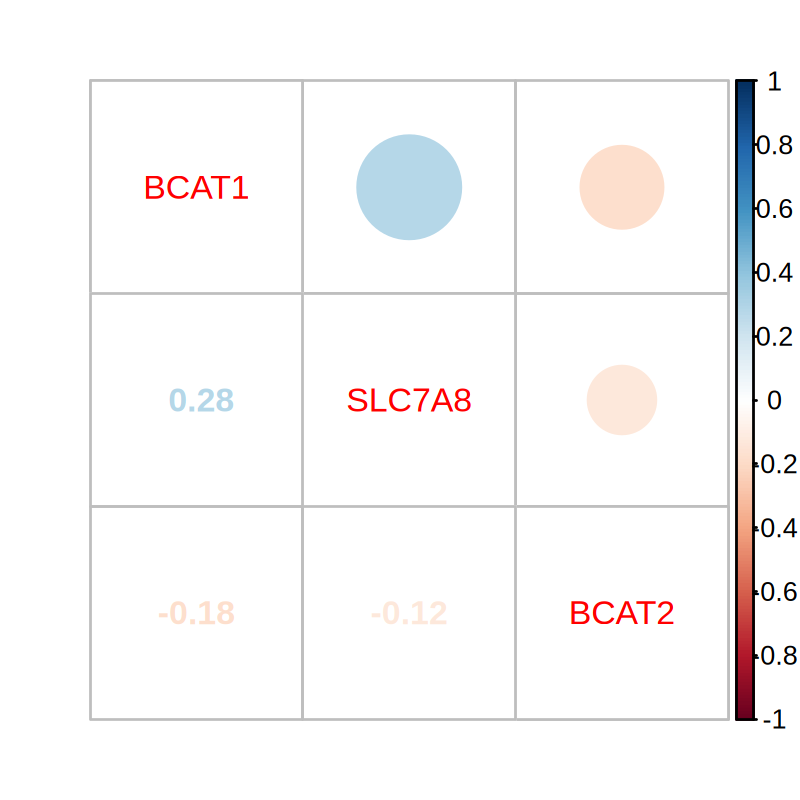

In [249]:
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 200)
plotdat = as.data.table(t(logcpm_coding[genes, ]), keep.rownames = F)
plotdat = cor(plotdat)
head(plotdat)
#corrplot(plotdat, method = 'ellipse') # colorful number
corrplot.mixed(plotdat, order = 'AOE')


# plot along the chromosome

In [925]:
library(OmicCircos)

In [ ]:
data ("UCSC.mm10.chr" , package="OmicCircos") ;
UCSC.mm10.chr

In [932]:
chrom_size_file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/genomes/t2t/t2t_sizes_genome'
chrom_size = fread(chrom_size_file)
chrom_size = chrom_size[chrom != 'chrM', ]
setnames(chrom_size, c('chrom', 'chrom_len'))
chrom_size[, start := cumsum(c(1, chrom_size$chrom_len[1:(nrow(chrom_size) - 1)]))] 
chrom_size[, end := cumsum( chrom_len )]
chrom_size


Warning message in eval(jsub, SDenv, parent.frame()):
"integer overflow in 'cumsum'; use 'cumsum(as.numeric(.))'"


chrom,chrom_len,start,end
<chr>,<int>,<dbl>,<int>
chr1,248387328,1,248387328
chr2,242696752,248387329,491084080
chr3,201105948,491084081,692190028
chr4,193574945,692190029,885764973
chr5,182045439,885764974,1067810412
chr6,172126628,1067810413,1239937040
chr7,160567428,1239937041,1400504468
chrX,154259566,1400504469,1554764034
chr9,150617247,1554764035,1705381281


# export

In [156]:
write.table(logcpm_3batch, file = 'logcpm_3batch_Jun24.tsv')
write.table(logcpm_3batch_t, file = 'logcpm_3batch_t_Jun24.tsv')
write.table(dsn, file = 'dsn_Jun24.tsv') 


In [2]:
getwd()

[1] "/research/rgs01/home/clusterHome/whu78/script/Farhan"

# backup code 

In [ ]:
mm = rep(-1, length(cell_types))
deg_list = lapply(1:length(mm), function(ii){
    mm_ii = mm
    mm_ii[ii] = 1
    deg = glmQLFTest(fit, contrast = mm_ii) 
    deg = topTags(deg, n = nrow(fit$counts))
    as.data.table(deg$table, keep.rownames = T)

})


In [ ]:
names(deg_list) = cell_types
deg_dt = rbindlist(deg_list, idcol = T)
head(deg_dt)


In [304]:
deg = as.data.table(deg$table, keep.rownames = T)


In [281]:
cell_type_deg_list = lapply(cell_types, function(cc) {
    dsn_all_df$ctype = 'Other'
    dsn_all_df$ctype[dsn_all_df$cell_type == cc] = cc
    dsn_all_df$ctype = factor(dsn_all_df$ctype, levels = c('Other', cc))

    subtype = factor(dsn_all_df$ctype)
    subtype = relevel(subtype, ref = 'Other')

    dge = DGEList(counts=mtx_all_df, group = subtype)
    dge <- calcNormFactors(dge)

    keep = filterByExpr(dge)
    dge = dge[keep, , keep.lib.sizes=FALSE]
    dge = normLibSizes(dge)
    design = model.matrix( ~ 0 + subtype)
    dge = estimateDisp(dge, design)
    et <- exactTest(dge)
    deg = topTags(et, n = length(keep))
    as.data.table(deg$table, keep.rownames = T)
})


In [282]:
names(cell_type_deg_list) = cell_types
cell_type_deg_dt = rbindlist(cell_type_deg_list, idcol = T)
head(cell_type_deg_dt)


.id,rn,logFC,logCPM,PValue,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
CLP,LOC729732,7.099587,2.520014,8.771559e-15,3.578270e-10
CLP,RPL9P32,5.824768,1.811781,1.850210e-13,3.773874e-09
CLP,JCHAIN,7.466197,8.304650,4.735865e-13,6.439830e-09
CLP,ACAD8,-10.188906,4.046673,2.783873e-12,2.839133e-08
CLP,TP53INP1,3.710188,7.483967,4.106388e-12,3.350320e-08
CLP,DNTT,8.111659,7.080440,4.185078e-11,2.845434e-07


In [277]:
(cell_type_deg_dt)


<0 x 0 matrix>

In [271]:
cell_types

[1] "CLP" "CMP" "EB"  "GMP" "HSC" "MEP" "MK"  "MPP"

In [272]:
dim(cell_type_deg_dt[.id == 'MEP' & abs(logFC) > 1 & FDR < 0.05, ])

[1] 38365     7

In [250]:
summary(cell_type_deg_dt[.id == 'MEP' & abs(logFC) > 1 & FDR < 0.05, logFC])


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-29.848 -29.848 -21.944 -22.595 -17.030  -5.269 

In [235]:
deg_sig = cell_type_deg_dt[abs(logFC) > 1 & FDR < 0.05, ]
length(unique(deg_sig[, rn]))


[1] 40794

In [236]:
head(deg_sig$rn)

[1] "AMD1"   "HADHB"  "FTO"    "STARD7" "SEC31A" "CFLAR"

In [ ]:
lapply(all_samples

In [ ]:
my.contrasts = makeContrasts(MNX1vsCD34=MNX1 - CD34, MNX1vsAML=MNX1 - Others, AMLvsCD34 = Others - CD34, levels=design)
MNX1vsCD34 = glmQLFTest(fit, contrast=my.contrasts[,"MNX1vsCD34"])
MNX1vsCD34 = topTags(MNX1vsCD34, n=nrow(MNX1vsCD34$table), adjust.method="fdr")

MNX1vsAML = glmQLFTest(fit, contrast=my.contrasts[,"MNX1vsAML"])
MNX1vsAML = topTags(MNX1vsAML, n=nrow(MNX1vsAML$table), adjust.method="fdr")

AMLvsCD34 = glmQLFTest(fit, contrast=my.contrasts[,"AMLvsCD34"])
AMLvsCD34 = topTags(AMLvsCD34, n=nrow(AMLvsCD34$table), adjust.method="fdr")


## maSigPro

In [218]:
#Time	Replicate	Control	ME	MX	MX_ME
head(dsn_all)


sample_name,cell_type
<chr>,<chr>
CLP1,CLP
CLP2,CLP
CLP3,CLP
CMP1,CMP
CMP2,CMP
CMP3,CMP


In [265]:
dsn_time = copy(dsn_all) 
dsn_time[, cell_type := as.integer(factor(cell_type, levels = cell_types)) ] 
dsn_time[, Time := as.integer(cell_type)] 
#dsn_time[, Replicate := as.integer(sub('(\\d+)', '', sample_name))] 
#dsn_time[, Replicate := sub('(\\d+)', '\1', sample_name)] 
dsn_time[grep('1', sample_name), Replicate := 1]
dsn_time[grep('2', sample_name), Replicate := 2]
dsn_time[grep('3', sample_name), Replicate := 3]
dsn_time[, HSC := as.integer(dsn_time$cell_type == 'HSC')]
dsn_time[, MPP := as.integer(dsn_time$cell_type == 'MPP')]
dsn_time[, CLP := as.integer(dsn_time$cell_type == 'CLP')]
dsn_time[, MEP := as.integer(dsn_time$cell_type == 'MEP')]
dsn_time[, CMP := as.integer(dsn_time$cell_type == 'CMP')]
dsn_time[, GMP := as.integer(dsn_time$cell_type == 'GMP')]
dsn_time[, EB := as.integer(dsn_time$cell_type == 'EB')]
dsn_time[, MK := as.integer(dsn_time$cell_type == 'MK')]
dsn_time_df = setDF(dsn_time[, 3:ncol(dsn_time)], rownames = dsn_time$sample_name) 
head(dsn_time_df) 


,Time,Replicate,HSC,MPP,CLP,MEP,CMP,GMP,EB,MK
,<int>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
CLP1,6,1,0,0,0,0,0,0,0,0
CLP2,6,2,0,0,0,0,0,0,0,0
CLP3,6,3,0,0,0,0,0,0,0,0
CMP1,3,1,0,0,0,0,0,0,0,0
CMP2,3,2,0,0,0,0,0,0,0,0
CMP3,3,3,0,0,0,0,0,0,0,0


In [ ]:
design = make.design.matrix(dsn_time_df, degree = 2)
fit <- p.vector(mtx_coding_df, design, Q = 0.3, MT.adjust = "BH", min.obs = 20)
tstep <- T.fit(fit, step.method = "backward", alfa = 0.05)
sigs <- get.siggenes(tstep, rsq = 0.6, vars = "groups")


In [276]:
names(sigs$sig.genes) 

[1] "HSC"      "MPPvsHSC" "CLPvsHSC" "MEPvsHSC" "CMPvsHSC" "GMPvsHSC" "EBvsHSC" 
[8] "MKvsHSC"

In [277]:
sigs_see = see.genes(sigs$sig.genes$MPPvsHSC, show.fit = T, dis = design$dis, cluster.method = "hclust" ,cluster.data = 1, k = 4)
head(sigs_see) 


[1] "warning: NULL data. No visualization possible"


,HSC,MPP,CLP,MEP,CMP,GMP,EB,MK
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
CLP1,0,0,0,0,0,0,0,0
CLP2,0,0,0,0,0,0,0,0
CLP3,0,0,0,0,0,0,0,0
CMP1,0,0,0,0,0,0,0,0
CMP2,0,0,0,0,0,0,0,0
CMP3,0,0,0,0,0,0,0,0
EB1,0,0,0,0,0,0,0,0
EB2,0,0,0,0,0,0,0,0
EB3,0,0,0,0,0,0,0,0


## using Seurat 

In [205]:
oo <- CreateSeuratObject(counts = mtx_all_df, project = "blue", min.cells = 3, min.features = 200)


Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Data is of class data.frame. Coercing to dgCMatrix."


In [206]:
oo

An object of class Seurat 
48581 features across 25 samples within 1 assay 
Active assay: RNA (48581 features, 0 variable features)
 1 layer present: counts

In [211]:
oo[["percent.mt"]] <- PercentageFeatureSet(oo, pattern = "^MT-")


Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"The following requested variables were not found: percent.mt"


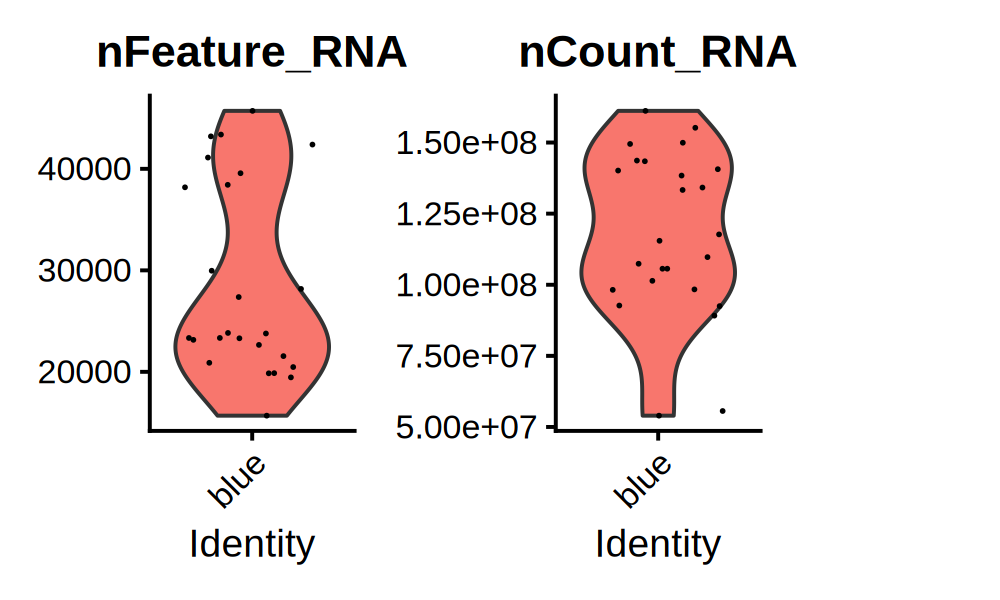

In [208]:
VlnPlot(oo, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)


Warning message in cor(x = data[, 1], y = data[, 2]):
"the standard deviation is zero"


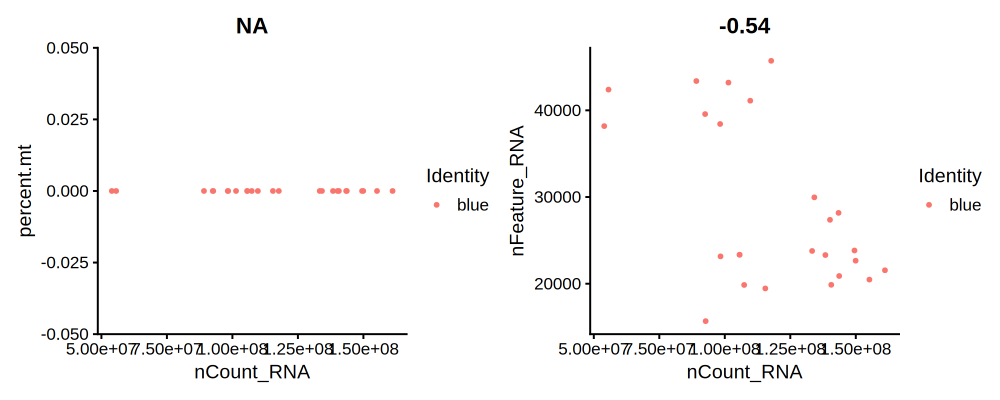

In [214]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
plot1 <- FeatureScatter(oo, feature1 = "nCount_RNA", feature2 = "percent.mt")
plot2 <- FeatureScatter(oo, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
plot1 + plot2


In [216]:
oo <- NormalizeData(oo, normalization.method = "LogNormalize", scale.factor = 10000)


Normalizing layer: counts



Finding variable features for layer counts

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
"ggrepel: 8 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


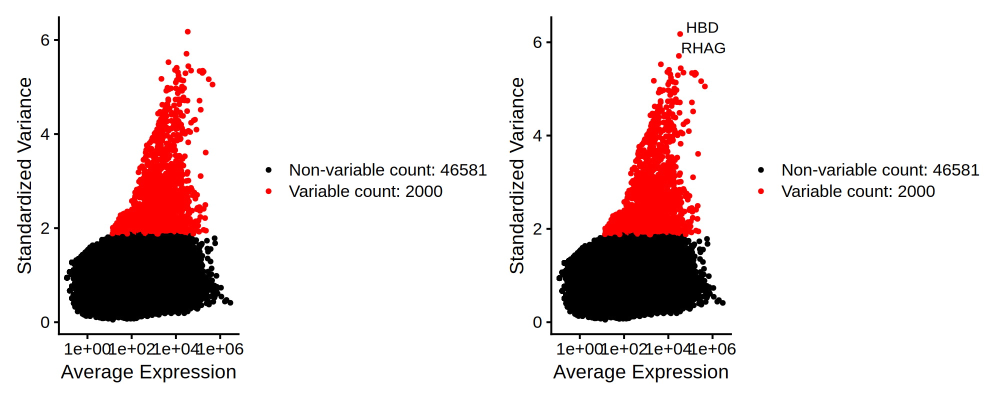

In [217]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
oo <- FindVariableFeatures(oo, selection.method = "vst", nfeatures = 2000)

# Identify the 10 most highly variable genes
top10 <- head(VariableFeatures(oo), 10)

# plot variable features with and without labels
plot1 <- VariableFeaturePlot(oo)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)
plot1 + plot2


In [218]:
all.genes <- rownames(oo)
oo <- ScaleData(oo, features = all.genes)

Centering and scaling data matrix



In [ ]:
my.contrasts = makeContrasts(MNX1vsCD34=MNX1 - CD34, MNX1vsAML=MNX1 - Others, AMLvsCD34 = Others - CD34, levels=design)
MNX1vsCD34 = glmQLFTest(fit, contrast=my.contrasts[,"MNX1vsCD34"])
MNX1vsCD34 = topTags(MNX1vsCD34, n=nrow(MNX1vsCD34$table), adjust.method="fdr")
